In [0]:
# Import libraries
import numpy as np
import pandas as pd
import matplotlib
import matplotlib.pyplot as plt
from matplotlib.backends.backend_pdf import PdfPages
import csv
from datetime import time
import datetime
import os
import matplotlib.dates as mdates
from statsmodels.tsa.stattools import pacf
from statsmodels.tsa.stattools import acf
from statsmodels.graphics.tsaplots import plot_pacf
from statsmodels.graphics.tsaplots import plot_acf
from statsmodels.distributions.empirical_distribution import ECDF
import statsmodels.api as sm
import statsmodels.tsa.api as smt
from statsmodels.tsa.arima_model import ARMAResults
import scipy.stats as scs
import json

/usr/local/lib/python3.6/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


In [0]:
path = "/content/drive/My Drive/Colab Notebooks/DATA_EI/"
path_data_frame = "/content/drive/My Drive/Colab Notebooks/Dataframe_EI/"
path_data_frame_deseasonal = "/content/drive/My Drive/Colab Notebooks/Dataframe_EI_deseasonal"

In [0]:

print(os.listdir(path))

for stock in os.listdir(path):
  print(stock)
  for day_trade_bbo in os.listdir(path+'/'+stock):
    day = day_trade_bbo[:10]
    data_trade = extract_data(path+'/'+stock+'/'+day+'-'+stock+'-trade.csv.gz')
    data_bbo = extract_data(path+'/'+stock+'/'+day+'-'+stock+'-bbo.csv.gz')
    df_bbo = pd.read_csv(path+'/'+stock+'/'+day_trade_bbo)
    myDateTime1 = datetime.datetime(year=1899, month=12, day=30)
    myDateTime2 = datetime.datetime(year=1970, month=1, day=1)
    delta = myDateTime2-myDateTime1

    df_bbo["xltime"] = pd.to_datetime(df_bbo["xltime"], unit='D', utc=True, origin='unix')
    df_bbo["xltime"] = df_bbo["xltime"]-delta
    df_bbo.xltime = df_bbo.xltime.dt.tz_convert("Europe/Paris")
    df_bbo=df_bbo.set_index('xltime')
    df = df_bbo.between_time('9:00', '17:30')
    df.head(0)
    print(df.resample('D').mean())


In [0]:
def extract_data(path) :
  data = pd.read_csv(path)
  myDateTime1 = datetime.datetime(year=1899, month=12, day=30)
  myDateTime2 = datetime.datetime(year=1970, month=1, day=1)
  delta = myDateTime2 - myDateTime1
    
  data["xltime"] = pd.to_datetime(data["xltime"], unit='D', utc=True, origin='unix')
  data["xltime"] = data["xltime"]-delta
  data.xltime = data.xltime.dt.tz_convert("Europe/Paris")
    
  data = data.set_index('xltime')
  return data.between_time('9:05', '17:30')

In [0]:
date_index = pd.date_range("9:05", "17:25", freq="5min").time
data = extract_data(path + '/ACCP.PA/2015-01-02-ACCP.PA-bbo.csv.gz')
#print(data.info())
data = data.resample('10s').mean()
print(data.info())
print(data.head(40))
print(len(data.resample("5min")))
data = data.resample("5min").max()
print(data.info())
print(data.head(40))

,indice1,indice2,indice 3,indice3


In [0]:
def concatanate_data(path, stock) :
  
  dates = pd.date_range("9:05", "17:25", freq="5min").time
  data_concatenate = pd.DataFrame(columns = ["spread", "traded_value", "volatility","book_size", "time", "date"])
  counter = 1
  for day_trade_bbo in os.listdir(path+stock):
    data = pd.DataFrame(columns = ["spread", "traded_value", "volatility", "book_size", "time", "date"])
    day = day_trade_bbo[:10]
    if "bbo" in day_trade_bbo:
      data_bbo = extract_data(path+stock+'/'+day+'-'+stock+'-bbo.csv.gz')
      data_trade = extract_data(path+stock+'/'+day+'-'+stock+'-trade.csv.gz')

      #Spread
      spread = data_bbo["ask-price"] - data_bbo["bid-price"]
      spread = spread.resample('5min').mean()

      #Book-size
      book_size = data_bbo['bid-volume'] + data_bbo['ask-volume']
      book_size = book_size.resample('5min').mean()

      #Trade-value
      trade_total = data_trade['trade-price']*data_trade['trade-volume']
      trade_total = trade_total.resample('5min').sum()

      #Volatility
      freq_10  = data_bbo["bid-price"].resample("10s").mean()
      freq_10_5 = freq_10.resample("5min")
      freq_10 = freq_10.values
      max_prices = freq_10_5.max().values
      min_prices = freq_10_5.min().values
      open_prices = [] # après la boucle même taille que freq_10_5 i.e 101
      closed_prices = [] # en i, contiennent prix d'ouv/fermeture pour
      if stock =="LAGA.PA" or stock == "LOIM.PA":
        sigma = [0]*101
      else:
        sigma = []
        for i in range(len(freq_10_5)):
          open_prices.append(freq_10[30*i])
          closed_prices.append(freq_10[30*(i+1)-1])
          sigma.append((0.5*np.log(max_prices[i]/min_prices[i])**2 - (2*np.log(2)-1)*np.log(closed_prices[i]/open_prices[i])**2)**0.5)

      counter += 1

      if stock == "LAGA.PA" or stock == "PEUP.PA":
        data["traded_value"]  = [0]*101
      else:
        data["traded_value"]  = trade_total.values

      data["spread"] = spread.values
      data["book_size"] = book_size.values
      data["volatility"] = sigma
      data["time"] = dates
      data["date"] = pd.to_datetime(data_bbo.resample('5min').mean().index).date

      if data_concatenate.empty :
        data_concatenate = data
      else:
        data_concatenate = pd.concat([data_concatenate, data])

  return data_concatenate.sort_values(by=['date', 'time'])
  #return data_concatenate

Sauvegarde des dataframes

In [0]:
dates = pd.date_range("9:05", "17:25", freq="5min")
for stock in os.listdir(path):
  print("In progress {}".format(stock))
  data = concatanate_data(path, stock)
  data.to_csv("/content/drive/My Drive/Colab Notebooks/Dataframe_EI/{}.csv.gz".format(stock), compression='gzip')

############################## Déjà fait ###################

In progress ACCP.PA
In progress ALUA.PA
In progress BNPP.PA
In progress AXAF.PA
In progress CAPP.PA
In progress BOUY.PA
In progress CARR.PA
In progress ALSO.PA
In progress CAGR.PA
In progress EDF.PA
In progress DANO.PA
In progress ESSI.PA
In progress LAGA.PA
In progress PUBP.PA
In progress PERP.PA


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:40: RuntimeWarning: invalid value encountered in double_scalars


In progress PEUP.PA
In progress PRTP.PA
In progress RENA.PA
In progress MICP.PA
In progress LOIM.PA
In progress OREP.PA
In progress VLOF.PA
In progress TOTF.PA
In progress STM.PA
In progress AIRP.PA
In progress SAF.PA
In progress SASY.PA
In progress SCHN.PA
In progress STO1.EX


Plot des dataframes

In progress ACCP.PA


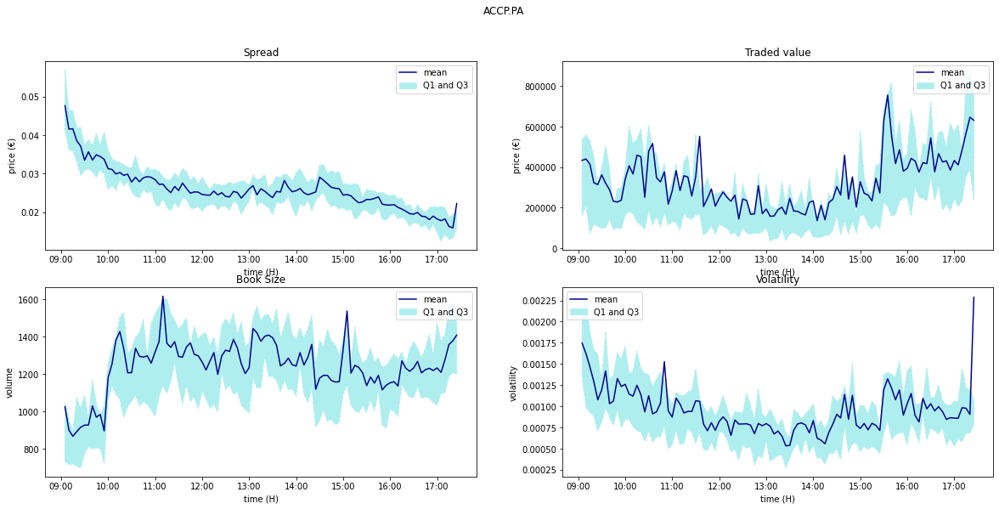

ACCP.PA Done
In progress ALUA.PA


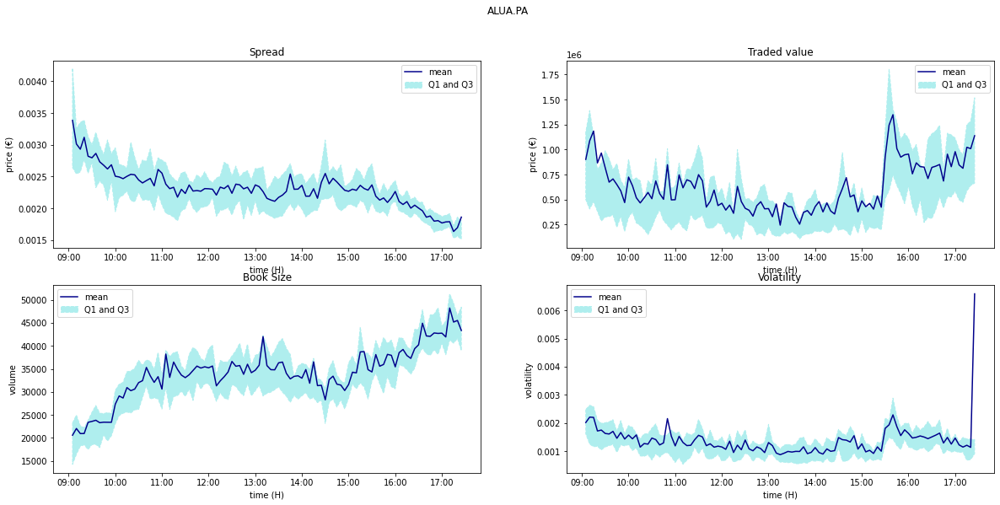

ALUA.PA Done
In progress BNPP.PA


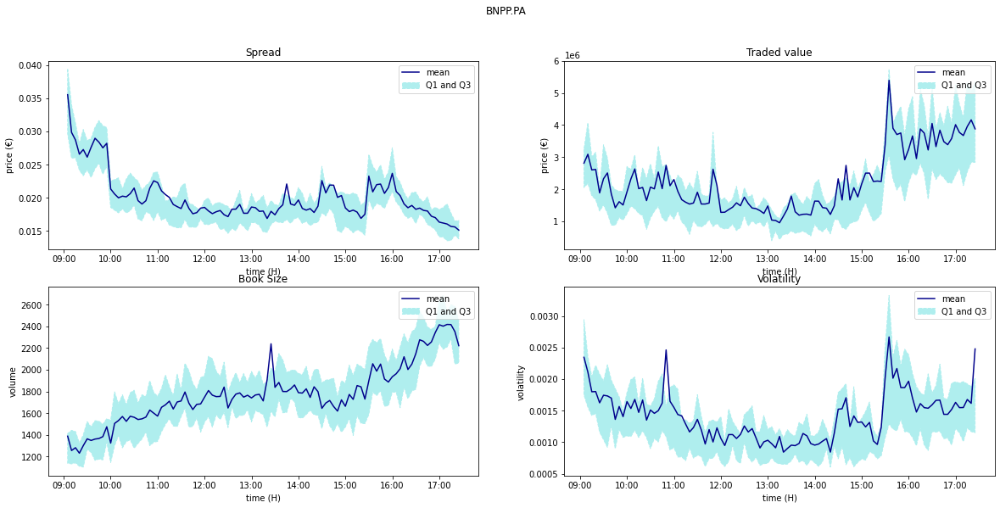

BNPP.PA Done
In progress AXAF.PA


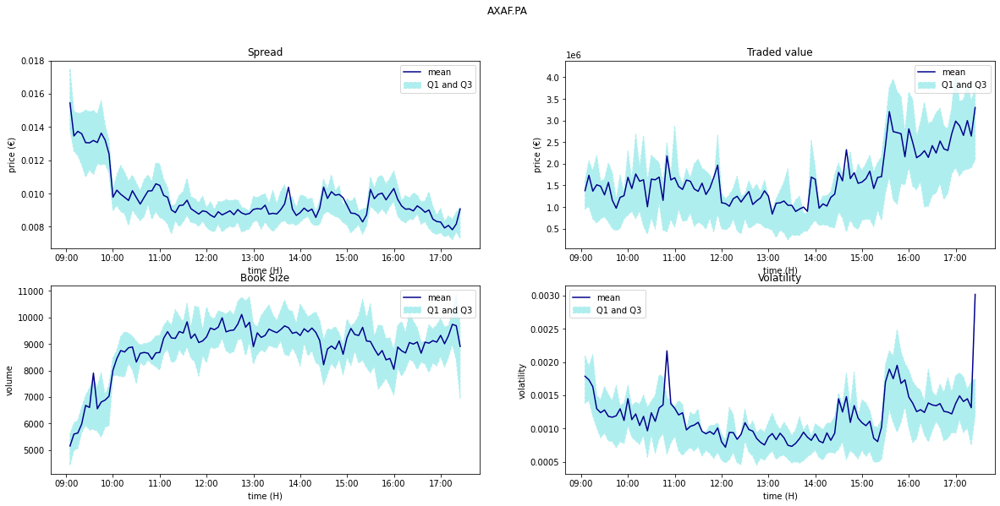

AXAF.PA Done
In progress CAPP.PA


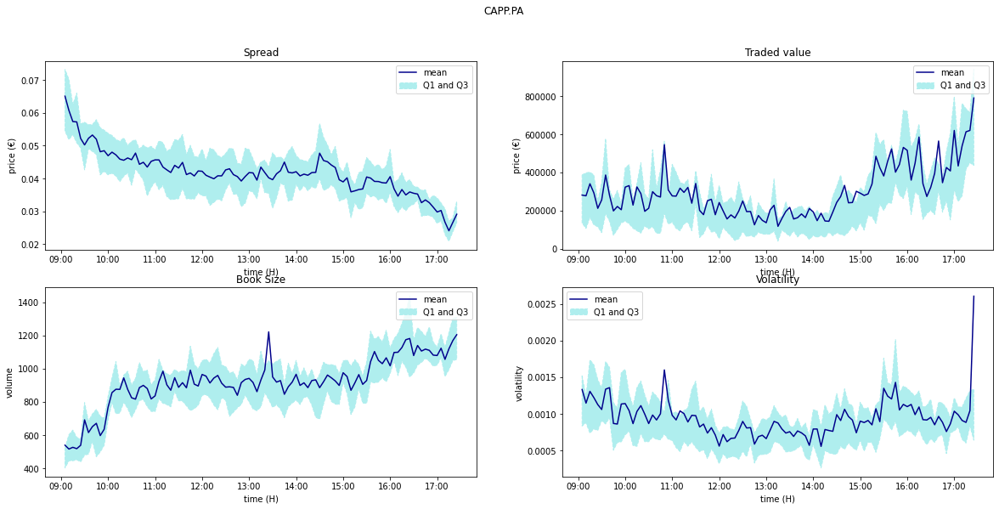

CAPP.PA Done
In progress BOUY.PA


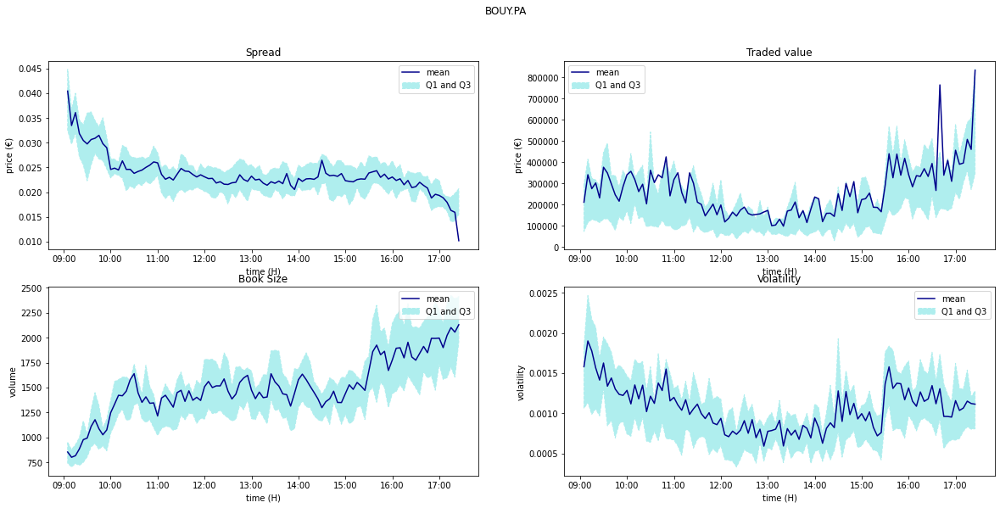

BOUY.PA Done
In progress CARR.PA


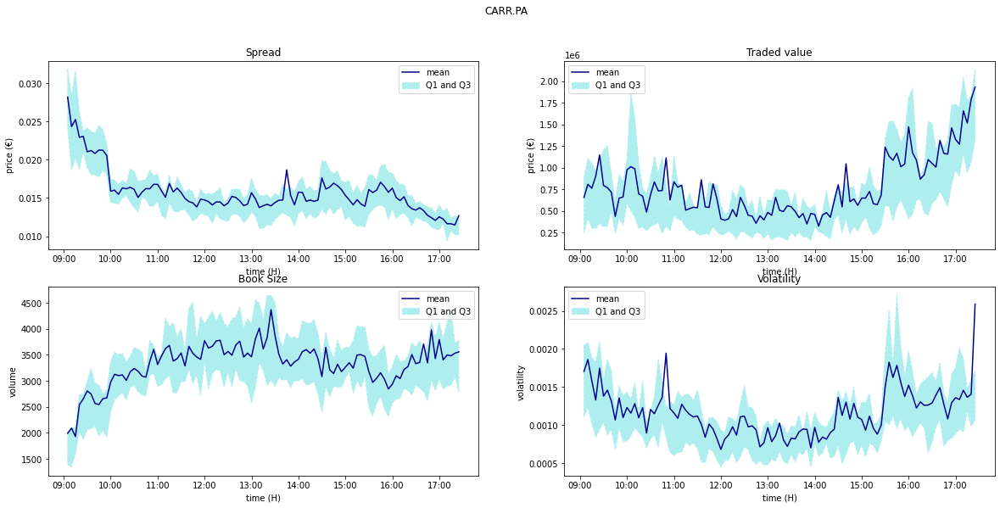

CARR.PA Done
In progress ALSO.PA


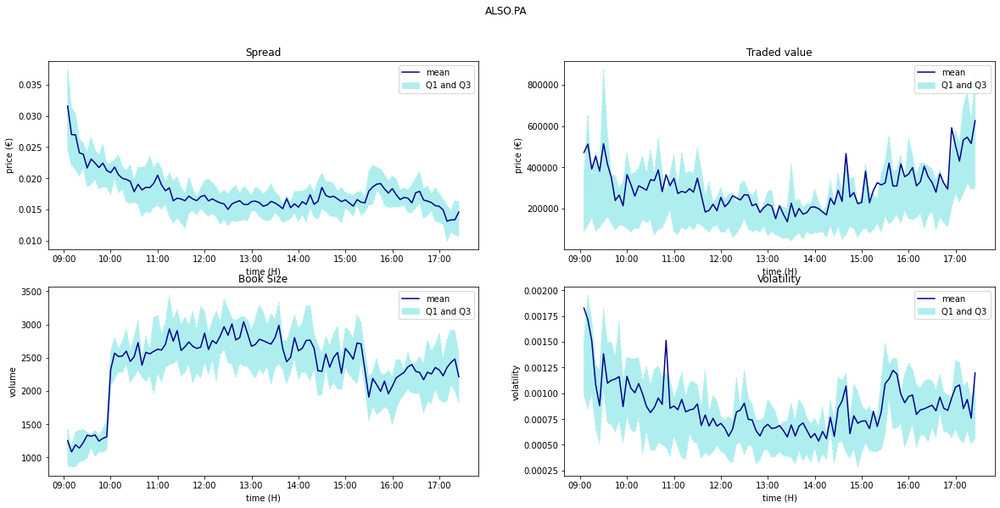

ALSO.PA Done
In progress CAGR.PA


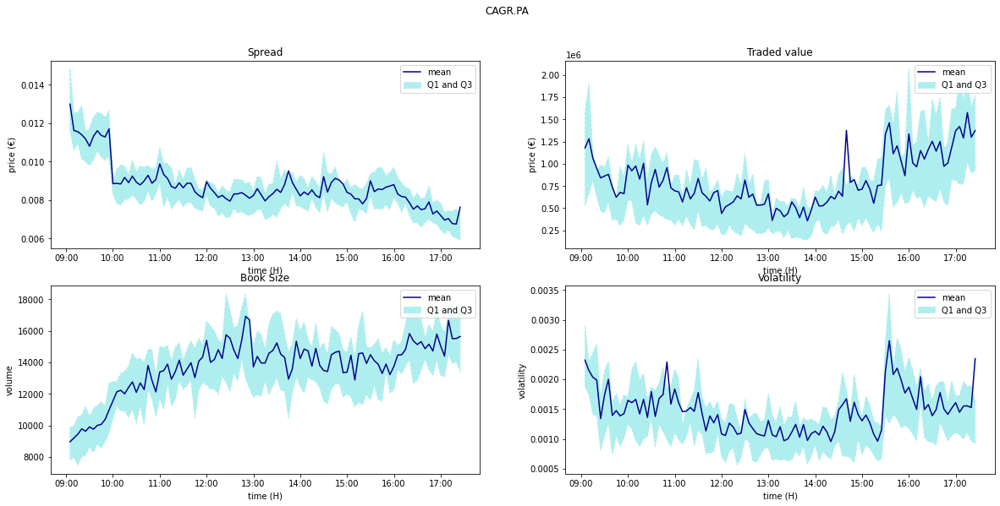

CAGR.PA Done
In progress EDF.PA


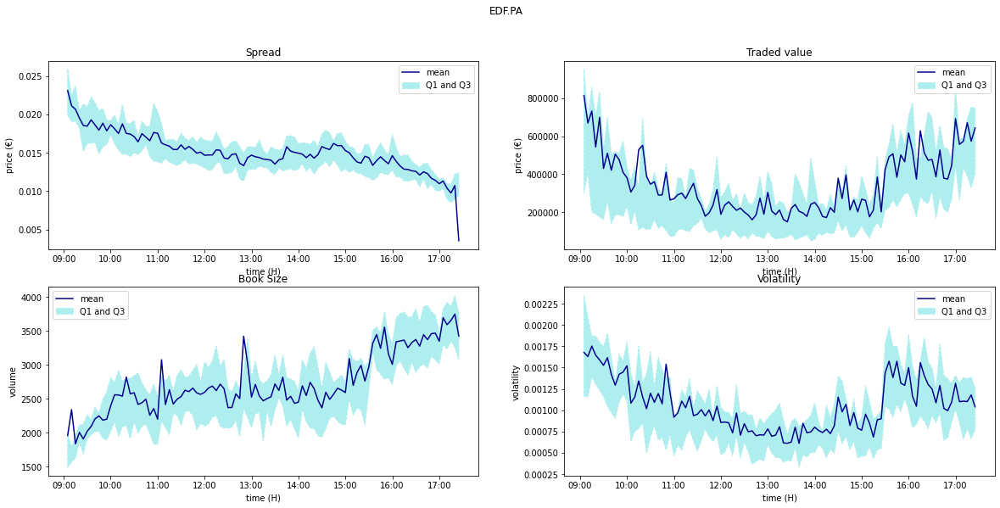

EDF.PA Done
In progress DANO.PA


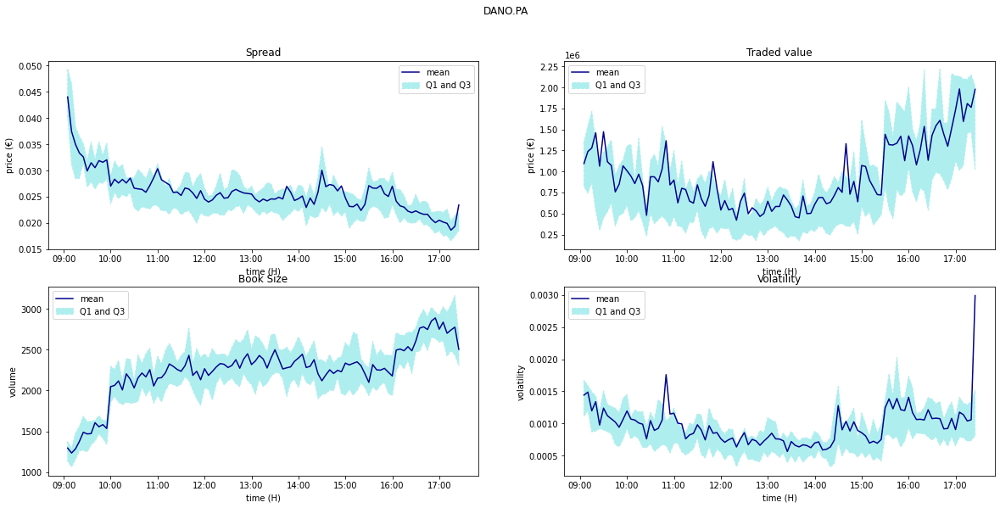

DANO.PA Done
In progress ESSI.PA


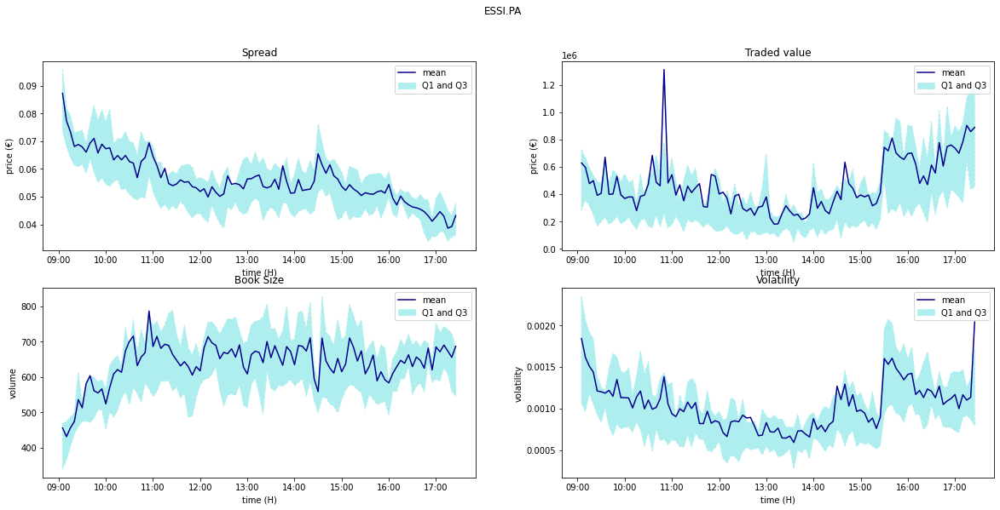

ESSI.PA Done
In progress PUBP.PA


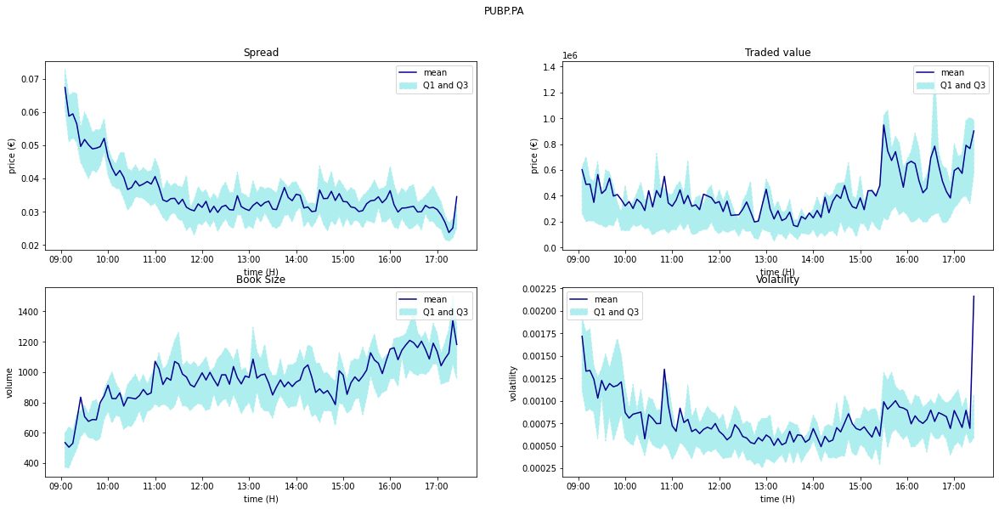

PUBP.PA Done
In progress PERP.PA


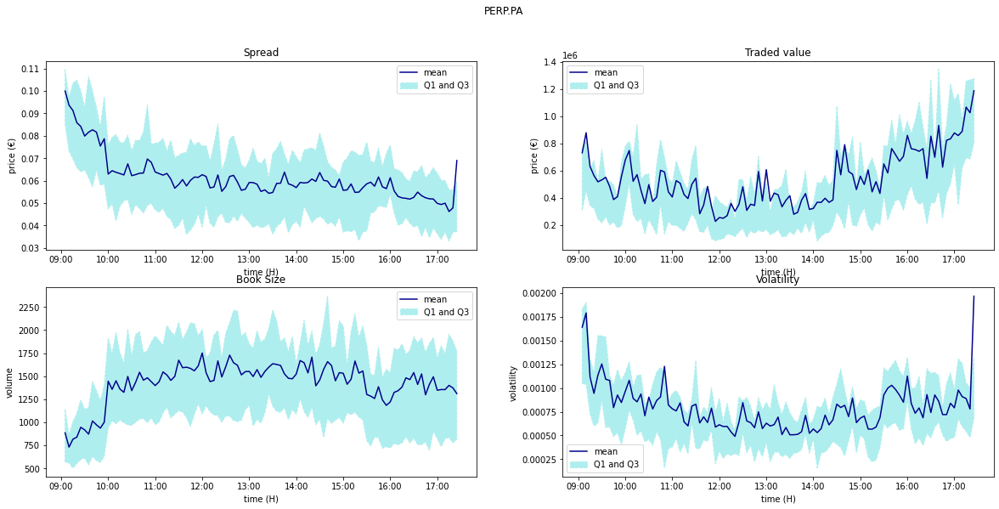

PERP.PA Done
In progress PRTP.PA


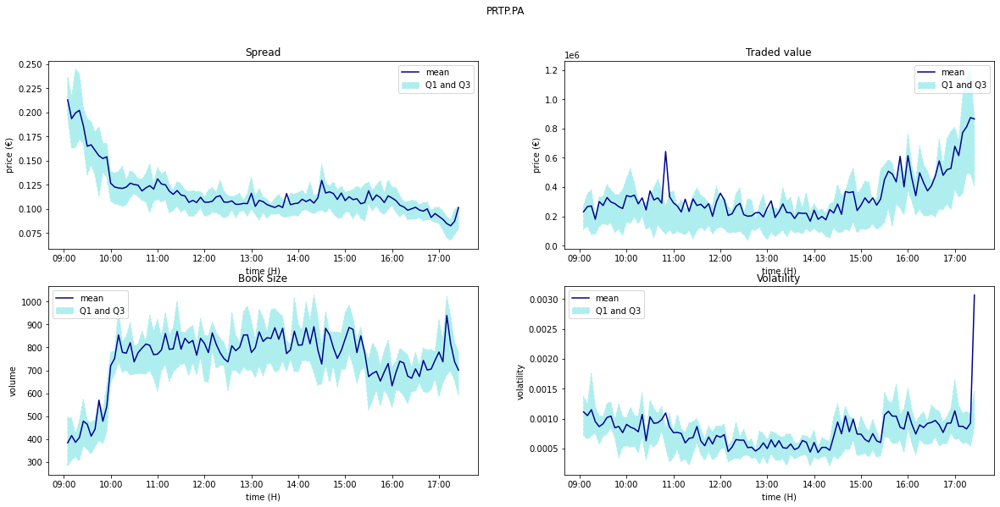

PRTP.PA Done
In progress RENA.PA


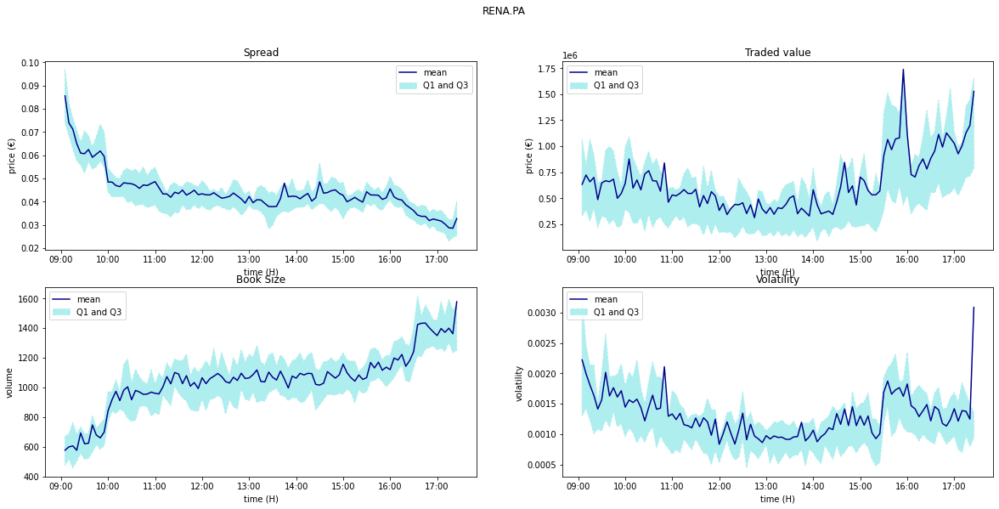

RENA.PA Done
In progress MICP.PA


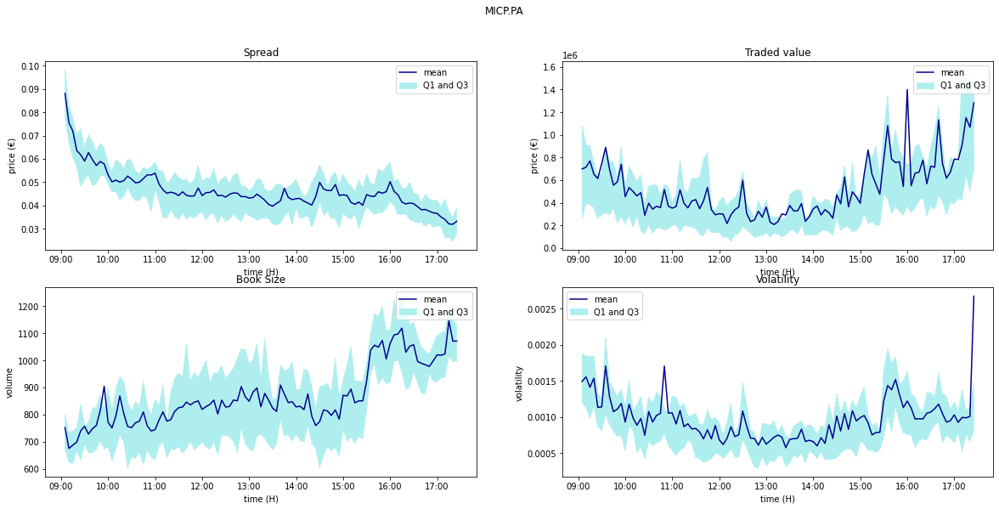

MICP.PA Done
In progress OREP.PA


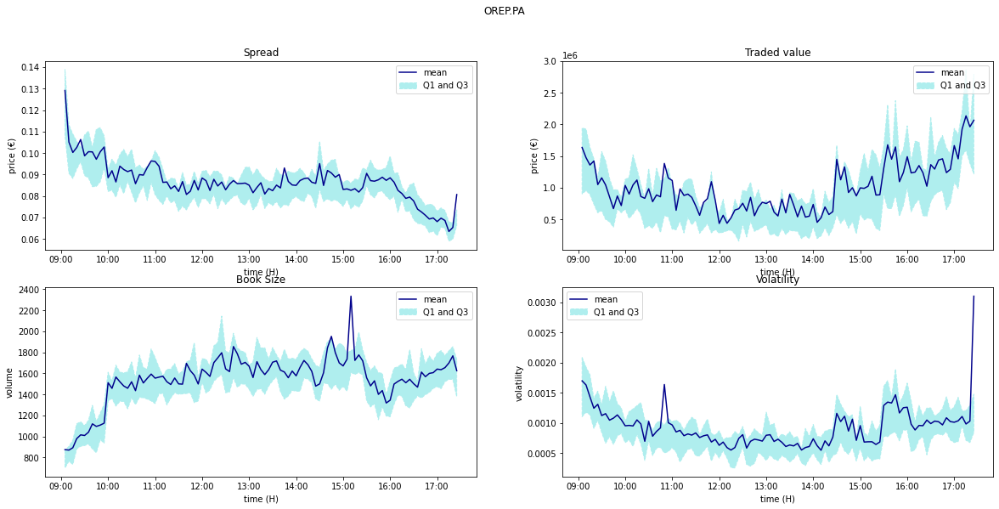

OREP.PA Done
In progress VLOF.PA


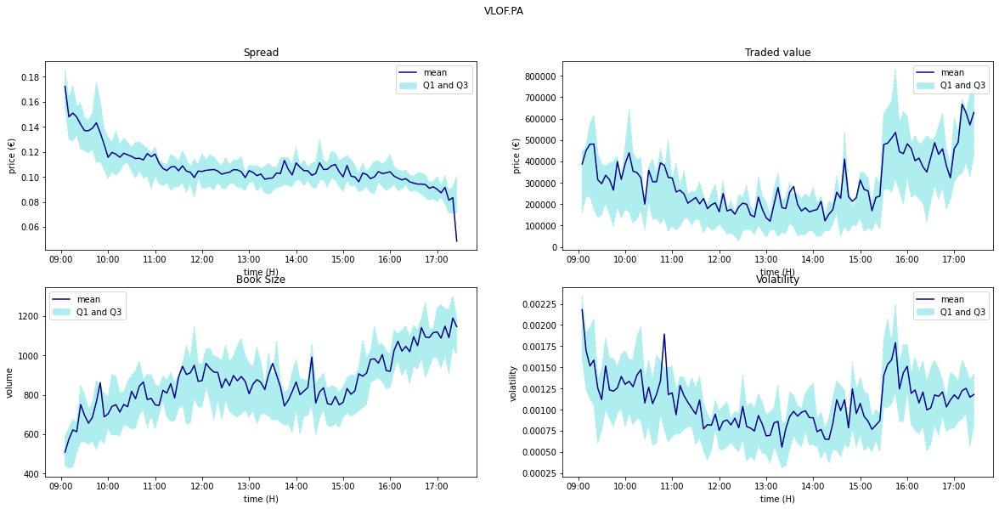

VLOF.PA Done
In progress TOTF.PA


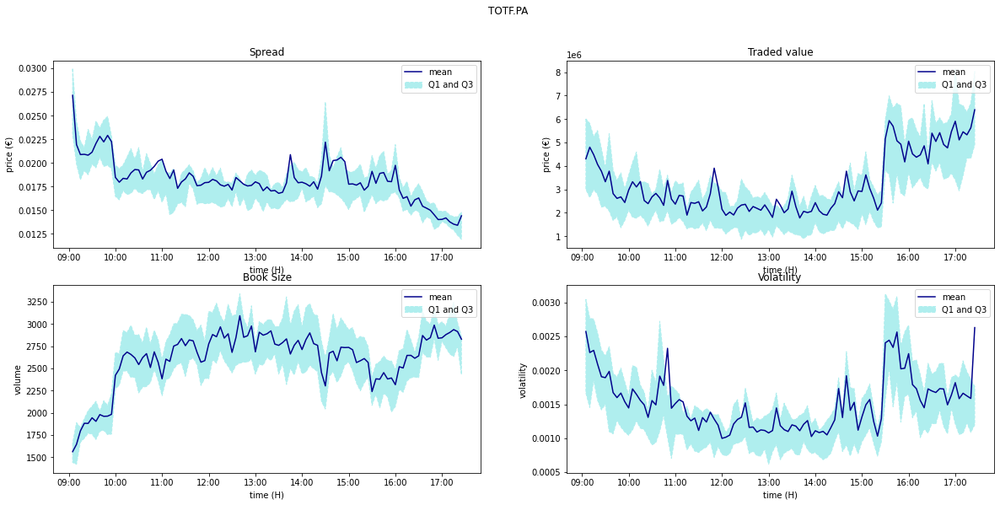

TOTF.PA Done
In progress STM.PA


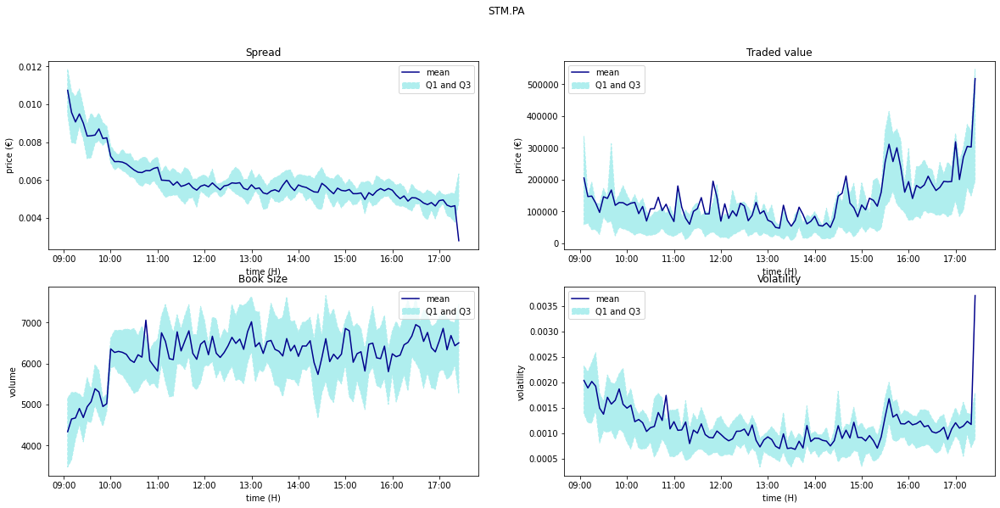

STM.PA Done
In progress AIRP.PA


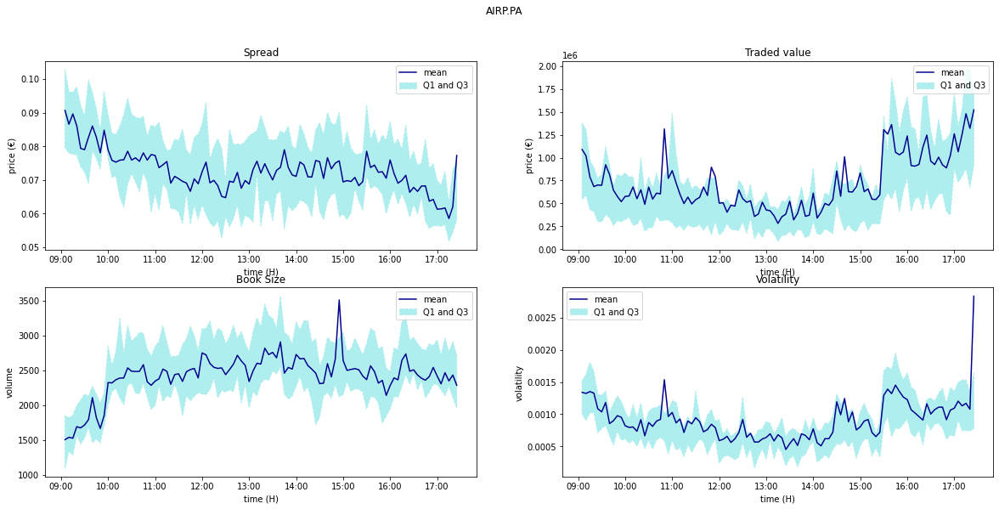

AIRP.PA Done
In progress SAF.PA


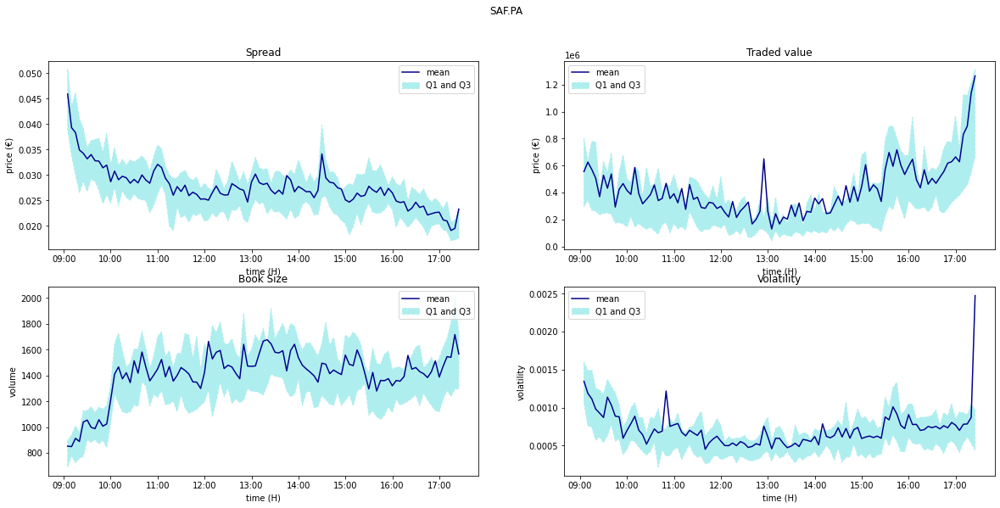

SAF.PA Done
In progress SASY.PA


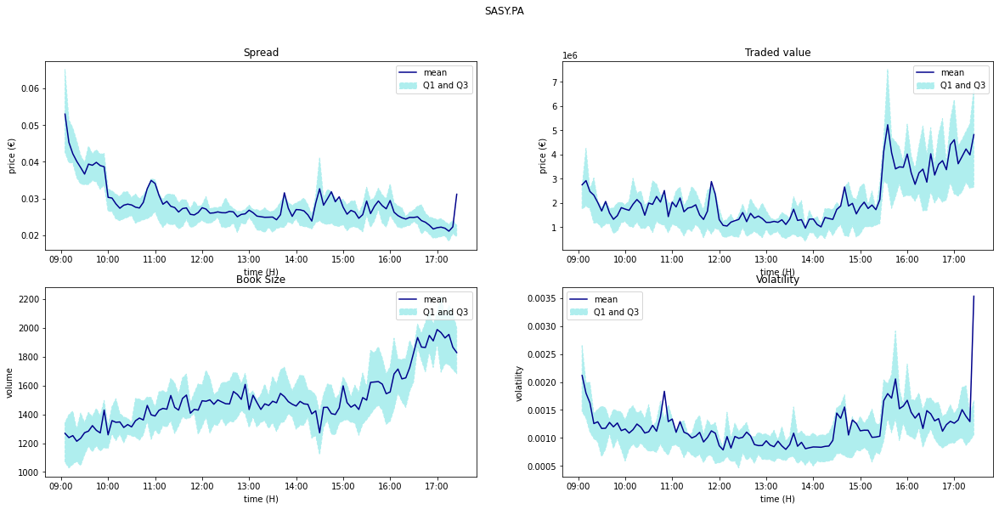

SASY.PA Done
In progress SCHN.PA


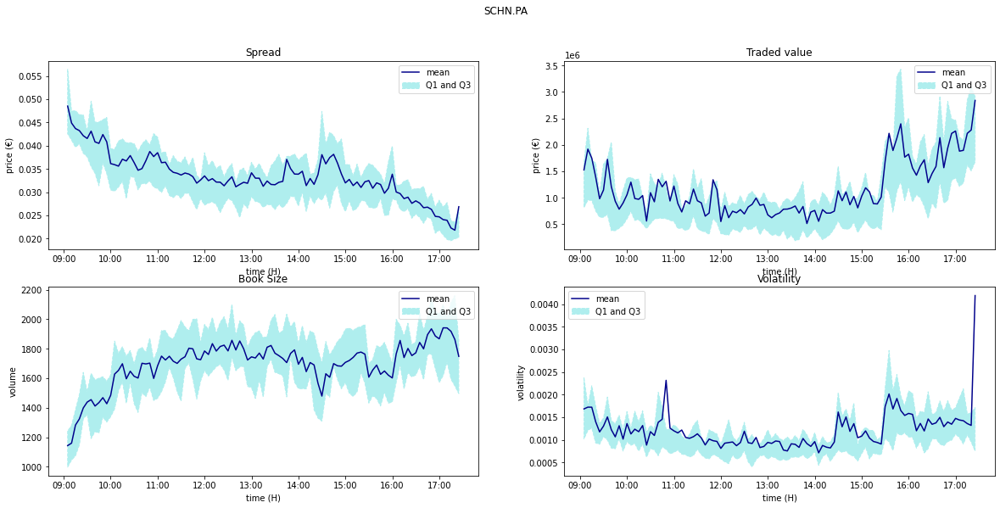

SCHN.PA Done
In progress STO1.EX


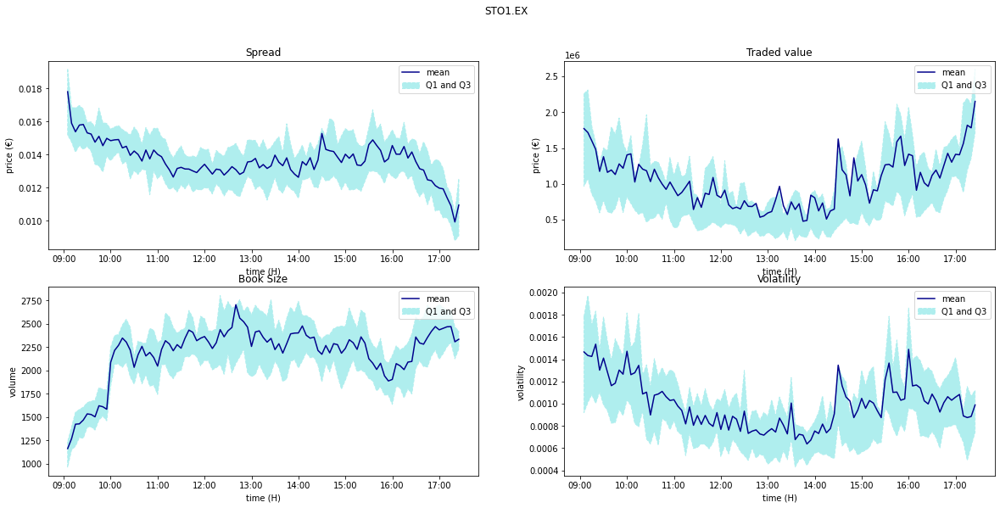

STO1.EX Done
In progress LAGA.PA


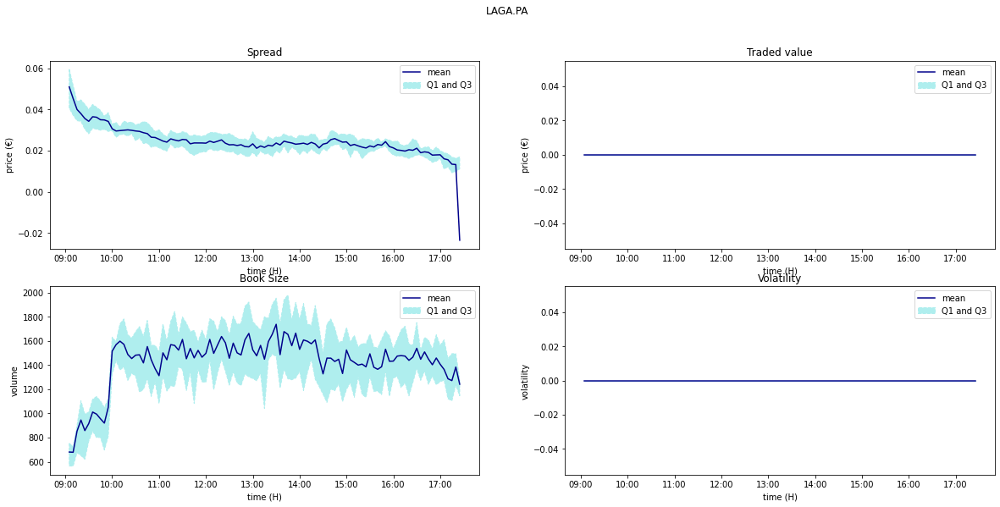

LAGA.PA Done
In progress PEUP.PA


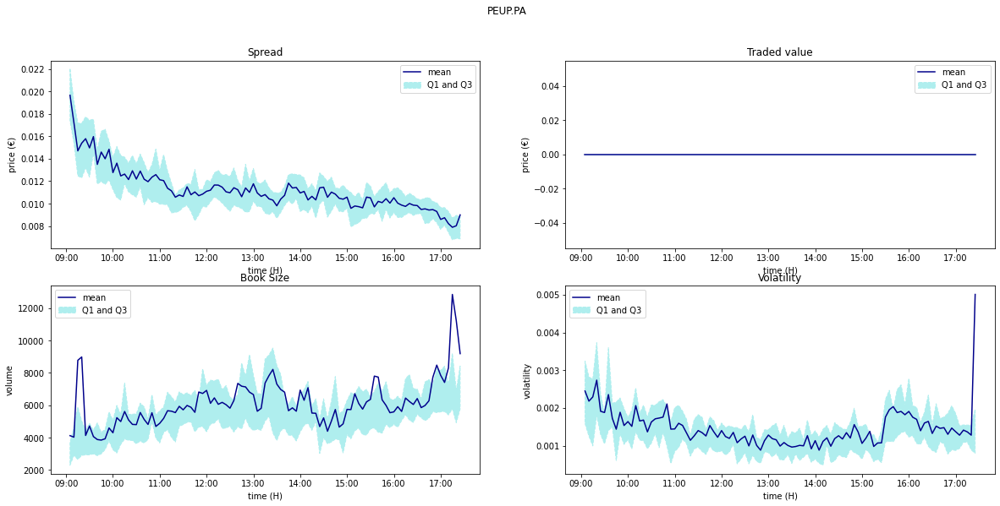

PEUP.PA Done
In progress LOIM.PA


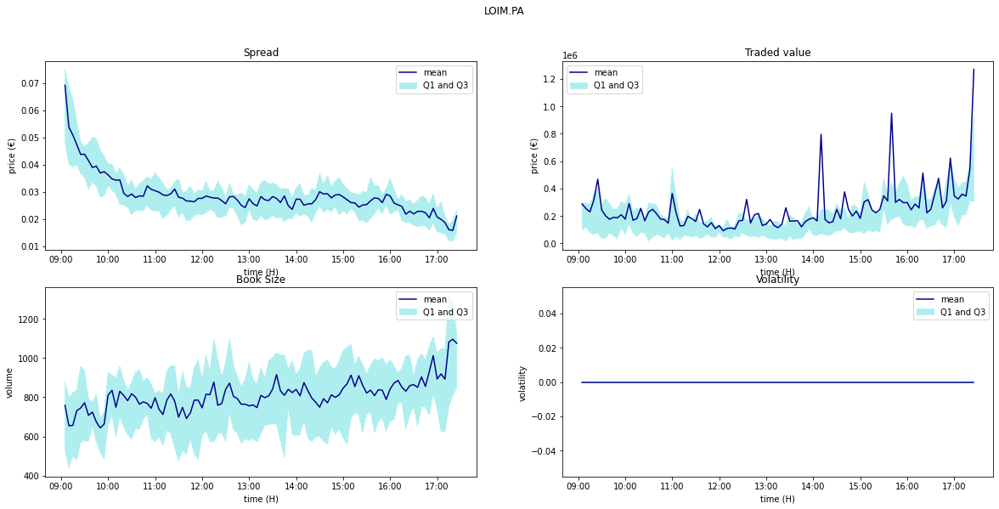

LOIM.PA Done


In [0]:
dates = pd.date_range("9:05", "17:25", freq="5min")
outputPdf = PdfPages('day1-indicators.pdf')
for stock in os.listdir(path_data_frame):
  print("In progress {}".format(stock[:-7]))
  data = pd.read_csv(path_data_frame + stock)
  del data["date"] # supprimer cette colonne car pose problème pour le calcul des quantiles

  plots = data.groupby('time')

  spread_mean = plots.mean()["spread"].values
  spread_Q1 = plots.quantile(0.25)["spread"].values
  spread_Q2 = plots.quantile(0.5)["spread"].values
  spread_Q3 = plots.quantile(0.75)["spread"].values

  book_size_mean = plots.mean()["book_size"].values
  book_size_Q1 = plots.quantile(0.25)["book_size"].values
  book_size_Q2 = plots.quantile(0.5)["book_size"].values
  book_size_Q3 = plots.quantile(0.75)["book_size"].values

  traded_value_mean = plots.mean()["traded_value"].values
  traded_value_Q1 = plots.quantile(0.25)["traded_value"].values
  traded_value_Q2 = plots.quantile(0.5)["traded_value"].values
  traded_value_Q3 = plots.quantile(0.75)["traded_value"].values

  volatility_mean = plots.mean()["volatility"].values
  volatility_Q1 = plots.quantile(0.25)["volatility"].values
  volatility_Q2 = plots.quantile(0.5)["volatility"].values
  volatility_Q3 = plots.quantile(0.75)["volatility"].values


  fig, axs = plt.subplots(2, 2, figsize=(20,9))
  fig.suptitle("{}".format(stock[:-7]))
  #fig.autofmt_xdate()
  xfmt = mdates.DateFormatter('%H:%M')

  axs[0,0].plot(dates, spread_mean, color = "darkblue", label="mean")
  #axs[0,0].plot(dates, spread_Q1, '--', label="Q1")
  #axs[0,0].plot(dates, spread_Q2, '--', label="Q2")
  #axs[0,0].plot(dates, spread_Q3, '--', label="Q3")
  axs[0,0].fill_between(dates, spread_Q1, spread_Q3, color="paleturquoise", linestyle="--", label="Q1 and Q3")
  axs[0,0].set_title("Spread")
  axs[0,0].xaxis.set_major_formatter(xfmt)
  axs[0,0].set(xlabel='time (H)', ylabel='price (€)')
  axs[0,0].legend(fancybox=True)

  axs[0,1].plot(dates, traded_value_mean[:101], color = "darkblue", label="mean")
  #axs[0,1].plot(dates, traded_value_Q1[:101], '--', label="Q1")
  #axs[0,1].plot(dates, traded_value_Q2[:101], '--', label="Q2")
  #axs[0,1].plot(dates, traded_value_Q3[:101], '--', label="Q3")
  axs[0,1].fill_between(dates, traded_value_Q1, traded_value_Q3, color="paleturquoise", linestyle="--", label="Q1 and Q3")
  axs[0,1].set_title("Traded value")
  axs[0,1].xaxis.set_major_formatter(xfmt)
  axs[0,1].set(xlabel='time (H)', ylabel='price (€)')
  axs[0,1].legend(fancybox=True)

  axs[1,0].plot(dates, book_size_mean, color = "darkblue", label="mean")
  #axs[1,0].plot(dates, book_size_Q1, '--', label="Q1")
  #axs[1,0].plot(dates, book_size_Q2, '--', label="Q2")
  #axs[1,0].plot(dates, book_size_Q3, '--', label="Q3")
  axs[1,0].fill_between(dates, book_size_Q1, book_size_Q3, color="paleturquoise", linestyle="--", label="Q1 and Q3")
  axs[1,0].set_title("Book Size")
  axs[1,0].xaxis.set_major_formatter(xfmt)
  axs[1,0].set(xlabel='time (H)', ylabel='volume')
  axs[1,0].legend(fancybox=True)

  axs[1,1].plot(dates, volatility_mean, color = "darkblue", label="mean")
  #axs[1,1].plot(dates, volatility_Q1, '--', label="Q1")
  #axs[1,1].plot(dates, volatility_Q2, '--', label="Q2")
  #axs[1,1].plot(dates, volatility_Q3, '--', label="Q3")
  axs[1,1].fill_between(dates, volatility_Q1, volatility_Q3, color="paleturquoise", linestyle="--", label="Q1 and Q3")
  axs[1,1].set_title("Volatility")
  axs[1,1].xaxis.set_major_formatter(xfmt)
  axs[1,1].set(xlabel='time (H)', ylabel='volatility')
  axs[1,1].legend(fancybox=True)
  outputPdf.savefig()
  plt.show()
  print("{} Done".format(stock[:-7]))
outputPdf.close()


In [0]:
def deseasonal_data(path, stock) :
  epsilon = 1e-6
  data = pd.read_csv(path + stock)
  data = data.fillna(epsilon)
  data = data.replace([np.inf, -np.inf], epsilon)
  log_data = data.transform(lambda x:np.log(x) if x.name in ["spread", "traded_value", "volatility", "book_size"] else x)
  #ne pas oublier de renomer les colonnes
  serie=log_data.groupby('time')['spread','traded_value','volatility','book_size'].transform('mean')
  deseasonal_data = log_data-serie
  deseasonal_data["date"] = log_data["date"]
  deseasonal_data["time"] = log_data["time"]
  del deseasonal_data["Unnamed: 0"]
  deseasonal_data = deseasonal_data.fillna(epsilon)
  deseasonal_data = deseasonal_data.replace([np.inf, -np.inf], epsilon)

  return deseasonal_data

In [0]:
for stock in os.listdir(path_data_frame):
  print("In progress {}".format(stock[:-7]))
  data = deseasonal_data(path_data_frame, stock)
  #print(path_data_frame_deseasonal + '/' + stock)
  data.to_csv(path_data_frame_deseasonal + '/deseasonal_' + stock, compression='gzip')
  print("Done {}".format(stock[:-7]))

In progress ACCP.PA
Done ACCP.PA
In progress ALUA.PA
Done ALUA.PA
In progress BNPP.PA


/usr/local/lib/python3.6/dist-packages/pandas/core/series.py:679: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:8: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
  


Done BNPP.PA
In progress AXAF.PA
Done AXAF.PA
In progress CAPP.PA
Done CAPP.PA
In progress BOUY.PA


/usr/local/lib/python3.6/dist-packages/pandas/core/series.py:679: RuntimeWarning: invalid value encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


Done BOUY.PA
In progress CARR.PA
Done CARR.PA
In progress ALSO.PA
Done ALSO.PA
In progress CAGR.PA
Done CAGR.PA
In progress EDF.PA
Done EDF.PA
In progress DANO.PA
Done DANO.PA
In progress ESSI.PA
Done ESSI.PA
In progress PUBP.PA
Done PUBP.PA
In progress PERP.PA
Done PERP.PA
In progress PRTP.PA
Done PRTP.PA
In progress RENA.PA
Done RENA.PA
In progress MICP.PA
Done MICP.PA
In progress OREP.PA
Done OREP.PA
In progress VLOF.PA
Done VLOF.PA
In progress TOTF.PA
Done TOTF.PA
In progress STM.PA
Done STM.PA
In progress AIRP.PA
Done AIRP.PA
In progress SAF.PA
Done SAF.PA
In progress SASY.PA
Done SASY.PA
In progress SCHN.PA
Done SCHN.PA
In progress STO1.EX
Done STO1.EX
In progress LAGA.PA
Done LAGA.PA
In progress PEUP.PA
Done PEUP.PA
In progress LOIM.PA
Done LOIM.PA


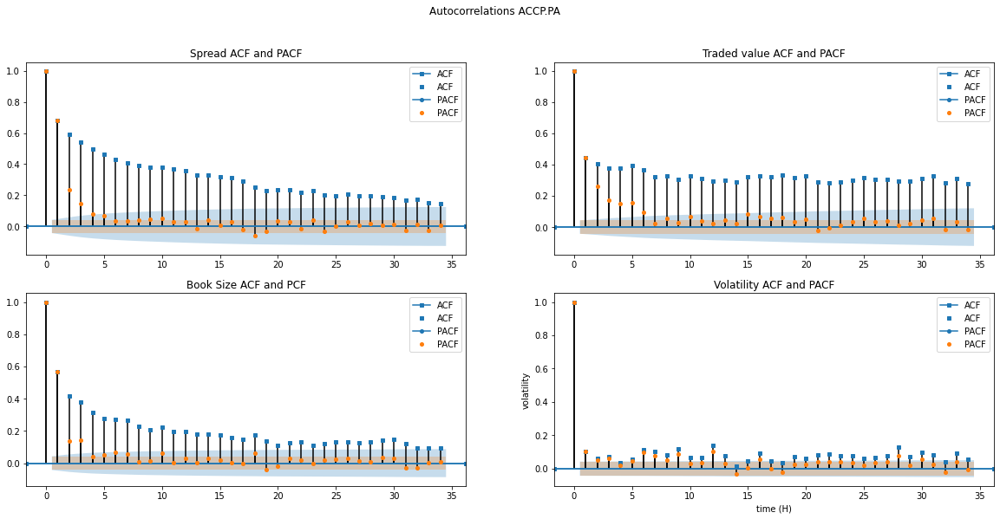

deseasonal_ACCP.PA.csv.gz Done


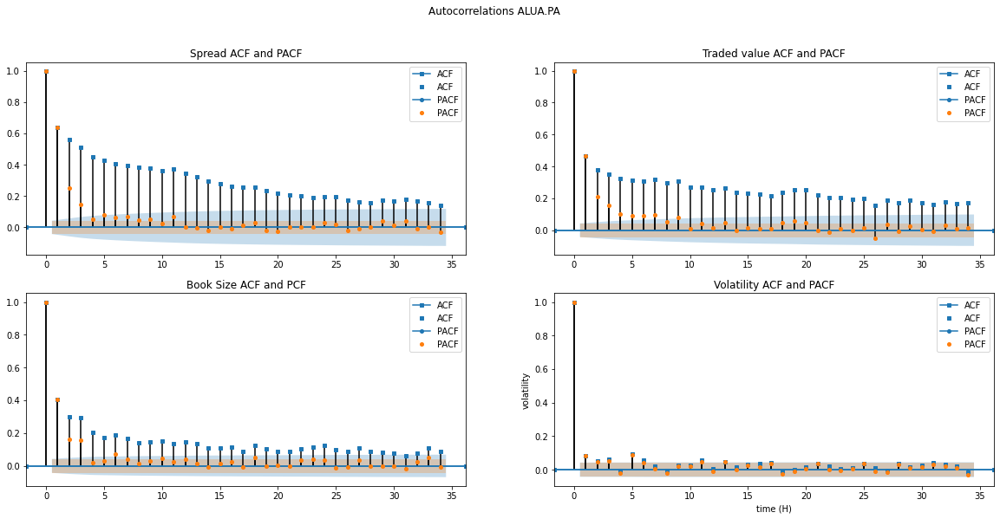

deseasonal_ALUA.PA.csv.gz Done


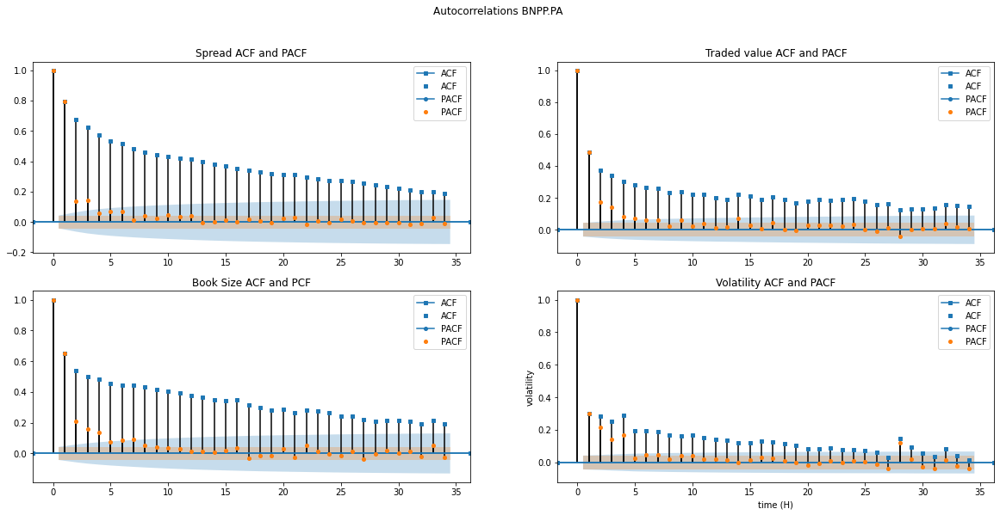

deseasonal_BNPP.PA.csv.gz Done


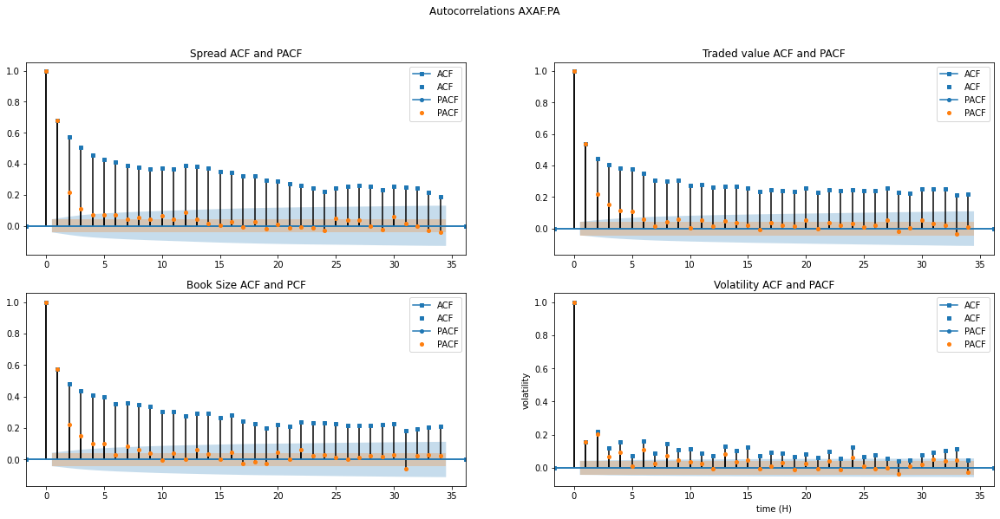

deseasonal_AXAF.PA.csv.gz Done


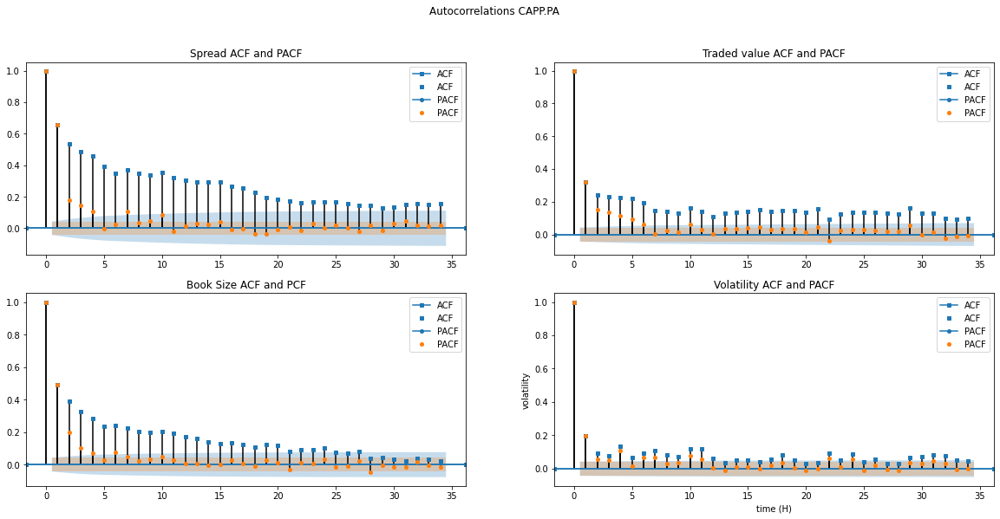

deseasonal_CAPP.PA.csv.gz Done


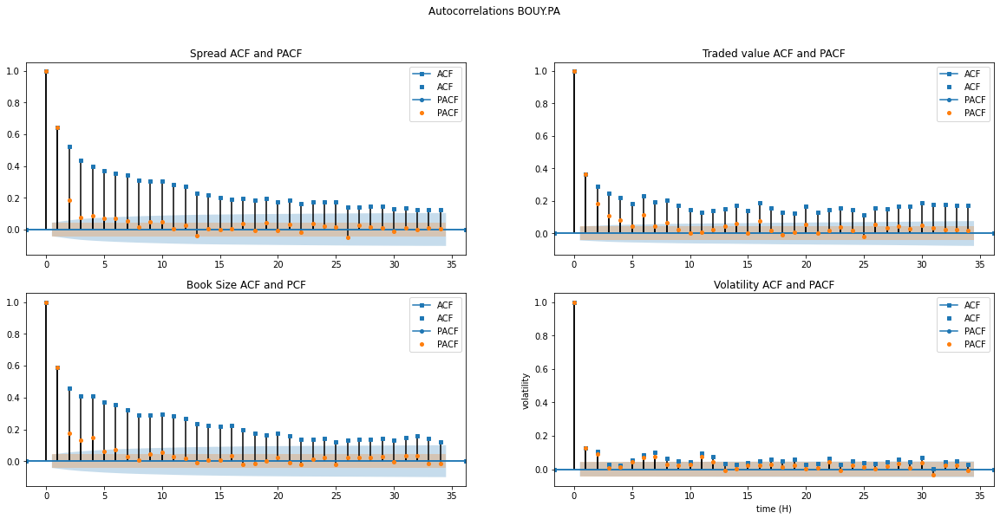

deseasonal_BOUY.PA.csv.gz Done


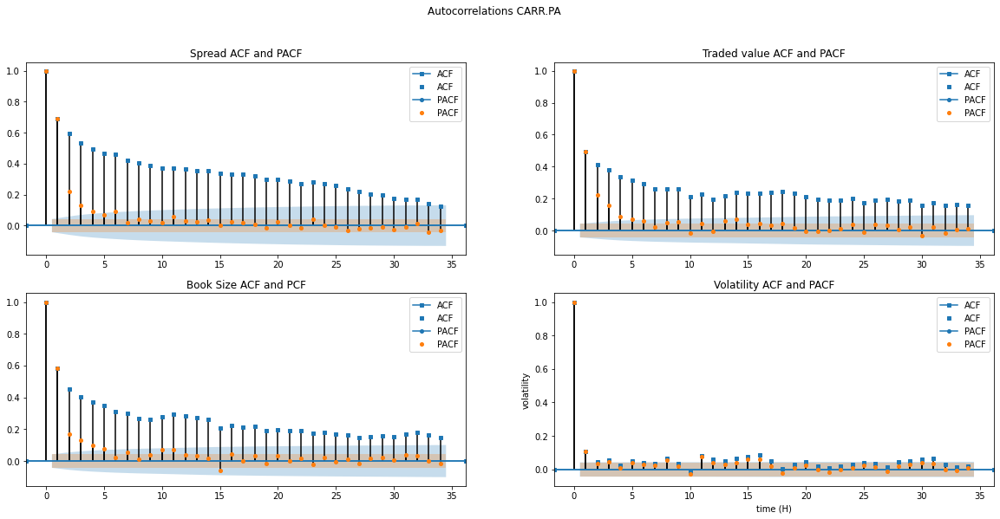

deseasonal_CARR.PA.csv.gz Done


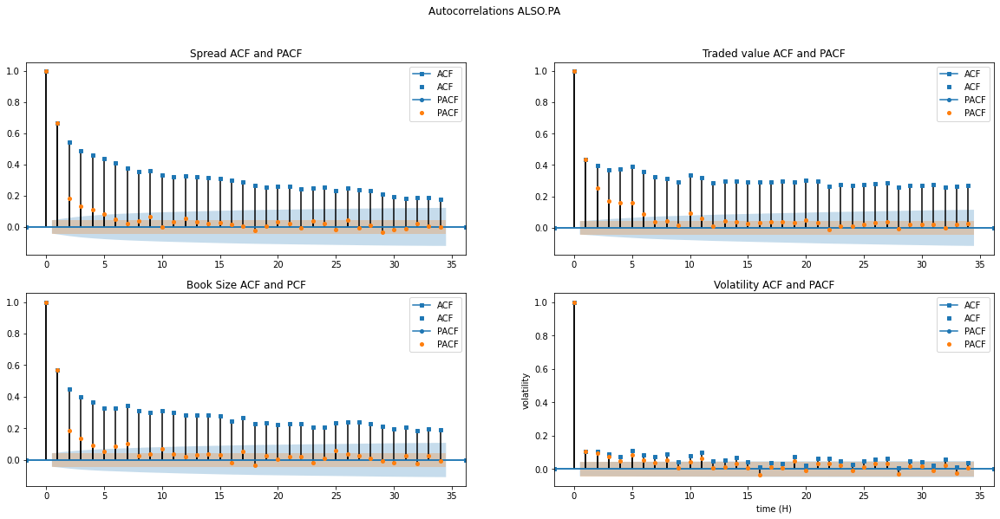

deseasonal_ALSO.PA.csv.gz Done


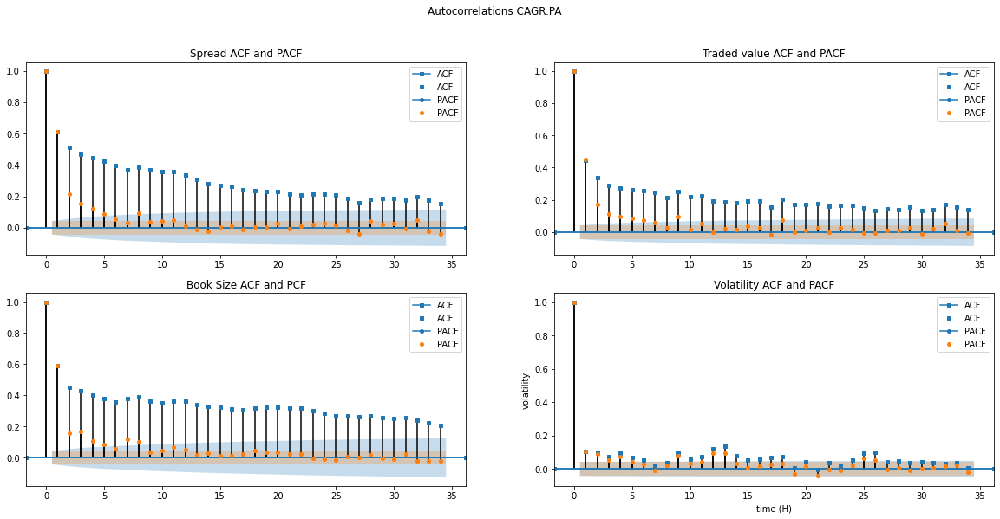

deseasonal_CAGR.PA.csv.gz Done


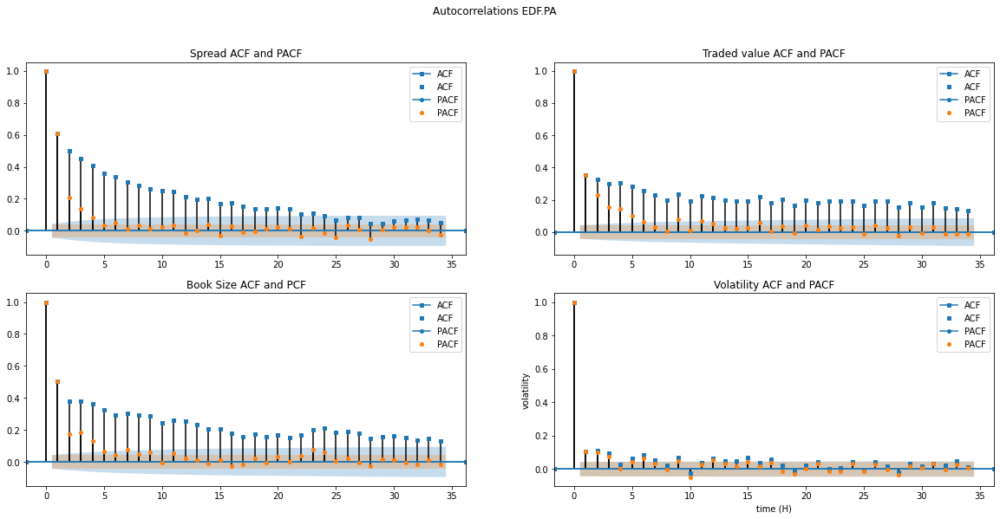

deseasonal_EDF.PA.csv.gz Done


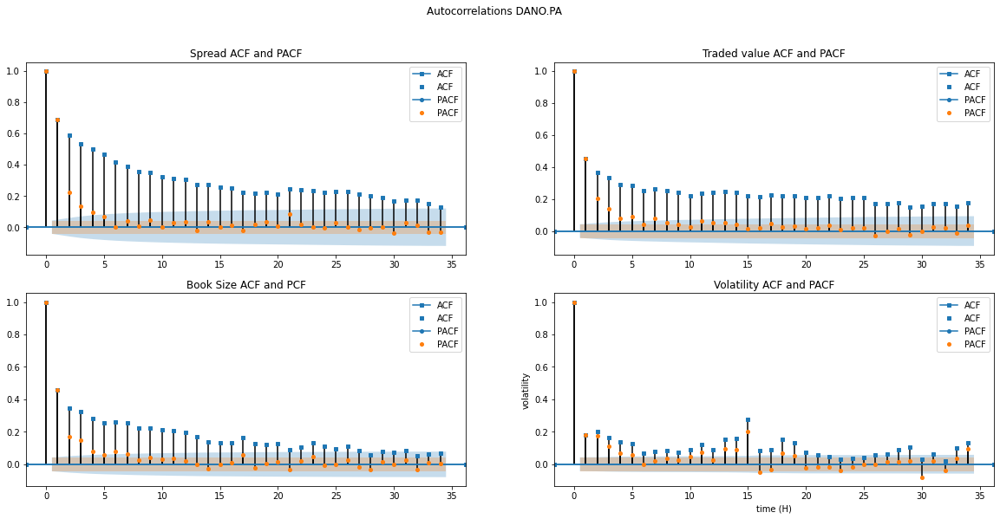

deseasonal_DANO.PA.csv.gz Done


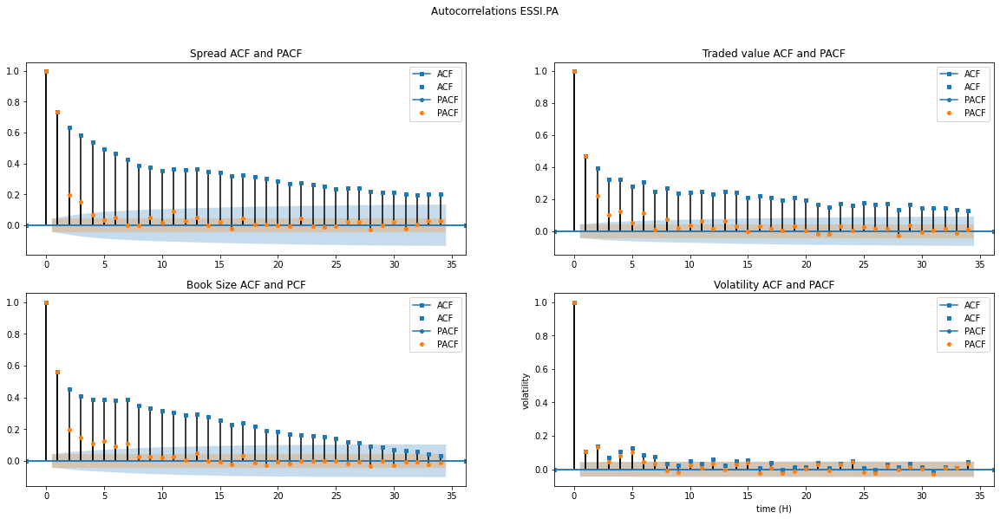

deseasonal_ESSI.PA.csv.gz Done


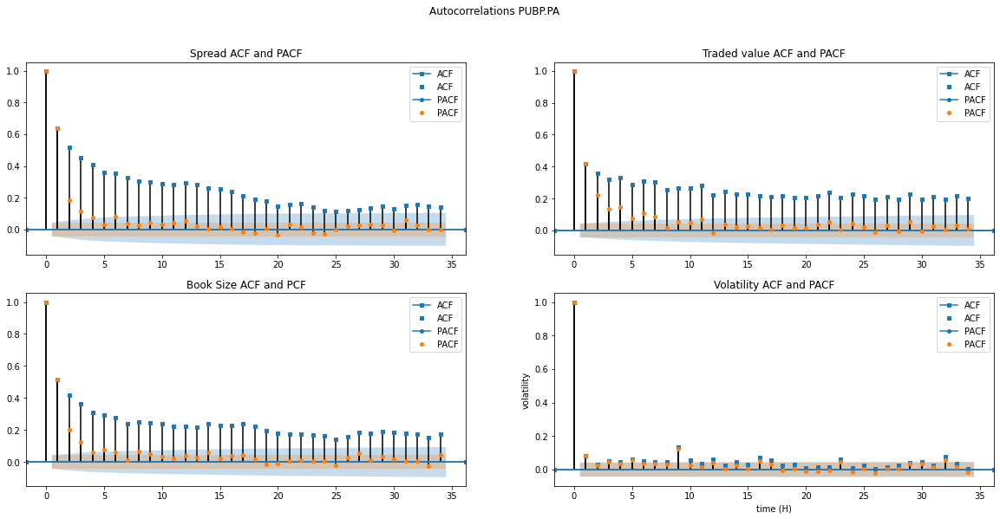

deseasonal_PUBP.PA.csv.gz Done


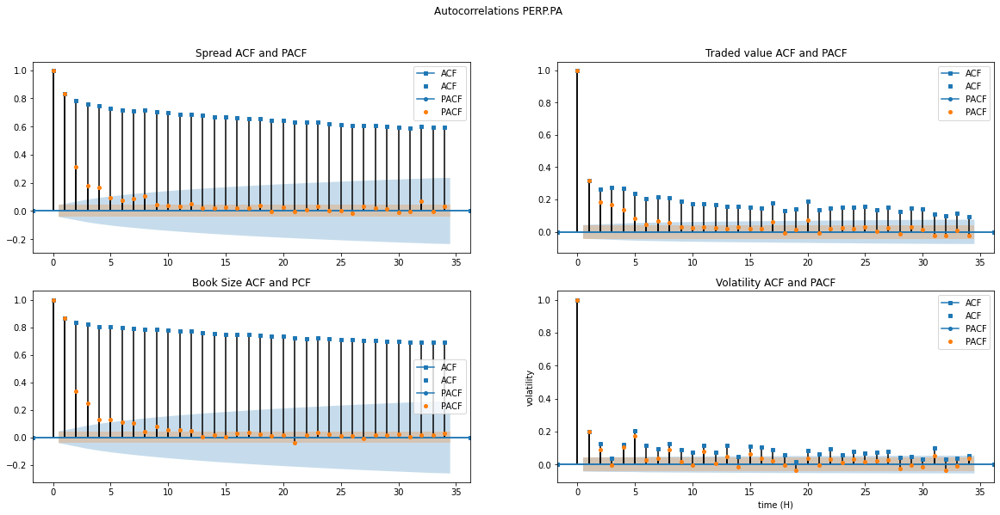

deseasonal_PERP.PA.csv.gz Done


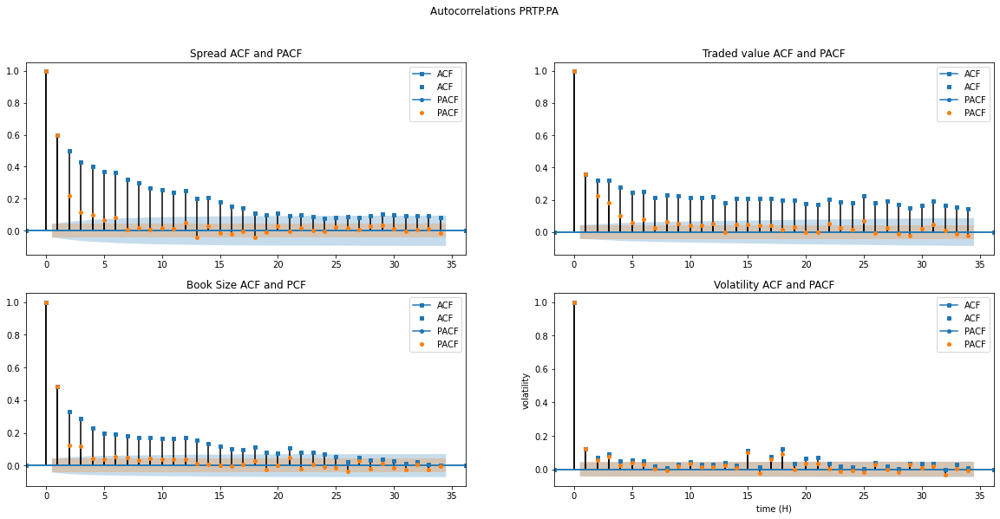

deseasonal_PRTP.PA.csv.gz Done


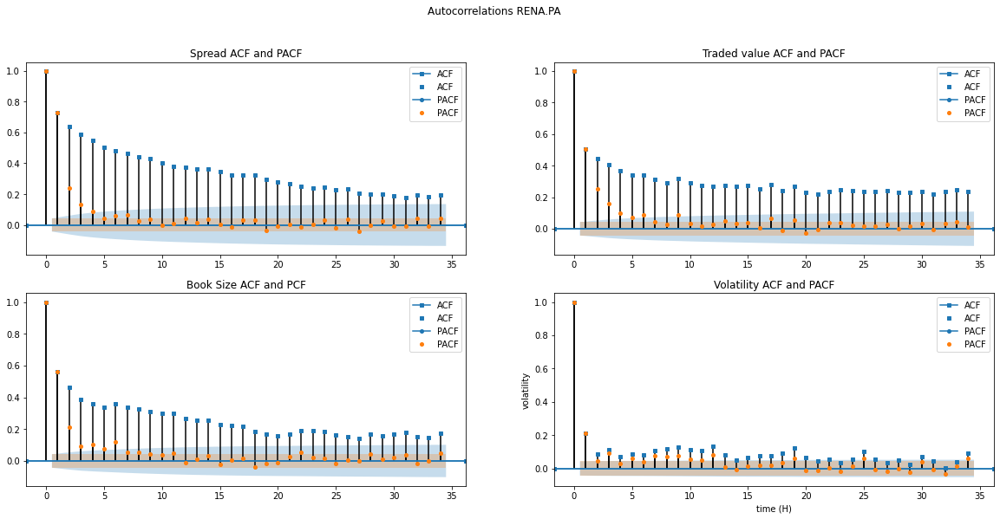

deseasonal_RENA.PA.csv.gz Done


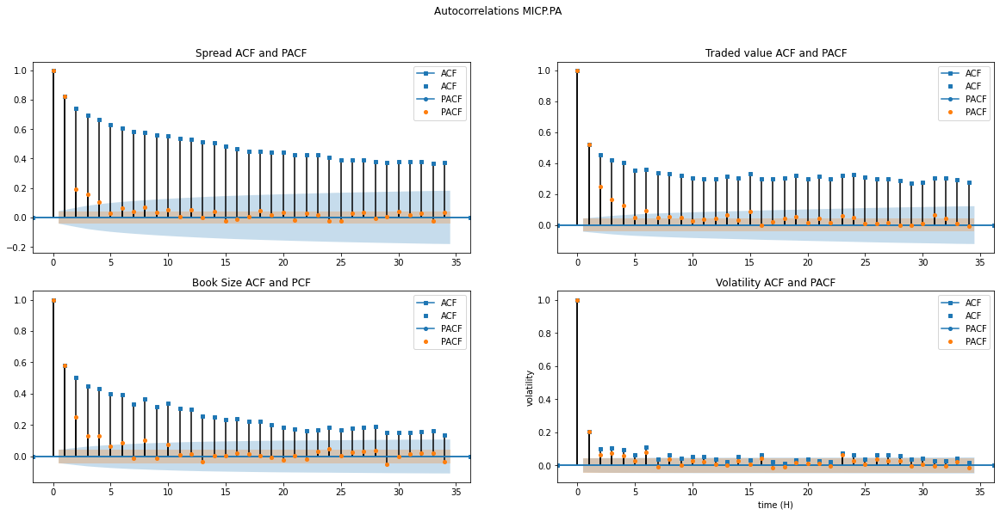

deseasonal_MICP.PA.csv.gz Done


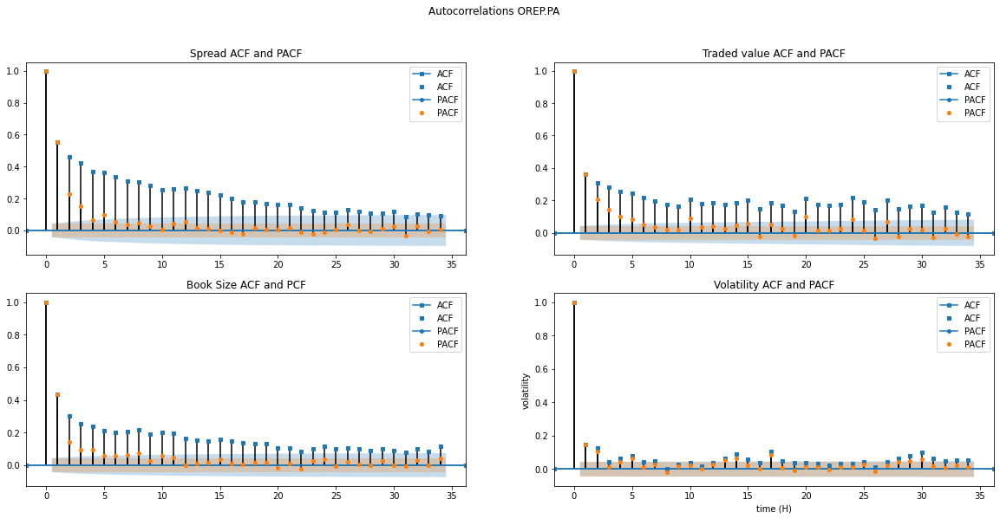

deseasonal_OREP.PA.csv.gz Done


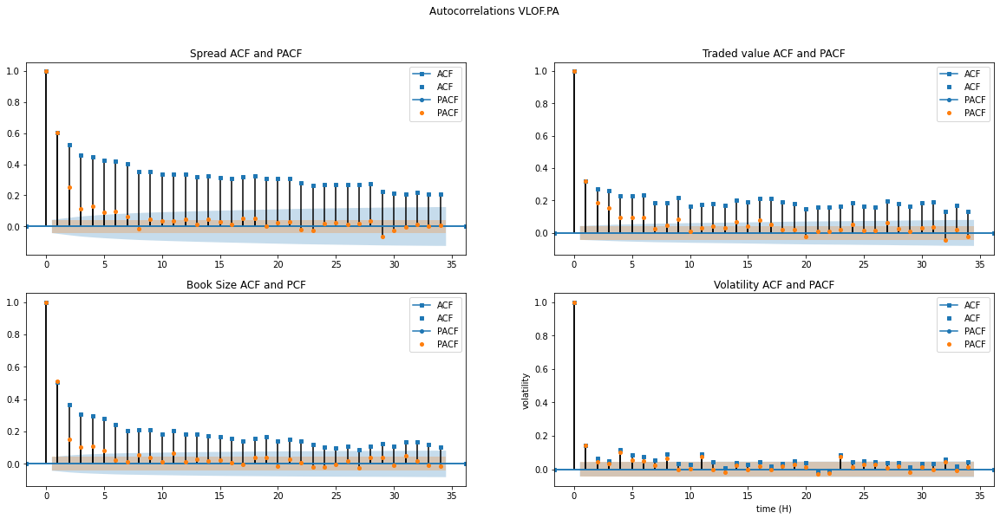

deseasonal_VLOF.PA.csv.gz Done


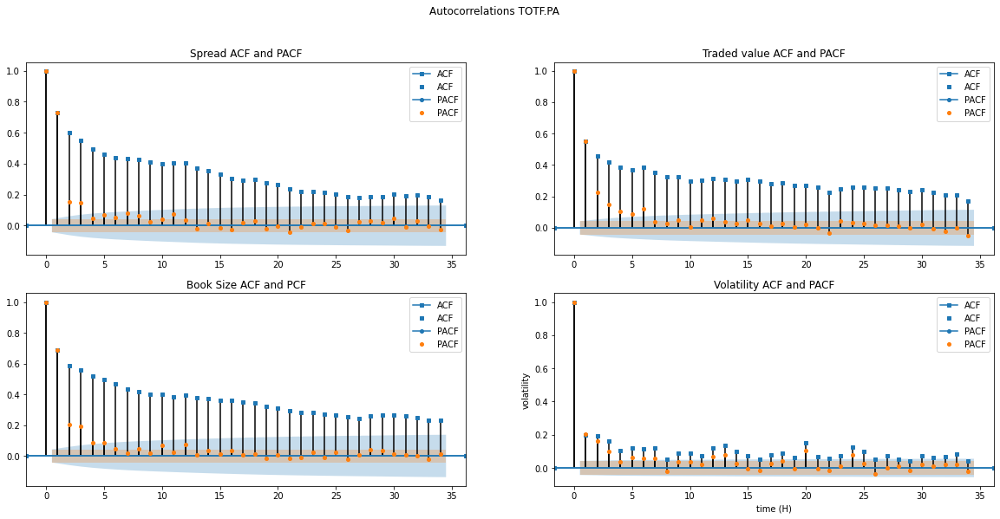

deseasonal_TOTF.PA.csv.gz Done


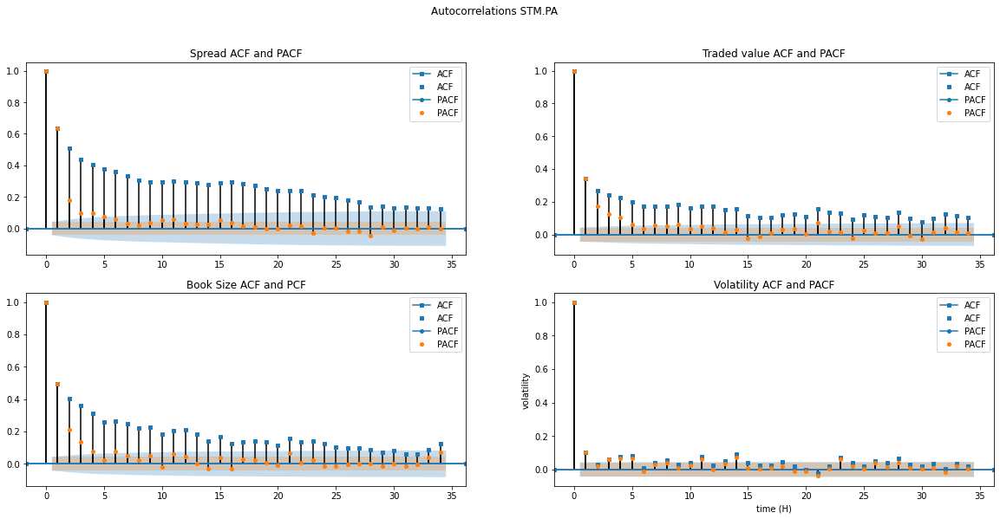

deseasonal_STM.PA.csv.gz Done


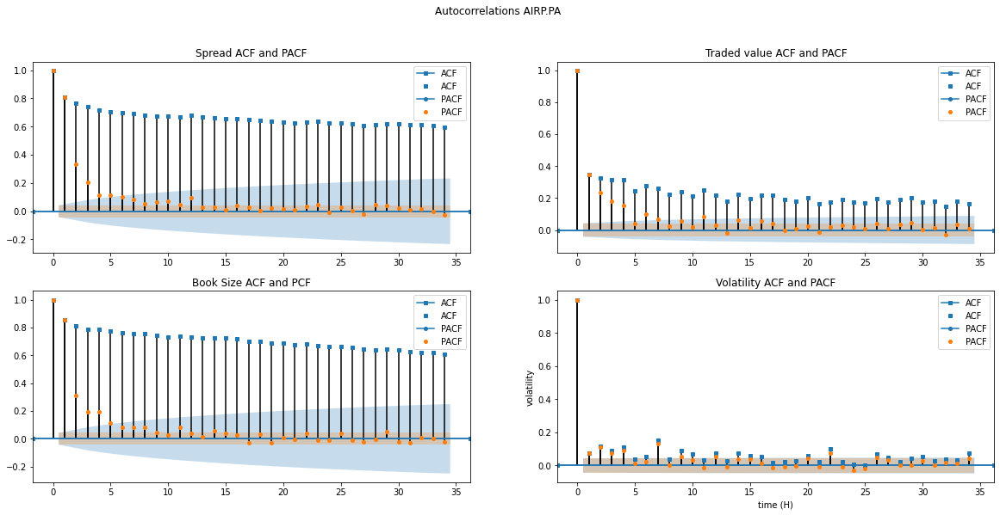

deseasonal_AIRP.PA.csv.gz Done


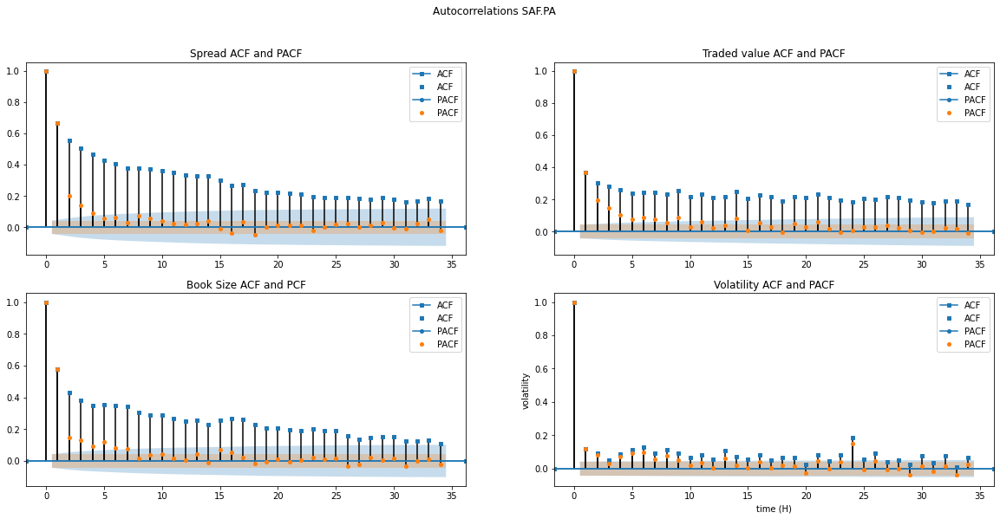

deseasonal_SAF.PA.csv.gz Done


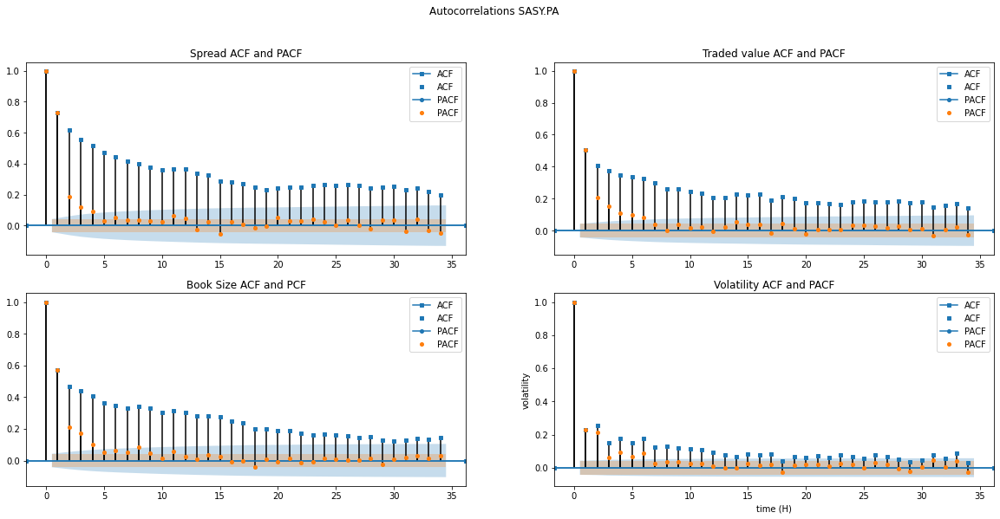

deseasonal_SASY.PA.csv.gz Done


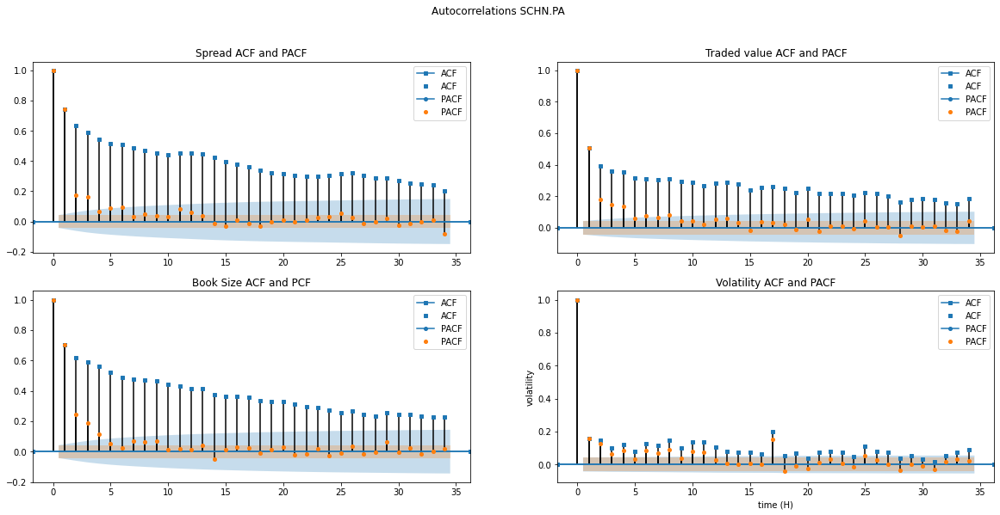

deseasonal_SCHN.PA.csv.gz Done


In [0]:
outputPdf = PdfPages('day3-autocorrelation.pdf')
for stock in os.listdir(path_data_frame_deseasonal):
  data = pd.read_csv(path_data_frame_deseasonal + '/' + stock)

  fig, axs = plt.subplots(2, 2, figsize=(20,9))
  fig.suptitle("Autocorrelations {}".format(stock[11:-7]))

  # SPREAD
  plot_acf(data["spread"].values, ax = axs[0,0], marker="s", markersize=4, linewidth=1.5, label="ACF")
  plot_pacf(data["spread"].values, ax = axs[0,0], marker="o", markersize=4, linewidth=1.5, label="PACF")
  axs[0,0].set_title("Spread ACF and PACF")
  #axs[0,0].set(xlabel='time (H)', ylabel='price (€)')
  axs[0,0].legend(fancybox=True)

  #TRADED
  plot_acf(data["traded_value"].values, ax = axs[0,1], marker="s", markersize=4, linewidth=1.5, label="ACF")
  plot_pacf(data["traded_value"].values, ax = axs[0,1], marker="o", markersize=4, linewidth=1.5, label="PACF")
  axs[0,1].set_title("Traded value ACF and PACF")
  axs[0,1].legend(fancybox=True)

  #BOOK
  plot_acf(data["book_size"].values, ax = axs[1,0], marker="s", markersize=4, linewidth=1.5, label="ACF")
  plot_pacf(data["book_size"].values, ax = axs[1,0], marker="o", markersize=4, linewidth=1.5, label="PACF")
  axs[1,0].set_title("Book Size ACF and PCF")
  #axs[1,0].set(xlabel='time (H)', ylabel='volume')
  axs[1,0].legend(fancybox=True)

  #VOLATILITY
  plot_acf(data["volatility"].values, ax = axs[1,1], marker="s", markersize=4, linewidth=1.5, label="ACF")
  plot_pacf(data["volatility"].values, ax = axs[1,1], marker="o", markersize=4, linewidth=1.5, label="PACF")
  axs[1,1].set_title("Volatility ACF and PACF")
  axs[1,1].set(xlabel='time (H)', ylabel='volatility')
  axs[1,1].legend(fancybox=True)
  outputPdf.savefig()
  plt.show()
  print("{} Done".format(stock))
outputPdf.close()


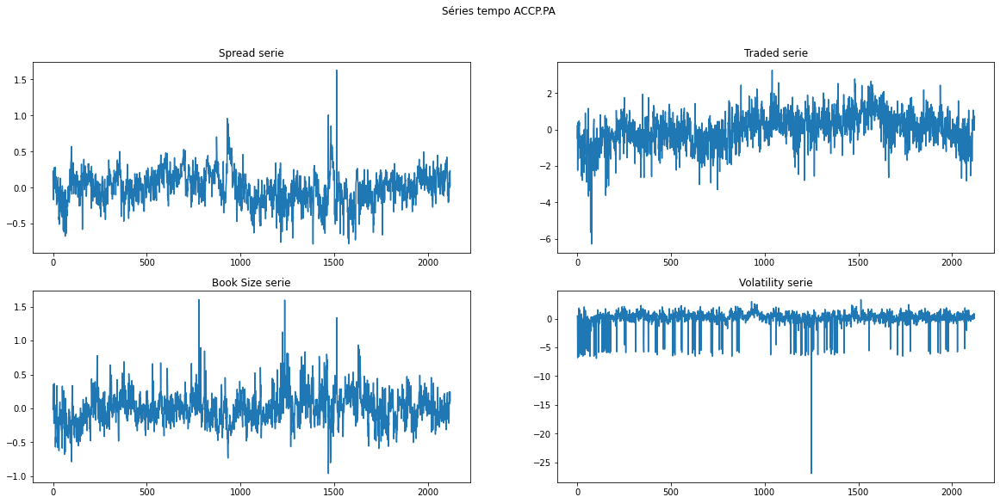

deseasonal_ACCP.PA.csv.gz Done


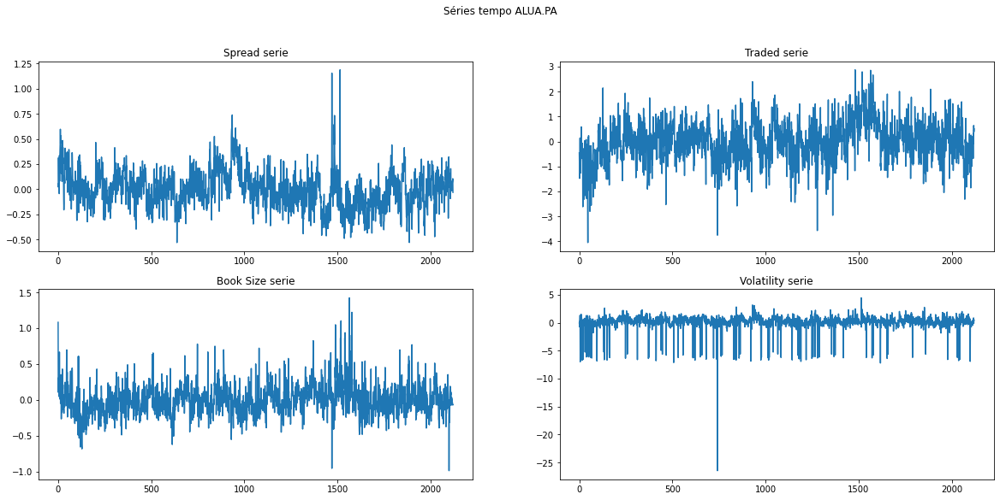

deseasonal_ALUA.PA.csv.gz Done


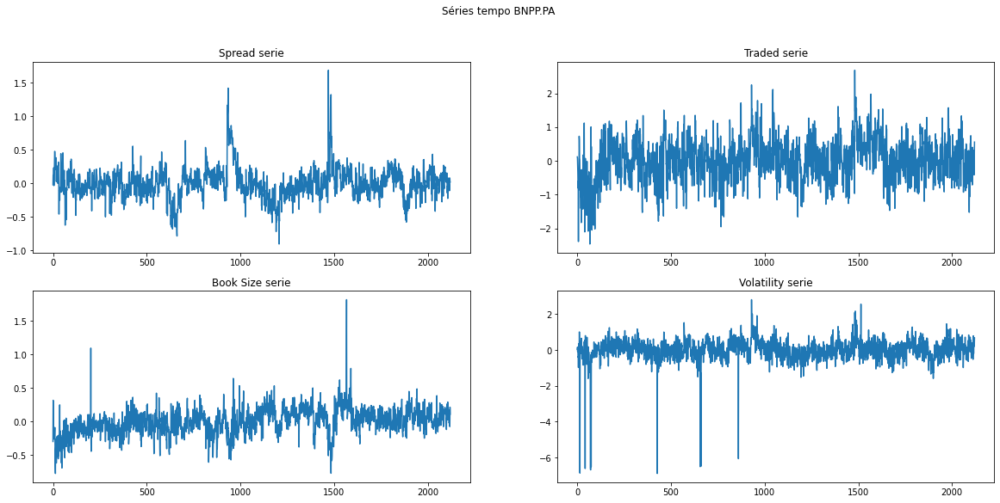

deseasonal_BNPP.PA.csv.gz Done


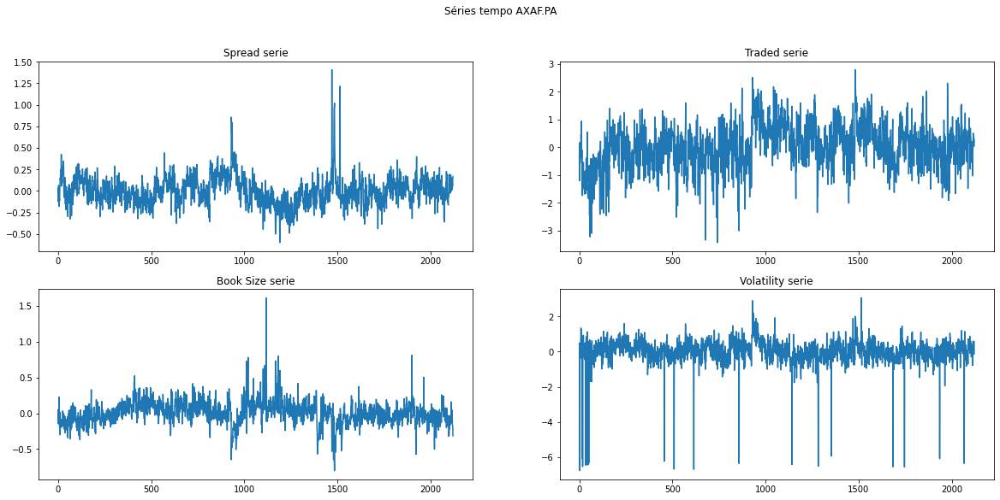

deseasonal_AXAF.PA.csv.gz Done


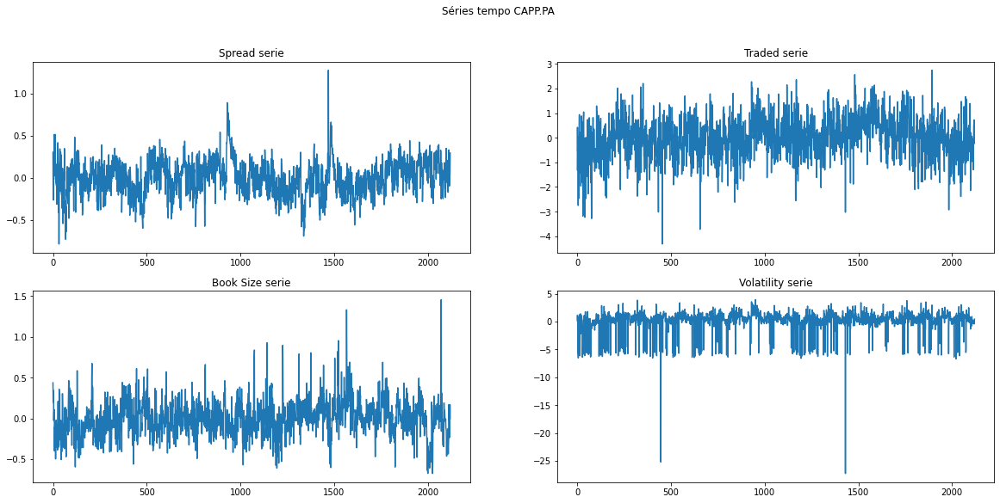

deseasonal_CAPP.PA.csv.gz Done


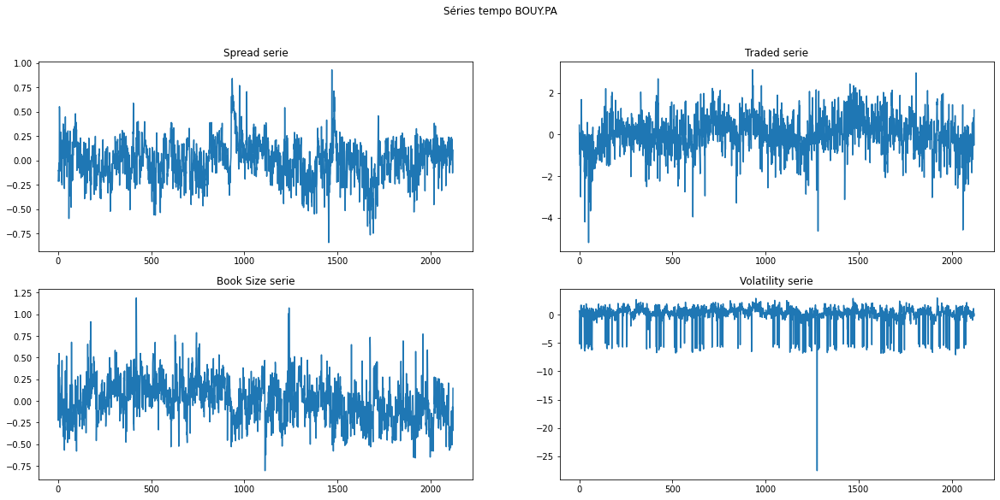

deseasonal_BOUY.PA.csv.gz Done


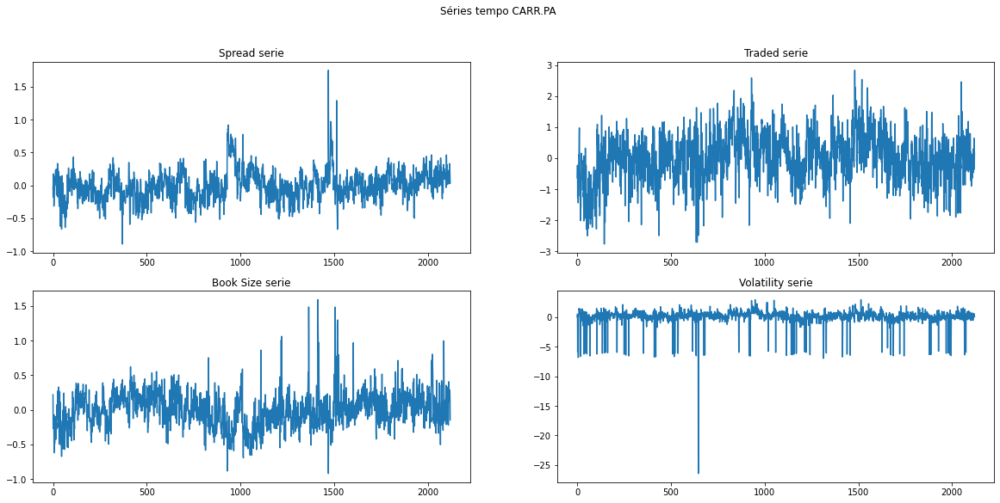

deseasonal_CARR.PA.csv.gz Done


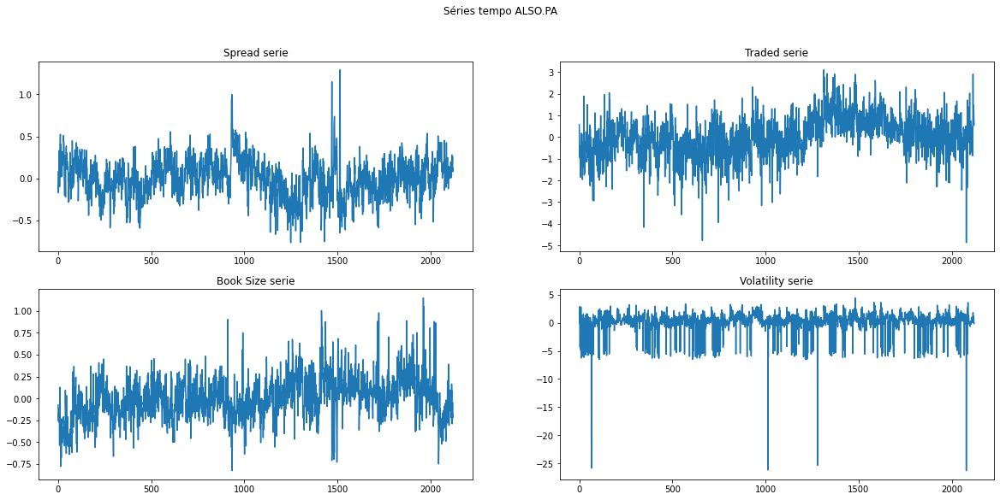

deseasonal_ALSO.PA.csv.gz Done


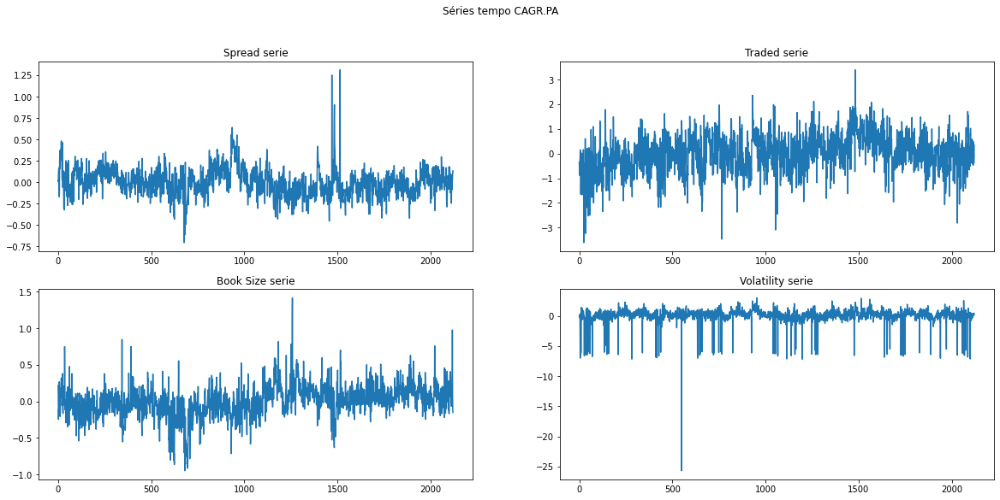

deseasonal_CAGR.PA.csv.gz Done


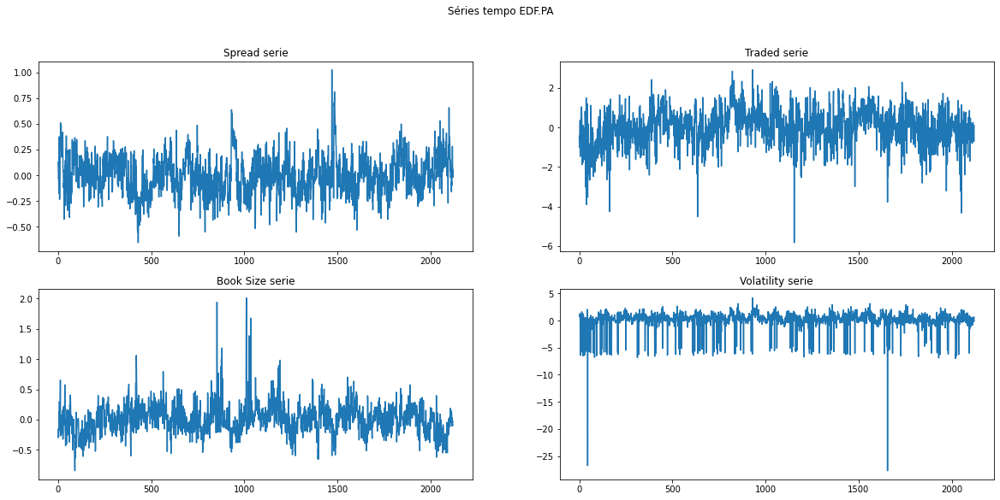

deseasonal_EDF.PA.csv.gz Done


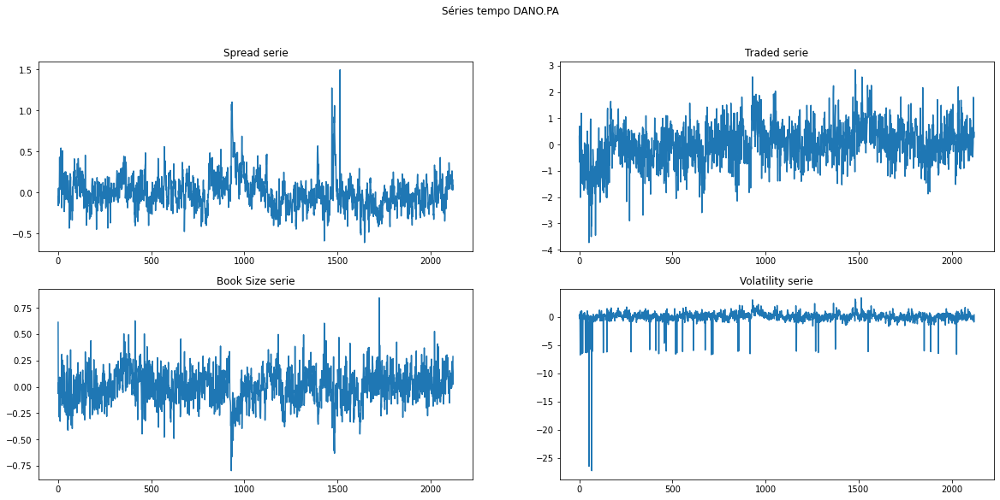

deseasonal_DANO.PA.csv.gz Done


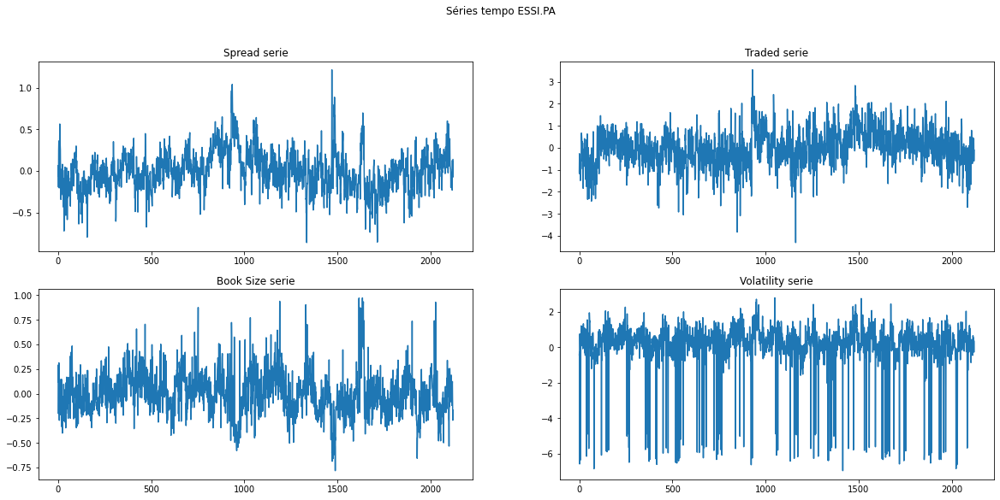

deseasonal_ESSI.PA.csv.gz Done


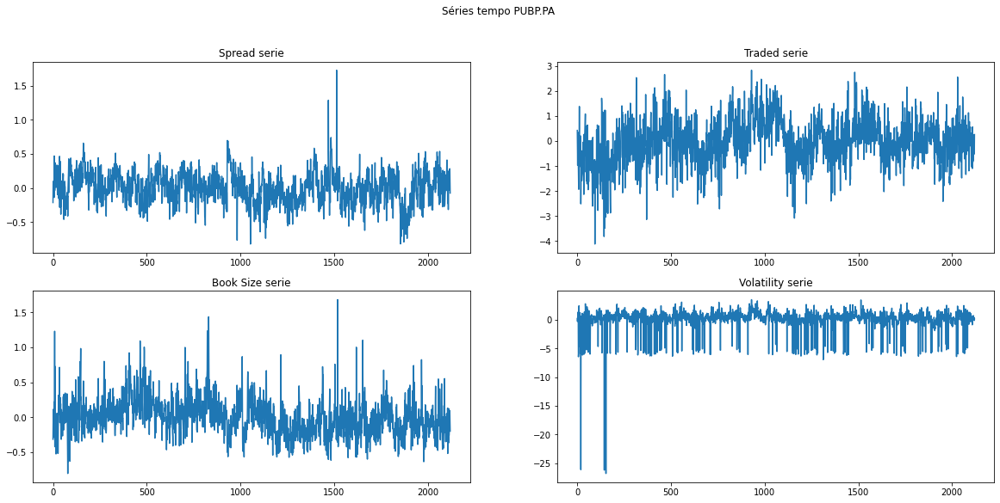

deseasonal_PUBP.PA.csv.gz Done


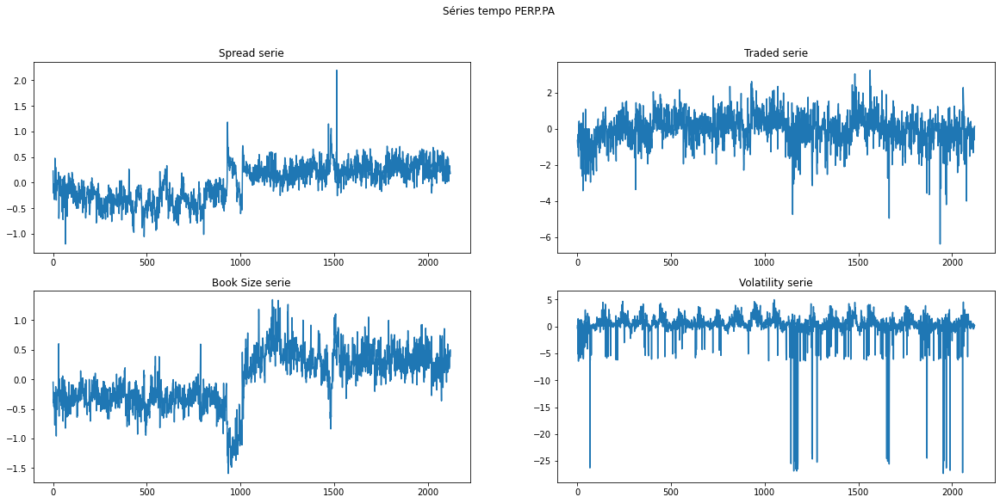

deseasonal_PERP.PA.csv.gz Done


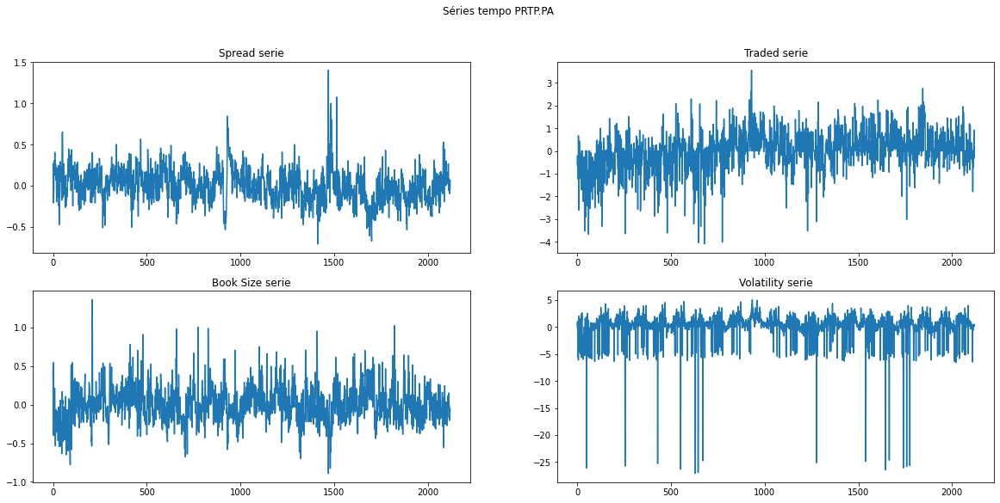

deseasonal_PRTP.PA.csv.gz Done


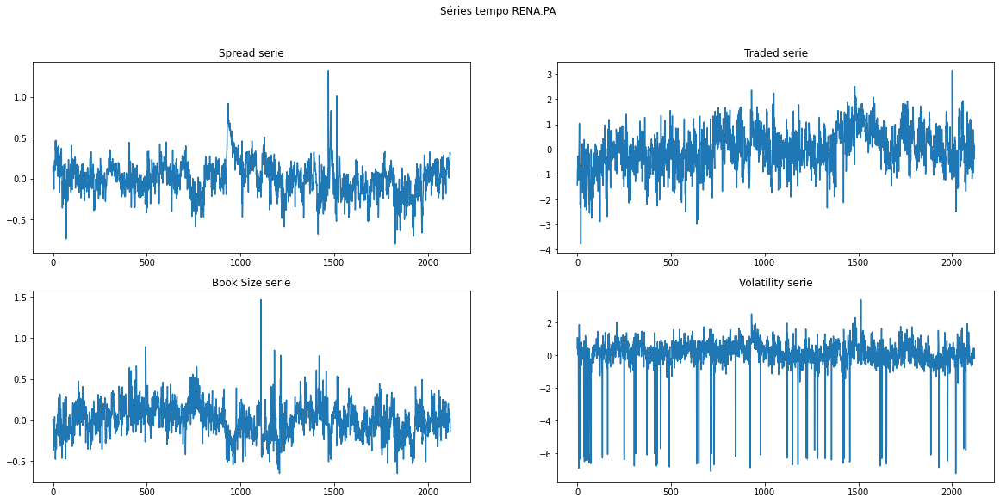

deseasonal_RENA.PA.csv.gz Done


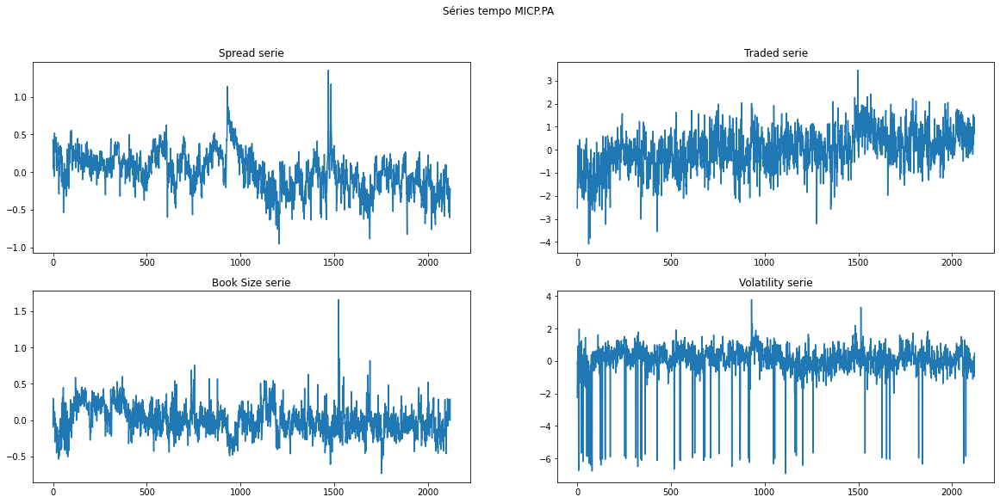

deseasonal_MICP.PA.csv.gz Done


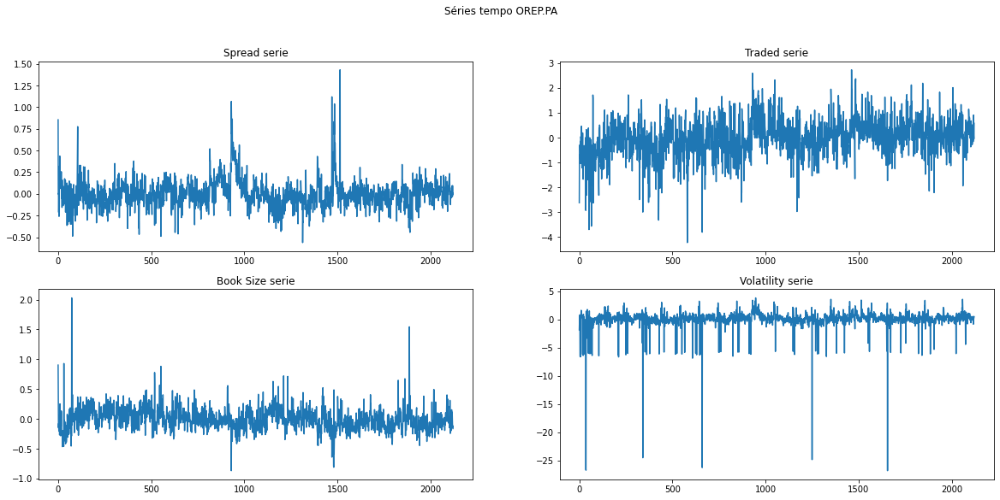

deseasonal_OREP.PA.csv.gz Done


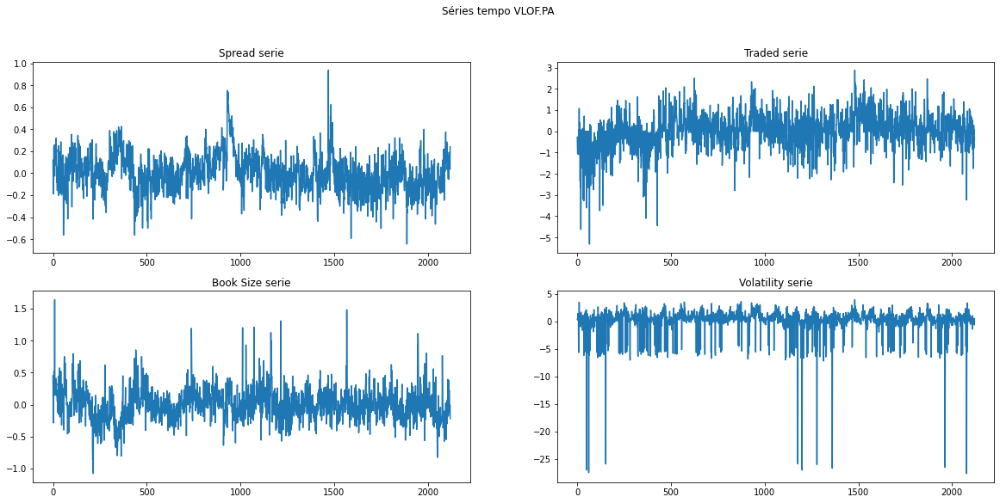

deseasonal_VLOF.PA.csv.gz Done


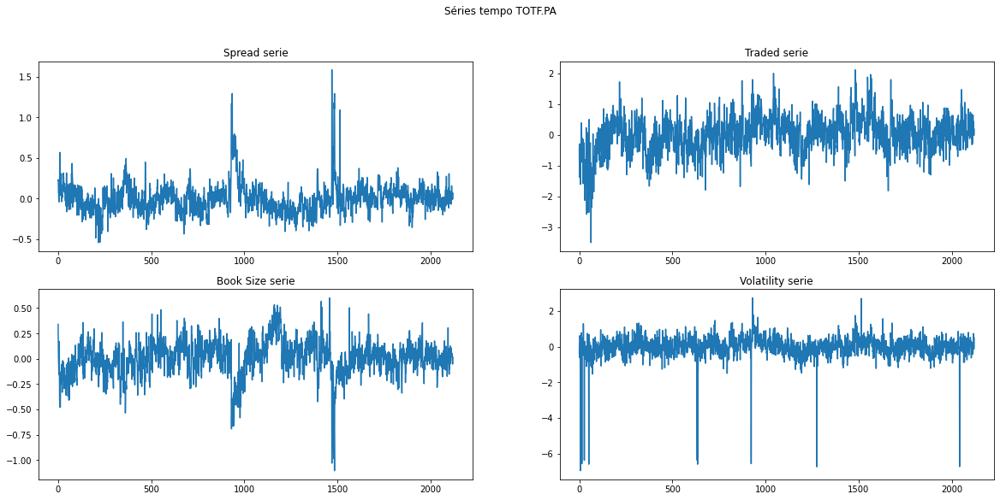

deseasonal_TOTF.PA.csv.gz Done


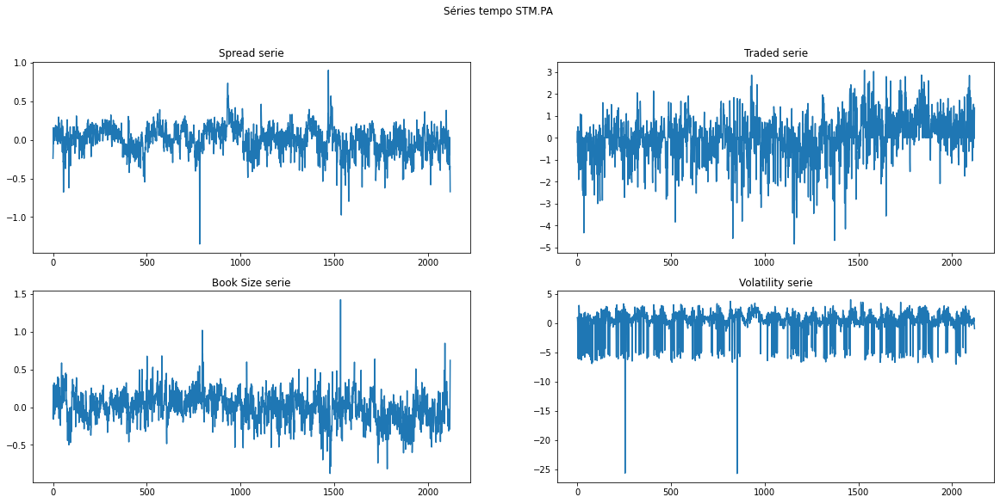

deseasonal_STM.PA.csv.gz Done


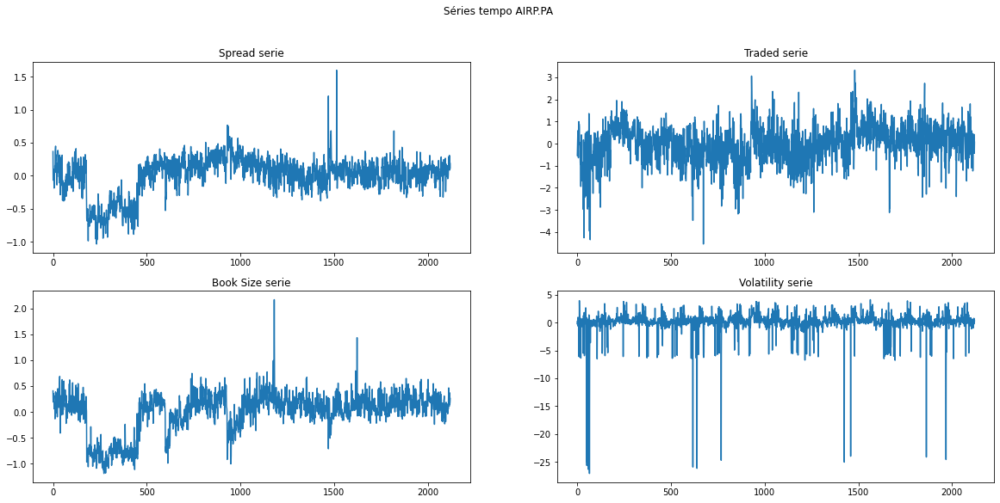

deseasonal_AIRP.PA.csv.gz Done


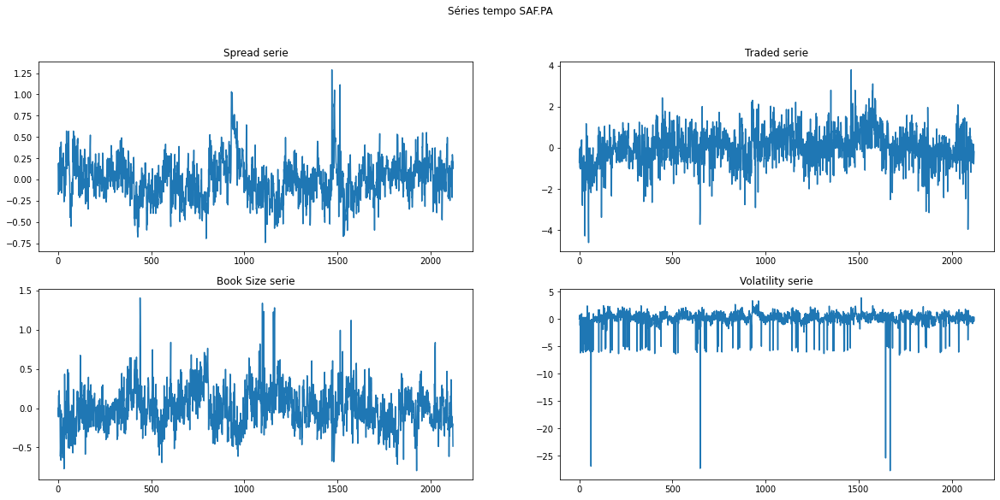

deseasonal_SAF.PA.csv.gz Done


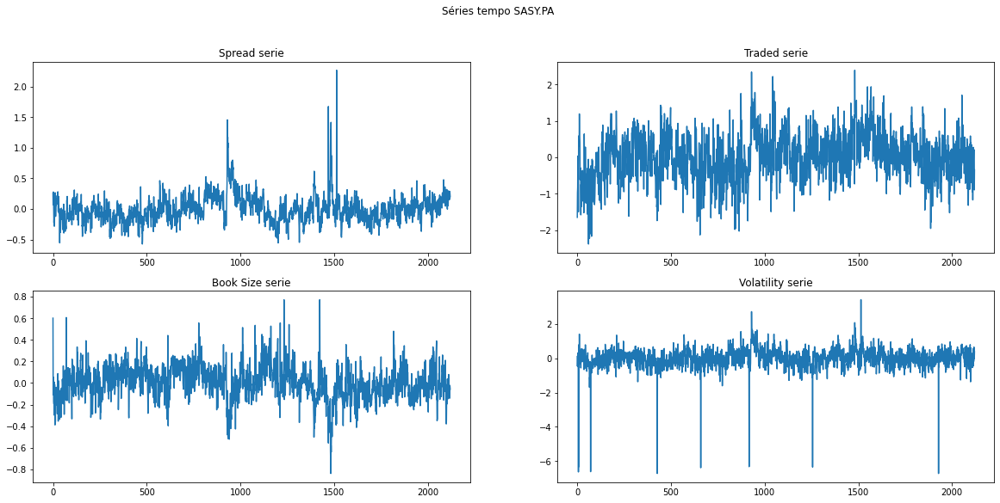

deseasonal_SASY.PA.csv.gz Done


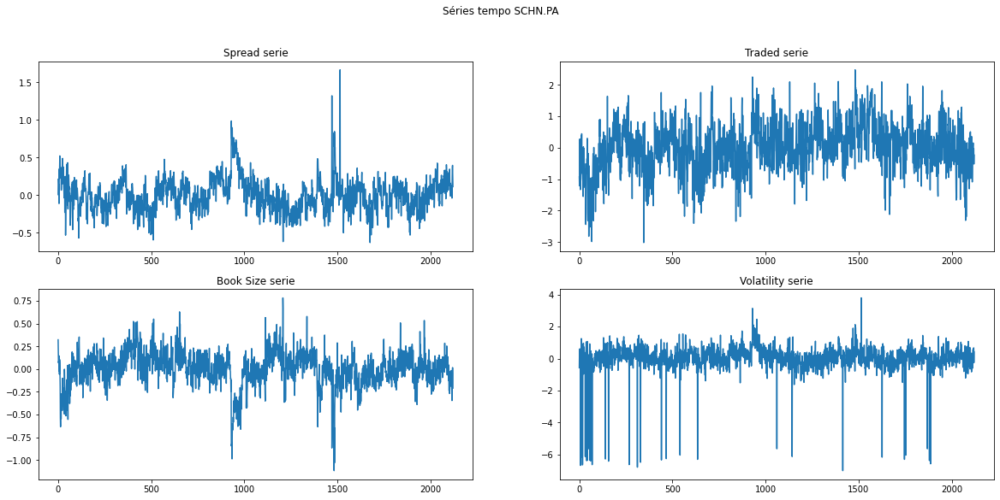

deseasonal_SCHN.PA.csv.gz Done


In [0]:
outputPdf = PdfPages('day3-series-tempo.pdf')
for stock in os.listdir(path_data_frame_deseasonal):
  data = pd.read_csv(path_data_frame_deseasonal + '/' + stock)

  fig, axs = plt.subplots(2, 2, figsize=(20,9))
  fig.suptitle("Séries tempo {}".format(stock[11:-7]))

  # SPREAD
  axs[0,0].plot(range(len(data["spread"].values)), data["spread"].values)
  axs[0,0].set_title("Spread serie")
  #axs[0,0].set(xlabel='time (H)', ylabel='price (€)')
  #axs[0,0].legend(fancybox=True)

  #TRADED
  axs[0,1].plot(range(len(data["traded_value"].values)), data["traded_value"].values)
  axs[0,1].set_title("Traded serie")
  #axs[0,1].legend(fancybox=True)

  #BOOK
  axs[1,0].plot(range(len(data["book_size"].values)) ,data["book_size"].values)
  axs[1,0].set_title("Book Size serie")
  #axs[1,0].set(xlabel='time (H)', ylabel='volume')
  #axs[1,0].legend(fancybox=True)

  #VOLATILITY
  axs[1,1].plot(range(len(data["volatility"].values)) ,data["volatility"].values)
  axs[1,1].set_title("Volatility serie")
  #axs[1,1].legend(fancybox=True)
  outputPdf.savefig()
  plt.show()
  print("{} Done".format(stock))
outputPdf.close()

In [0]:
def R_2(empirique, estimée) :
  # Input :  data['colonne'].values et estimations avec le model ARMA
  # Output : le coefficient R²

  moyenne_empirique = np.mean(empirique)
  Var_empirique = 0
  Var_estimée = 0
  for i in range(len(empirique)) :
    Var_empirique += (empirique[i] - moyenne_empirique)**2
    Var_estimée += (empirique[i] - estimée[i])**2
  return 1 - Var_estimée / Var_empirique

#implémentation graphique de la correlation

def cross_variable_correlation(data) :
  # Input : tableau de la correlation entre les quatres variables
  # Output : La matrice de correlation entre les variables

  Z = []
  for i in range(9) :
    Var = []
    for indicateur in ['spread', 'traded_value', 'book_size', 'volatility'] :
      for j in range(3) :
        Var.append(data[indicateur][j])
      Z.append(np.array(Var)) 
  x = np.arange(1,36,1)
  y = np.arange(1,36,1)
  X,Y = np.meshgrid(x , y)
  Z = np.array(Z)
  plt.pcolor(X, Y, Z)
  plt.colorbar()
  x_ticks = ['spread', 'traded_value', 'book_size', 'volatility']
  plt.xticks([4,13,22,31], my_xticks)
  plt.title("Indicators correlation")
  plt.show()

In [0]:

R_coefs = {'spread':[], 'traded_value':[], 'book_size':[], 'volatility':[]}
for stock in os.listdir(path_data_frame_deseasonal):
  print("In progress {}".format(stock[:-7]))
  data = pd.read_csv(path_data_frame_deseasonal + '/' + stock)
  for indicator in ['spread', 'traded_value', 'book_size', 'volatility']:
    best_R = -np.inf
    list_R = []
    for i in range(1,12+1):
      model = smt.ARMA(data[indicator].values, order = (i,0), missing="drop").fit()
      predict = model.predict(start=0, end=len(data[indicator].values))
      R = R_2(data[indicator].values, predict)
      list_R.append(R)
      if R > best_R:
        best_R = R
        model.save("/content/drive/My Drive/Colab Notebooks/AR_Models/model_" + stock[11:-7] + "_" + indicator + ".pkl")
    R_coefs[indicator].append(best_R)
    np.save("/content/drive/My Drive/Colab Notebooks/AR_Models/R_coefs_" + stock[11:-7] + "_" + indicator + ".npy", np.array(list_R))
    print("{} , {} best R : {}".format(stock[:-7], indicator, best_R))
  print("Done {}".format(stock[:-7]))
with open('/content/drive/My Drive/Colab Notebooks/R_coefficients.json', 'w') as fp:
    json.dump(R_coefs, fp)


In progress deseasonal_ACCP.PA
deseasonal_ACCP.PA , spread best R : 0.5153924897340076
deseasonal_ACCP.PA , traded_value best R : 0.32179166726797825
deseasonal_ACCP.PA , book_size best R : 0.35974494534971113
deseasonal_ACCP.PA , volatility best R : 0.05765299159324866
Done deseasonal_ACCP.PA
In progress deseasonal_ALUA.PA
deseasonal_ALUA.PA , spread best R : 0.47424889461498176
deseasonal_ALUA.PA , traded_value best R : 0.30304740551044784
deseasonal_ALUA.PA , book_size best R : 0.21752118703186363
deseasonal_ALUA.PA , volatility best R : 0.025761807521595514
Done deseasonal_ALUA.PA
In progress deseasonal_BNPP.PA
deseasonal_BNPP.PA , spread best R : 0.6478230392149487
deseasonal_BNPP.PA , traded_value best R : 0.2953836591942657
deseasonal_BNPP.PA , book_size best R : 0.483496368028
deseasonal_BNPP.PA , volatility best R : 0.18182226849127114
Done deseasonal_BNPP.PA
In progress deseasonal_AXAF.PA
deseasonal_AXAF.PA , spread best R : 0.5068901694180834
deseasonal_AXAF.PA , traded_valu

/usr/local/lib/python3.6/dist-packages/statsmodels/base/model.py:512: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


deseasonal_CAPP.PA , spread best R : 0.48286688980316594
deseasonal_CAPP.PA , traded_value best R : 0.16563884598496426
deseasonal_CAPP.PA , book_size best R : 0.2907649902743119
deseasonal_CAPP.PA , volatility best R : 0.07576128508920765
Done deseasonal_CAPP.PA
In progress deseasonal_BOUY.PA
deseasonal_BOUY.PA , spread best R : 0.45175669123807893
deseasonal_BOUY.PA , traded_value best R : 0.196725124628787
deseasonal_BOUY.PA , book_size best R : 0.40032194250016684
deseasonal_BOUY.PA , volatility best R : 0.04659275963419762
Done deseasonal_BOUY.PA
In progress deseasonal_CARR.PA
deseasonal_CARR.PA , spread best R : 0.5248499322078758
deseasonal_CARR.PA , traded_value best R : 0.3145892447249182
deseasonal_CARR.PA , book_size best R : 0.39077967013155845
deseasonal_CARR.PA , volatility best R : 0.02965601571080101
Done deseasonal_CARR.PA
In progress deseasonal_ALSO.PA
deseasonal_ALSO.PA , spread best R : 0.4860703490746322
deseasonal_ALSO.PA , traded_value best R : 0.3184269819700104

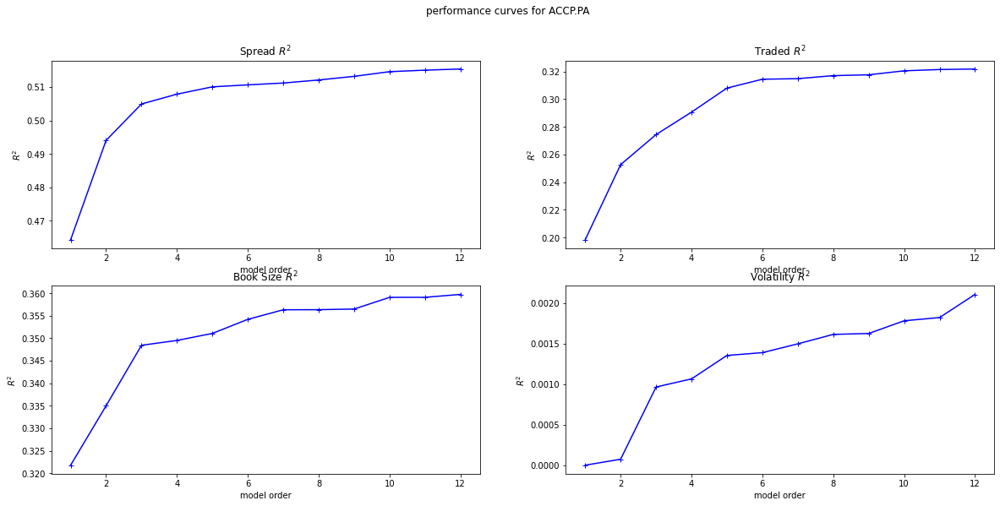

ACCP.PA Done


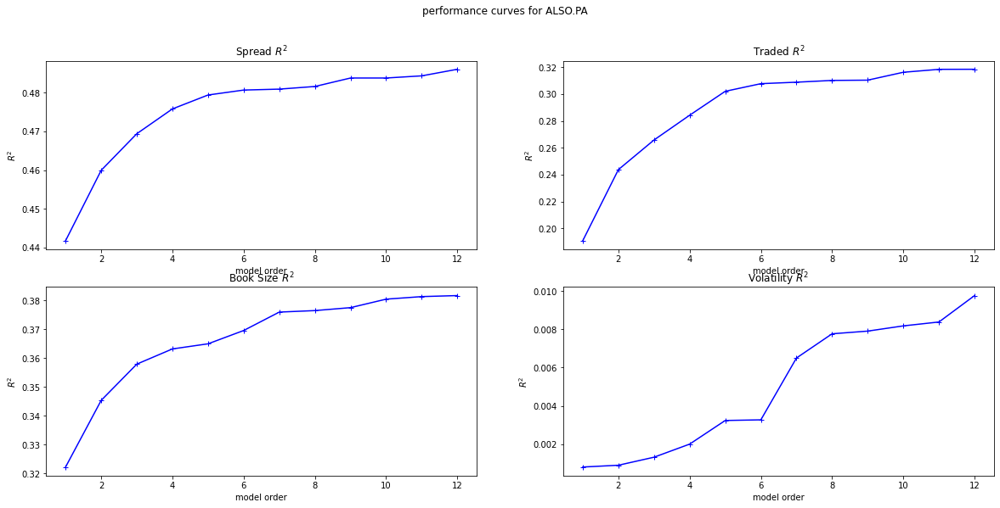

ALSO.PA Done


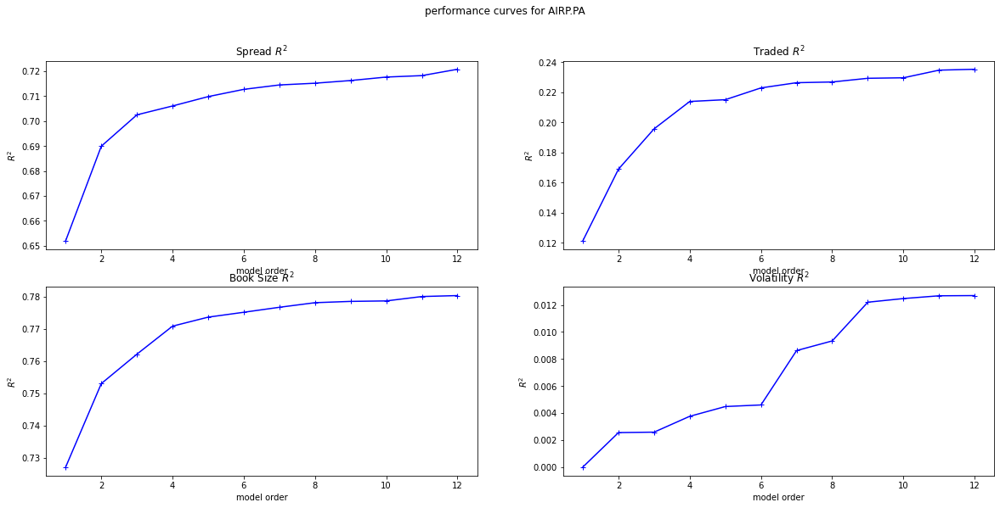

AIRP.PA Done


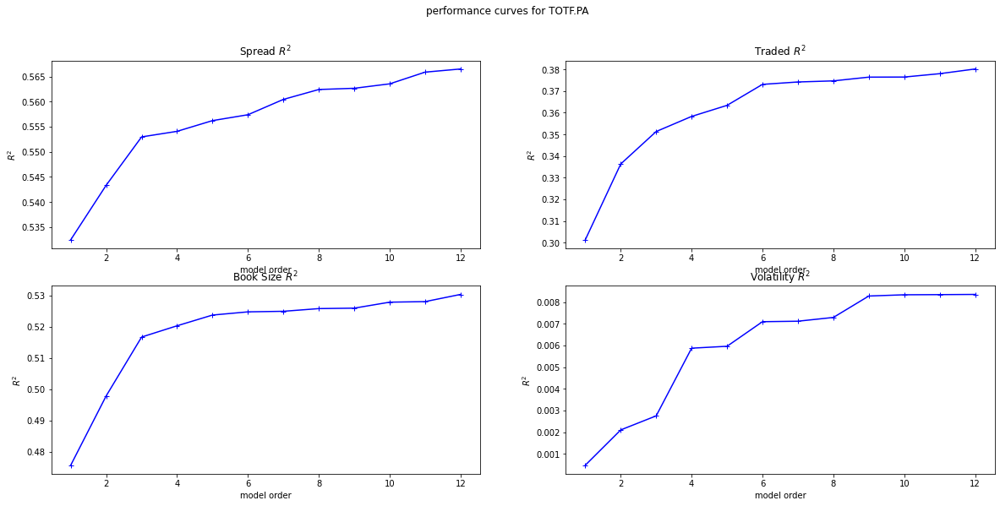

TOTF.PA Done


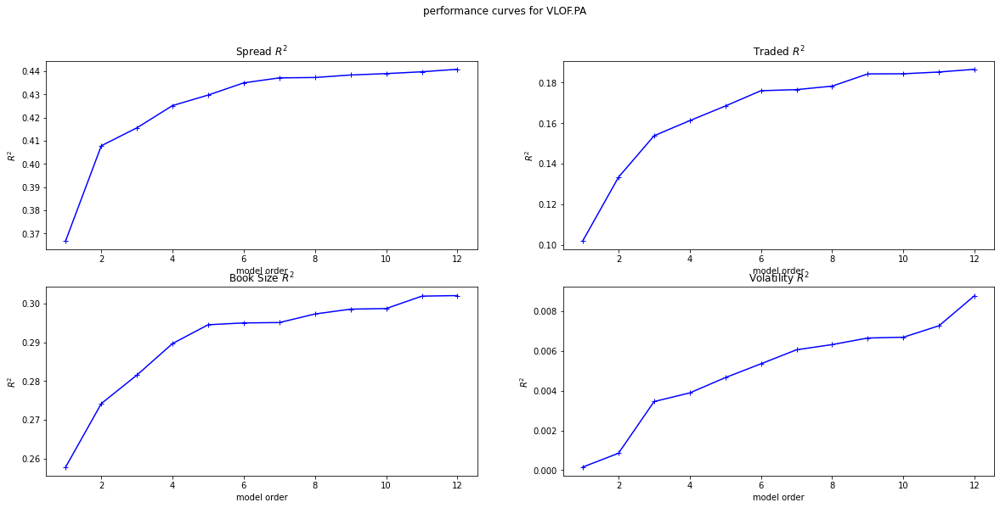

VLOF.PA Done


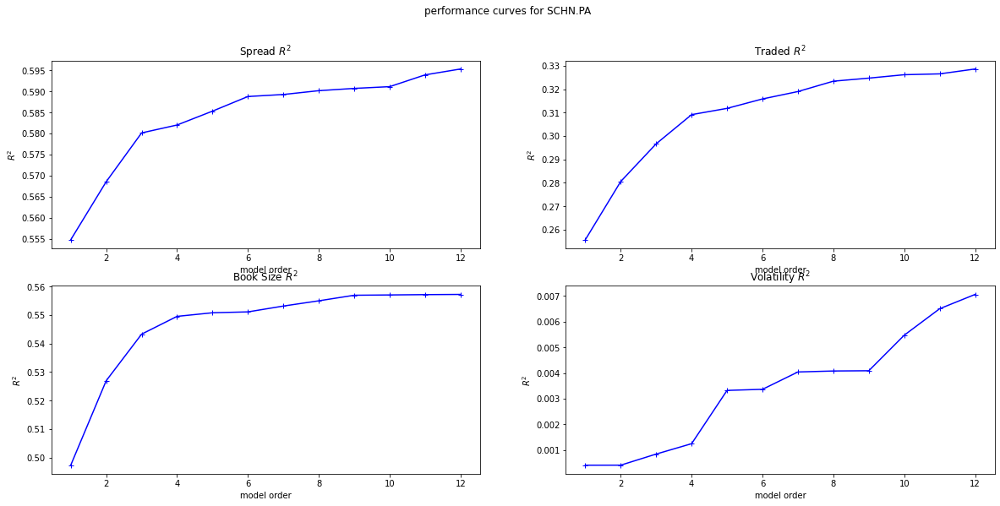

SCHN.PA Done


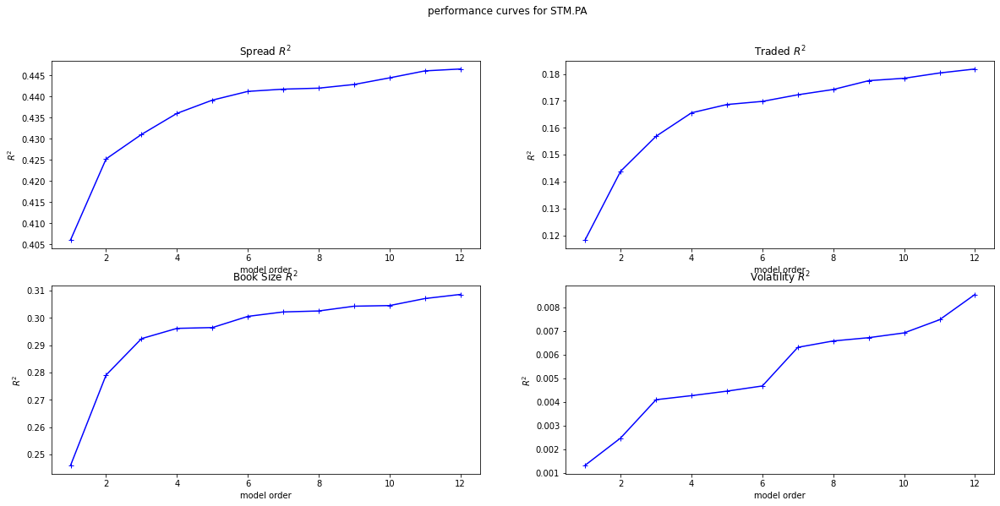

STM.PA Done


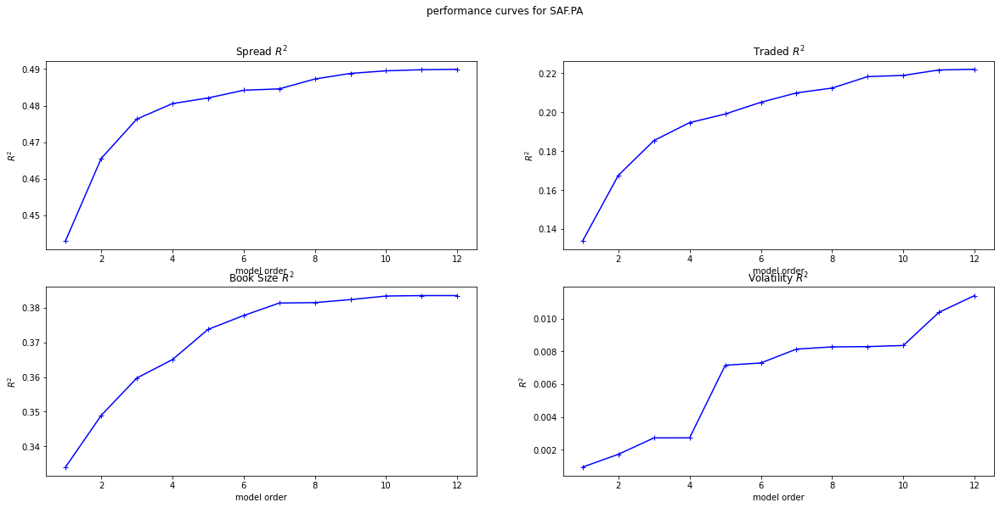

SAF.PA Done


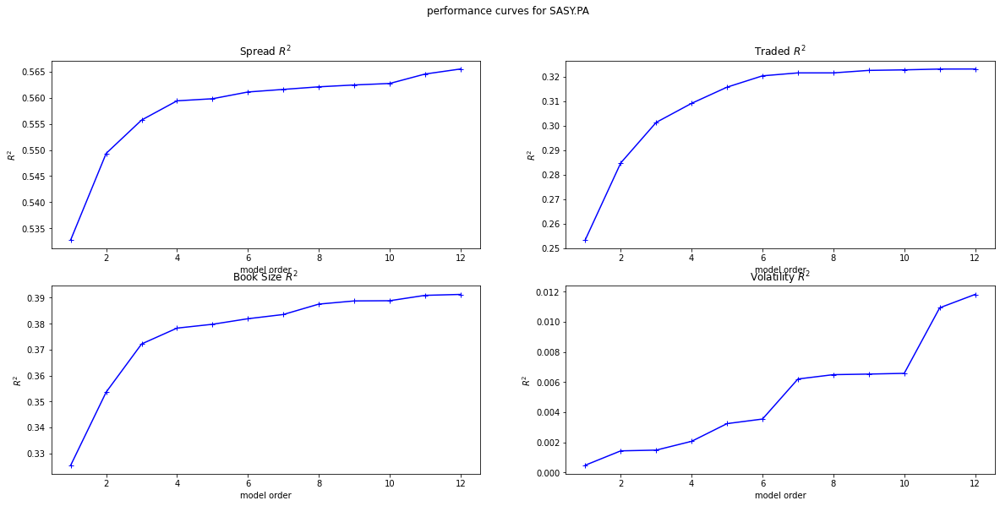

SASY.PA Done


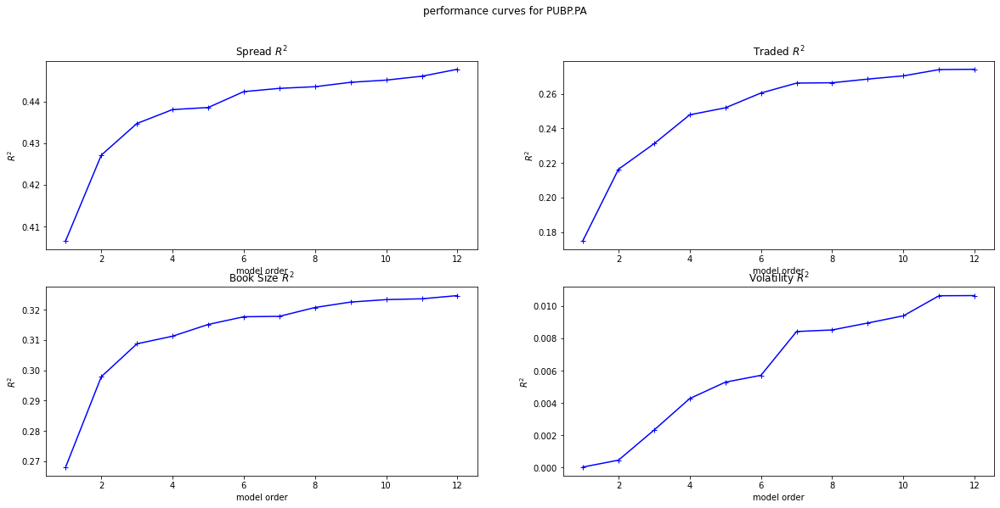

PUBP.PA Done


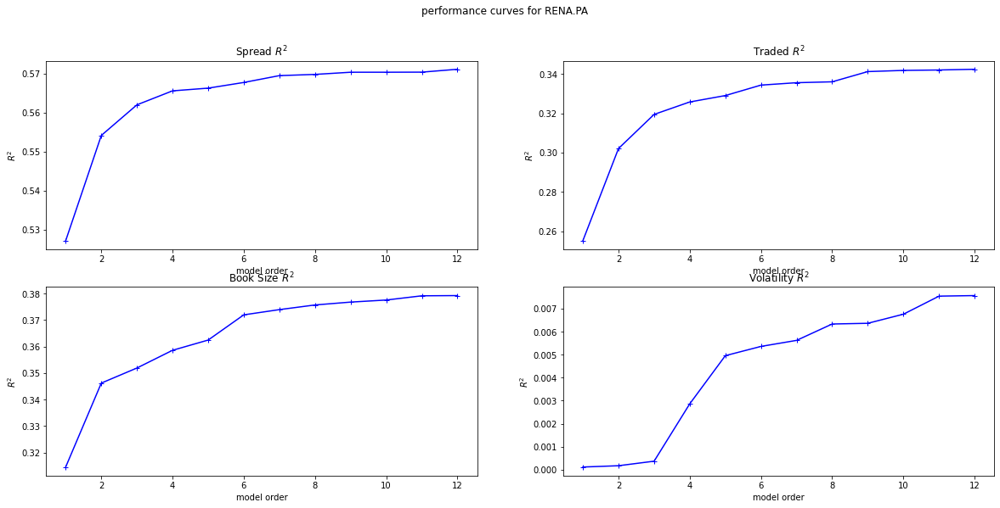

RENA.PA Done


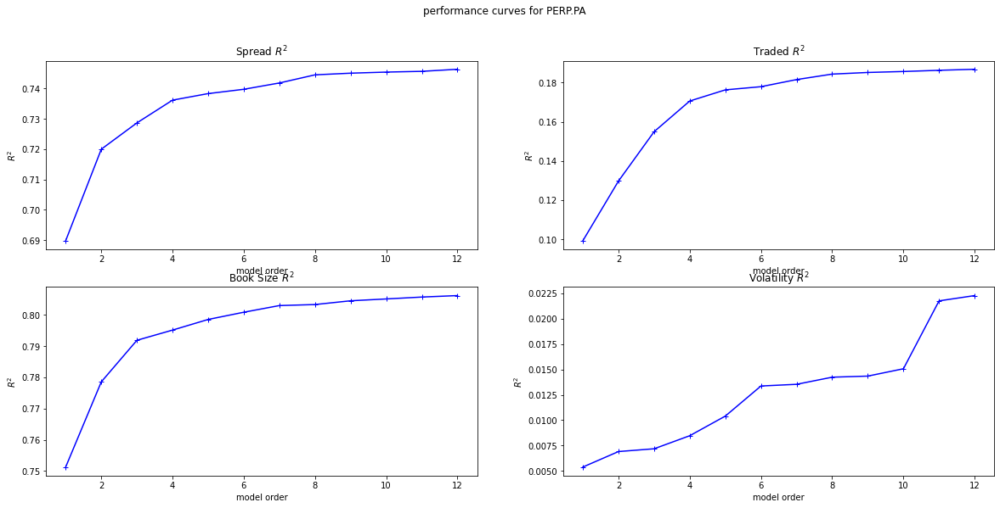

PERP.PA Done


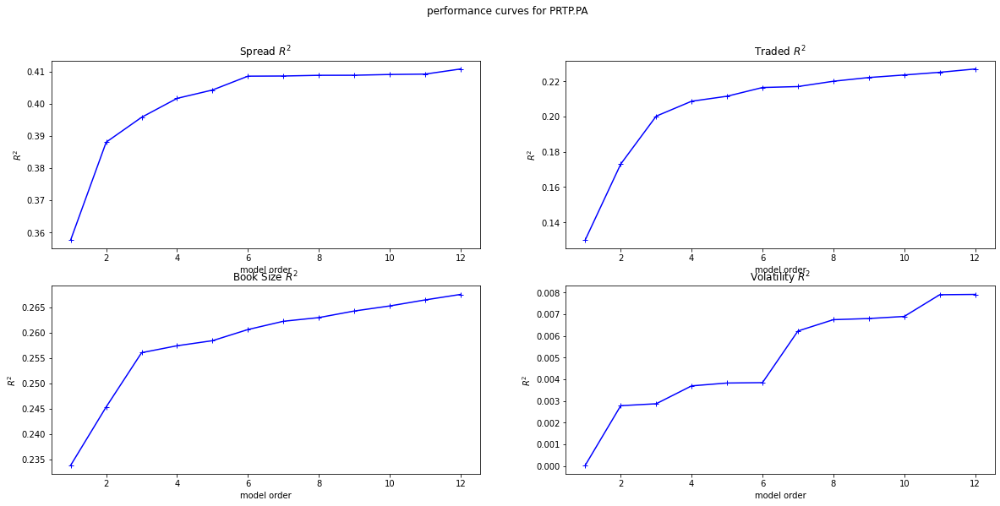

PRTP.PA Done


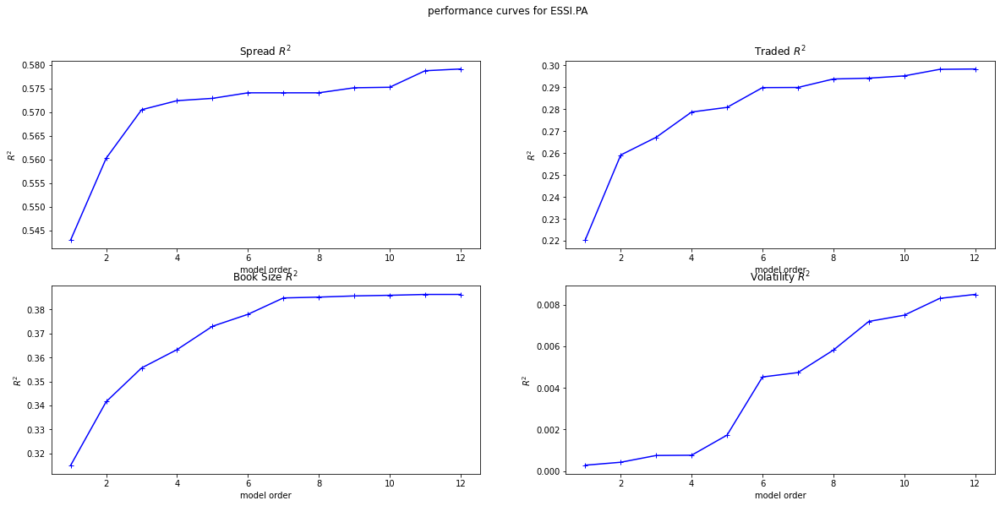

ESSI.PA Done


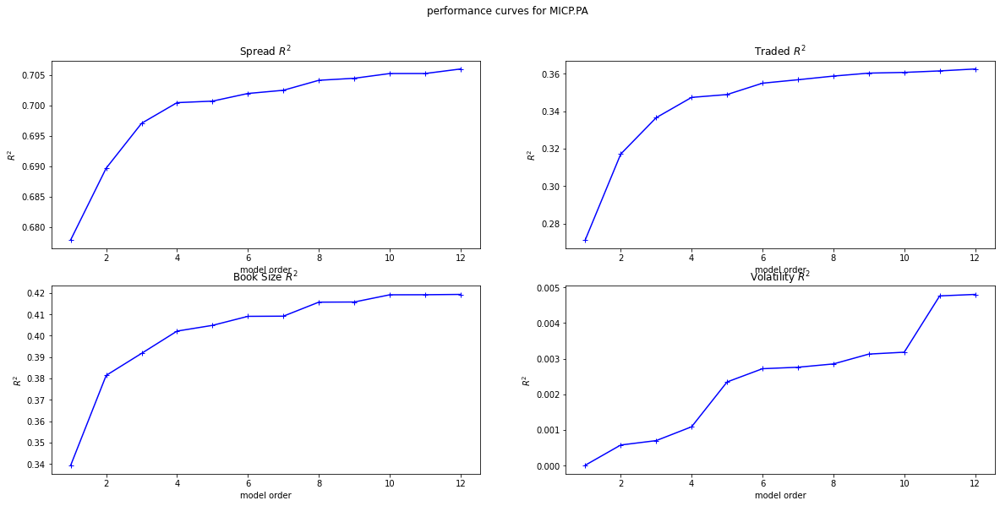

MICP.PA Done


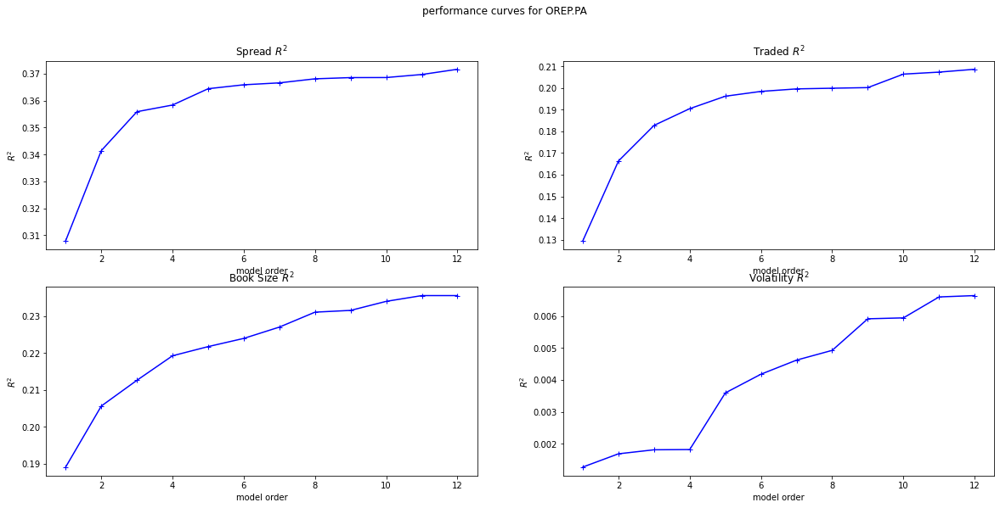

OREP.PA Done


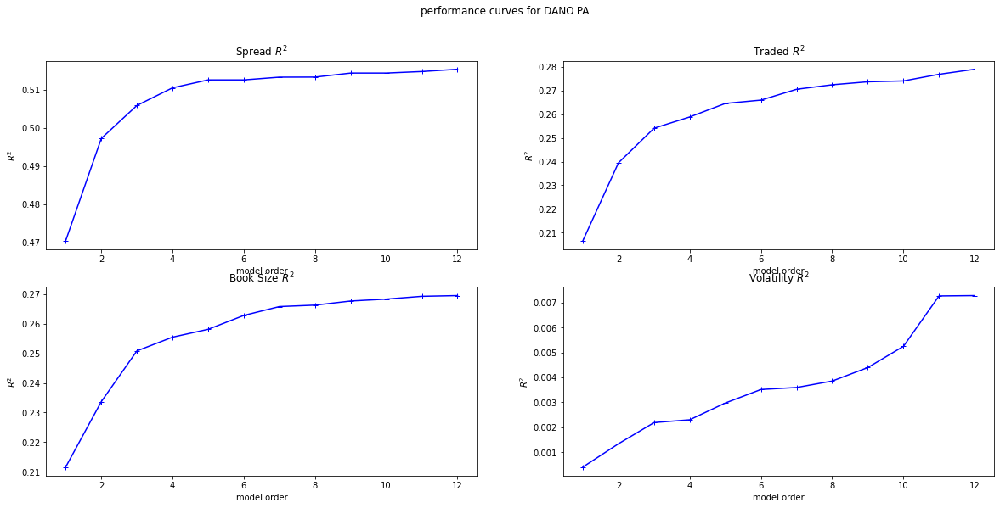

DANO.PA Done


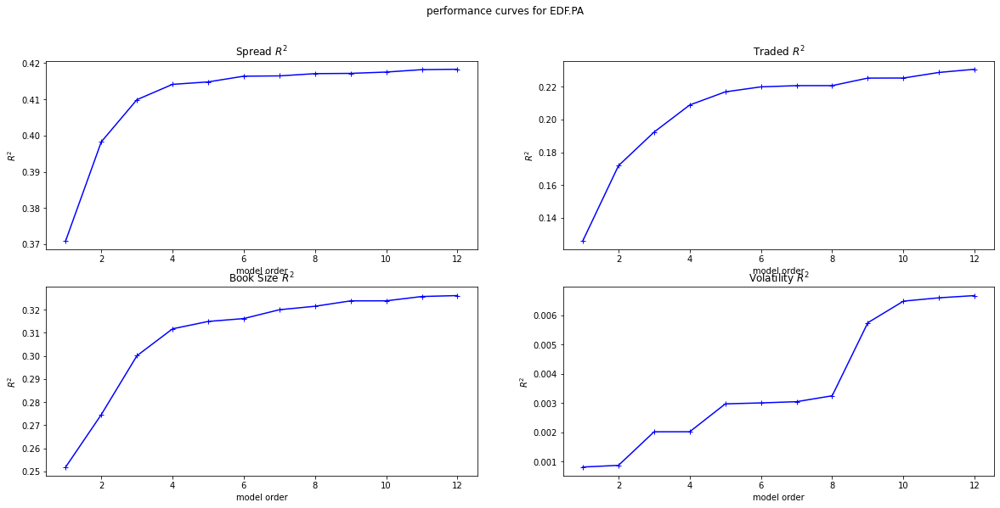

EDF.PA Done


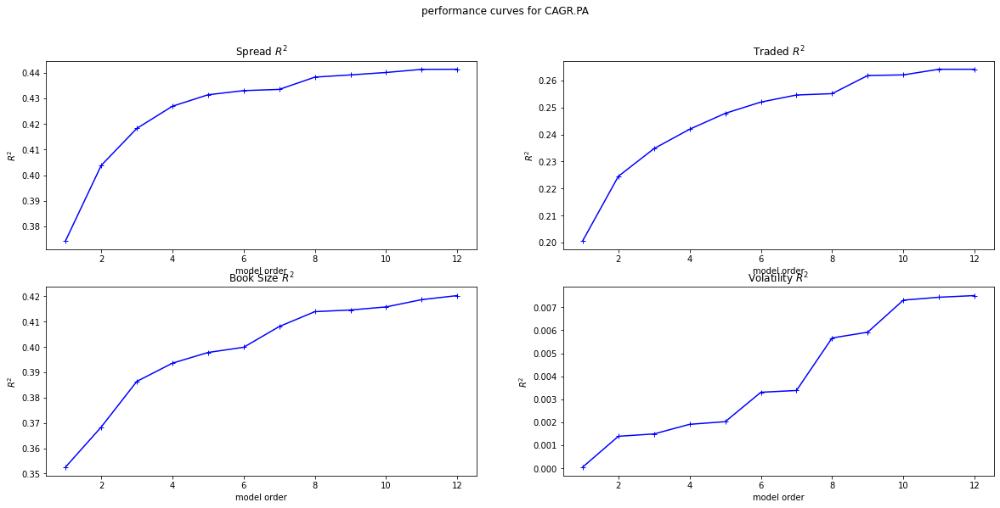

CAGR.PA Done


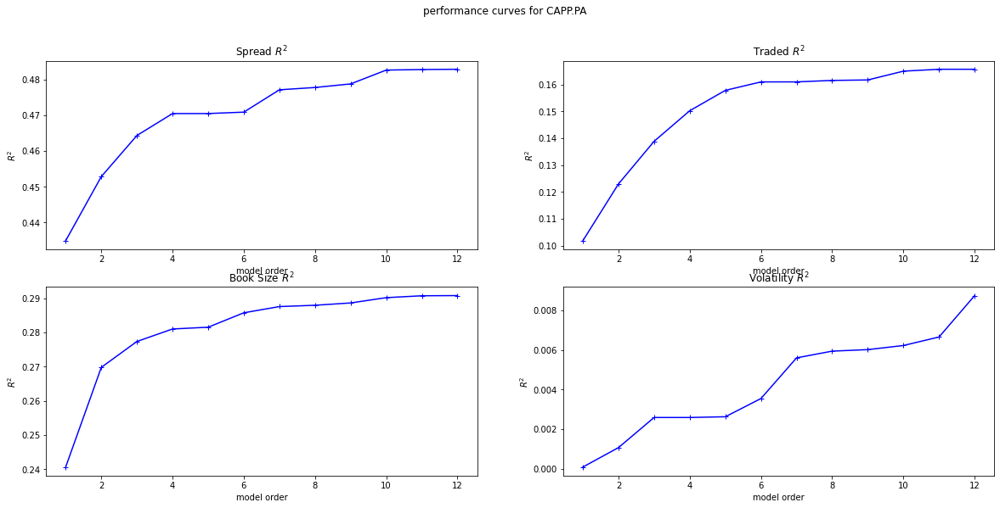

CAPP.PA Done


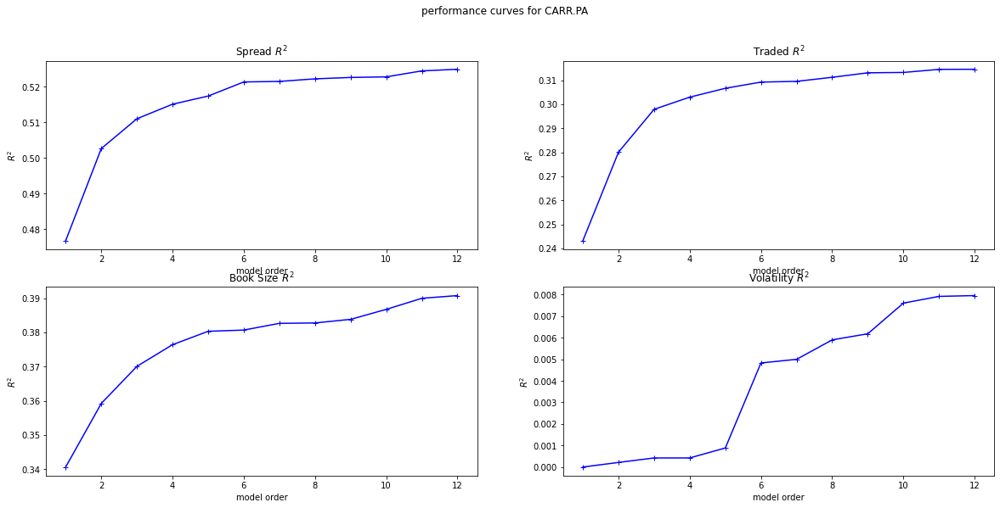

CARR.PA Done


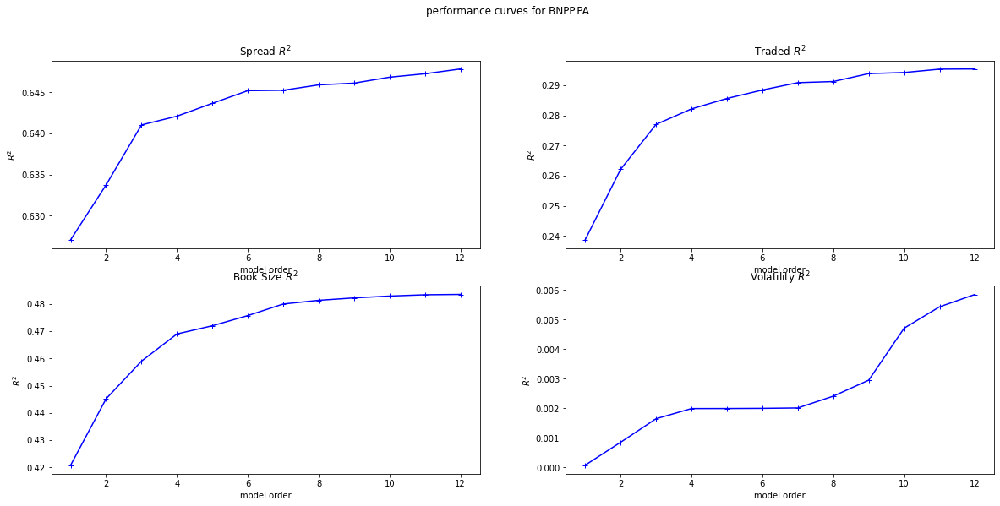

BNPP.PA Done


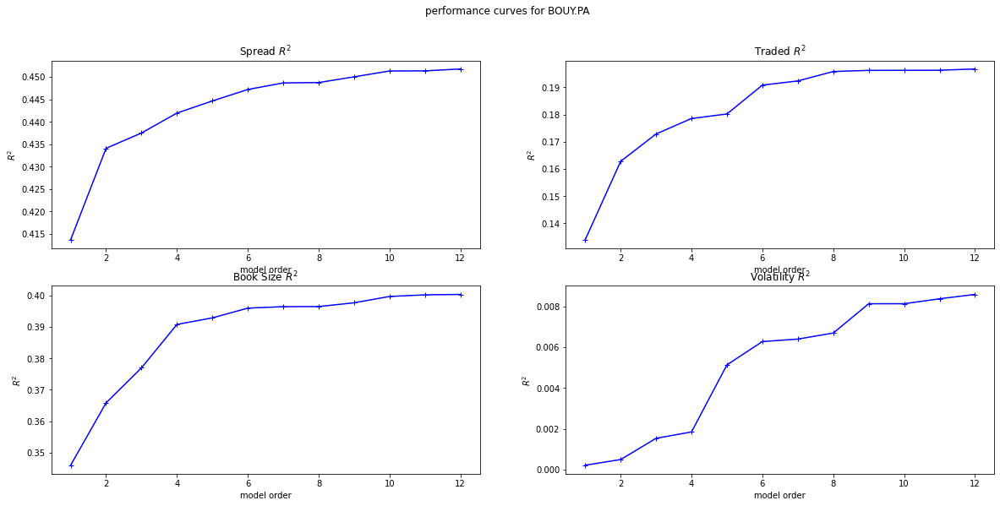

BOUY.PA Done


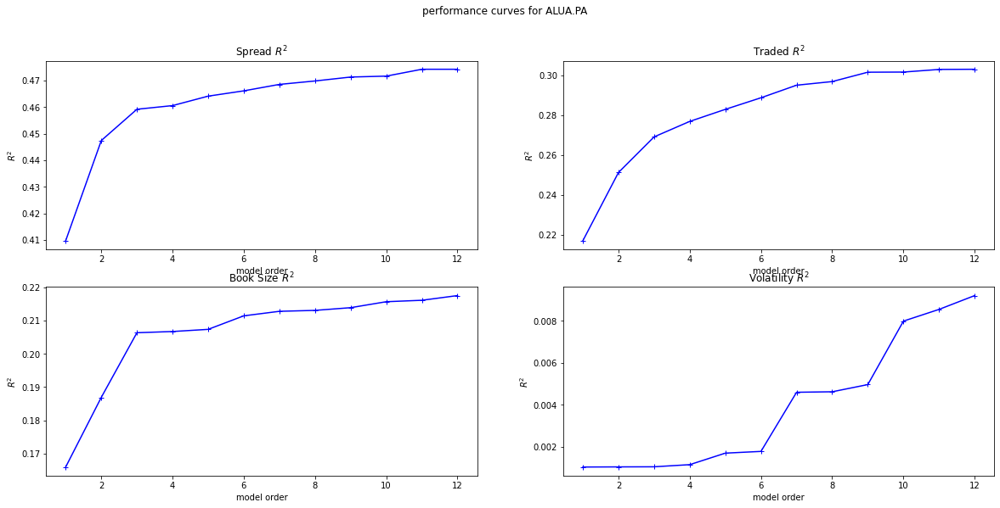

ALUA.PA Done


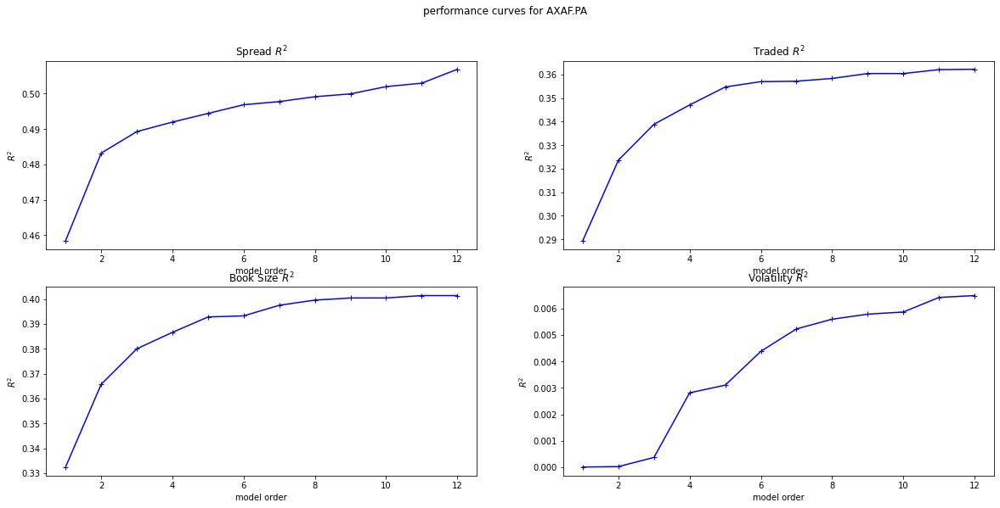

AXAF.PA Done


In [0]:
outputPdf = PdfPages('day4-r-coeffs.pdf')
for stock in os.listdir("/content/drive/My Drive/Colab Notebooks/AR_Models/R_coefs/"):
  data_spread = np.load("/content/drive/My Drive/Colab Notebooks/AR_Models/R_coefs/" + stock + "/" + "R_coefs_" + stock + "_"+  "spread" + ".npy")
  data_book_size = np.load("/content/drive/My Drive/Colab Notebooks/AR_Models/R_coefs/" + stock + "/" + "R_coefs_" + stock + "_"+  "book_size" + ".npy")
  data_traded_value = np.load("/content/drive/My Drive/Colab Notebooks/AR_Models/R_coefs/" + stock + "/" + "R_coefs_" + stock + "_"+  "traded_value" + ".npy")
  data_volatility = np.load("/content/drive/My Drive/Colab Notebooks/AR_Models/R_coefs/" + stock + "/" + "R_coefs_" + stock + "_"+  "volatility" + ".npy")

  fig, axs = plt.subplots(2, 2, figsize=(20,9))
  fig.suptitle("performance curves for {}".format(stock))

  # SPREAD
  axs[0,0].plot(range(1, len(data_spread)+1), data_spread, 'b-+')
  axs[0,0].set_title("Spread $R^2$")
  axs[0,0].set(xlabel='model order', ylabel='$R^2$')
  #axs[0,0].legend(fancybox=True)

  #TRADED
  axs[0,1].plot(range(1, len(data_traded_value)+1), data_traded_value, 'b-+')
  axs[0,1].set_title("Traded $R^2$")
  axs[0,1].set(xlabel='model order', ylabel='$R^2$')
  #axs[0,1].legend(fancybox=True)

  #BOOK
  axs[1,0].plot(range(1, len(data_book_size)+1) ,data_book_size, 'b-+')
  axs[1,0].set_title("Book Size $R^2$")
  axs[1,0].set(xlabel='model order', ylabel='$R^2$')
  #axs[1,0].legend(fancybox=True)

  #VOLATILITY
  axs[1,1].plot(range(1, len(data_volatility)+1) ,data_volatility, 'b-+')
  axs[1,1].set_title("Volatility $R^2$")
  axs[1,1].set(xlabel='model order', ylabel='$R^2$')
  #axs[1,1].legend(fancybox=True)
  outputPdf.savefig()
  plt.show()
  print("{} Done".format(stock))
outputPdf.close()

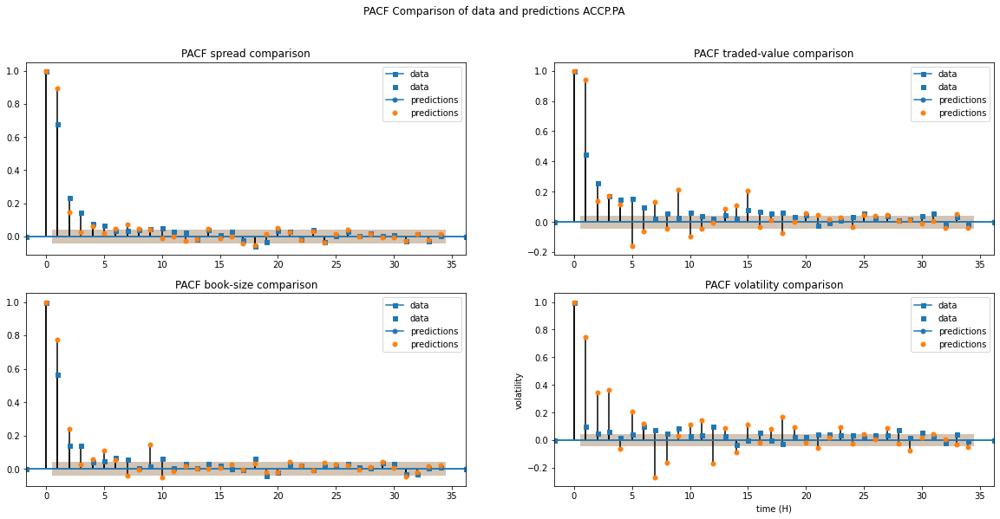

deseasonal_ACCP.PA.csv.gz Done


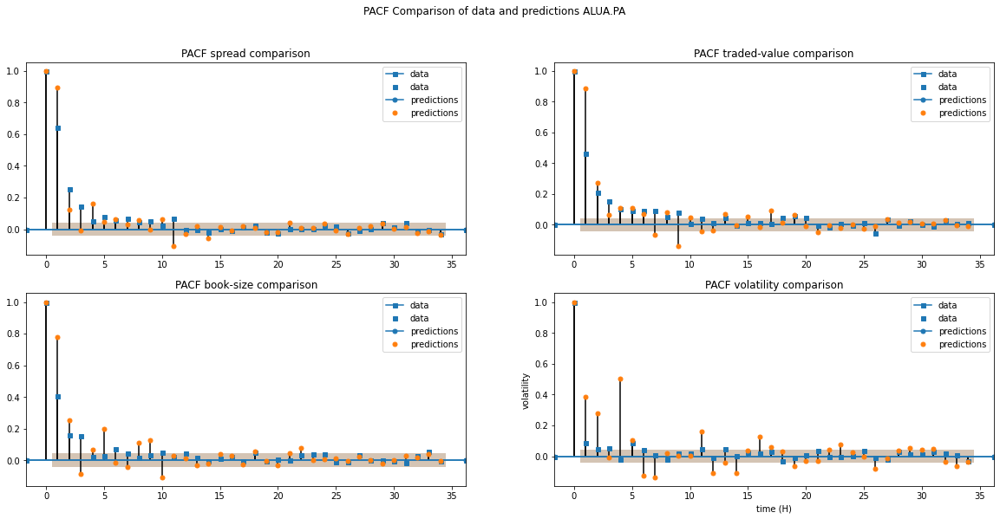

deseasonal_ALUA.PA.csv.gz Done


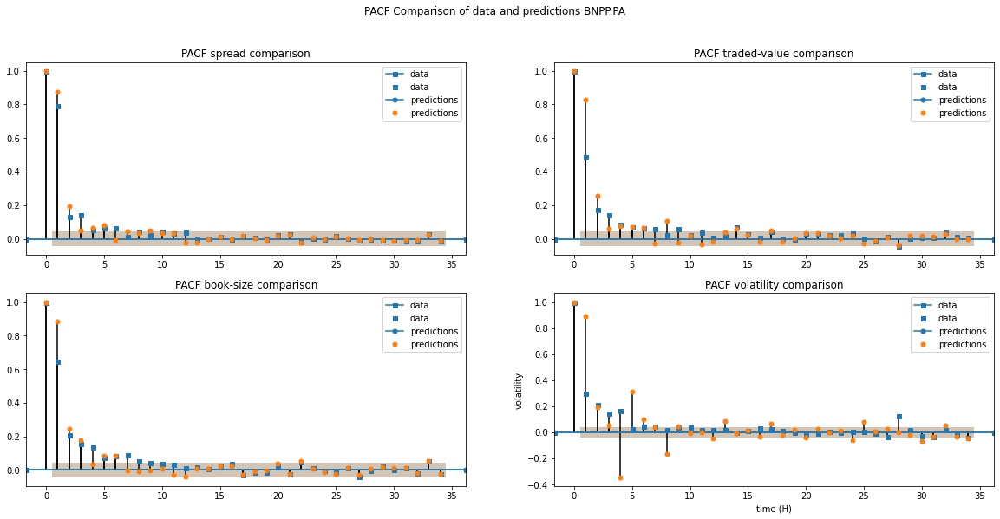

deseasonal_BNPP.PA.csv.gz Done


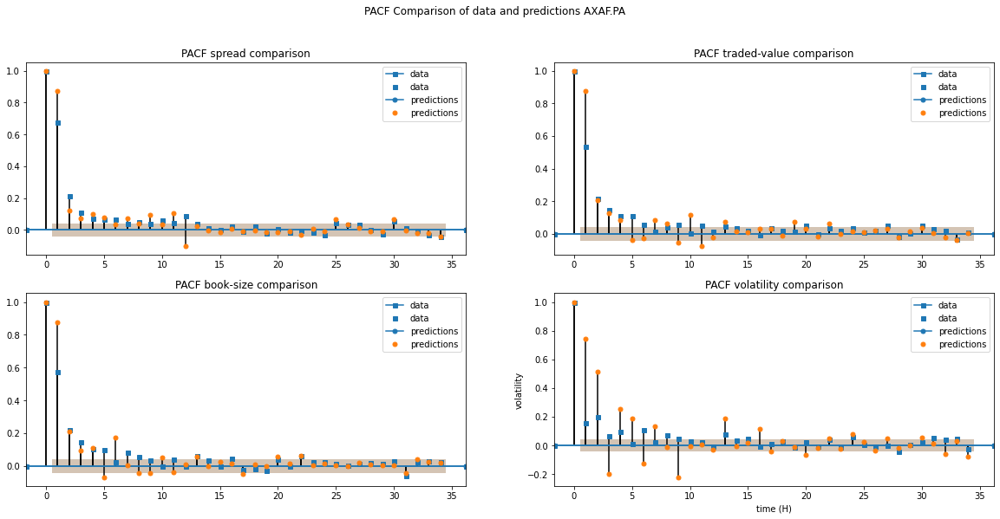

deseasonal_AXAF.PA.csv.gz Done


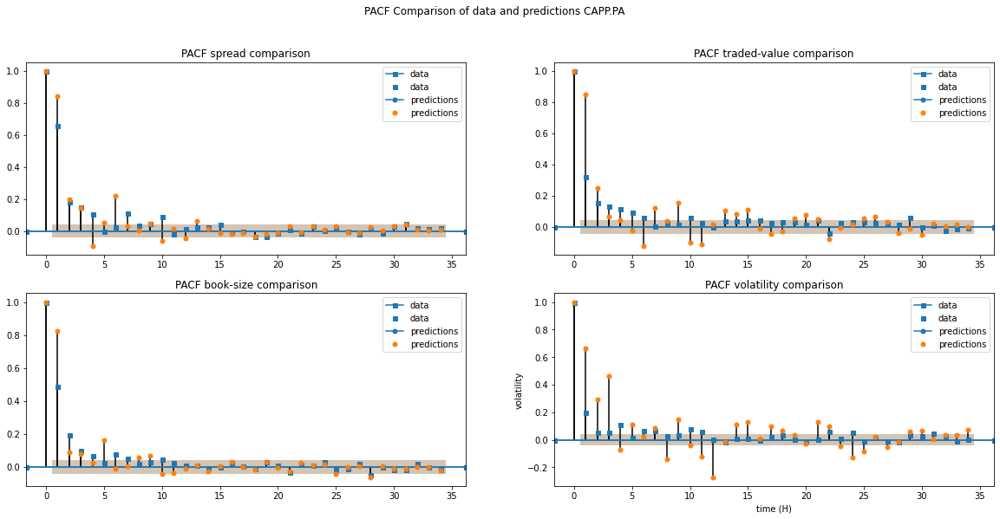

deseasonal_CAPP.PA.csv.gz Done


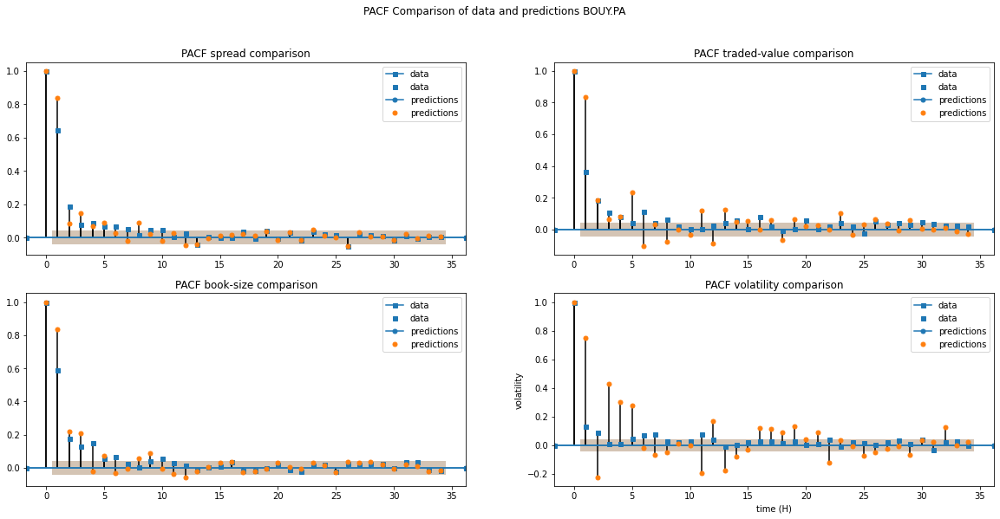

deseasonal_BOUY.PA.csv.gz Done


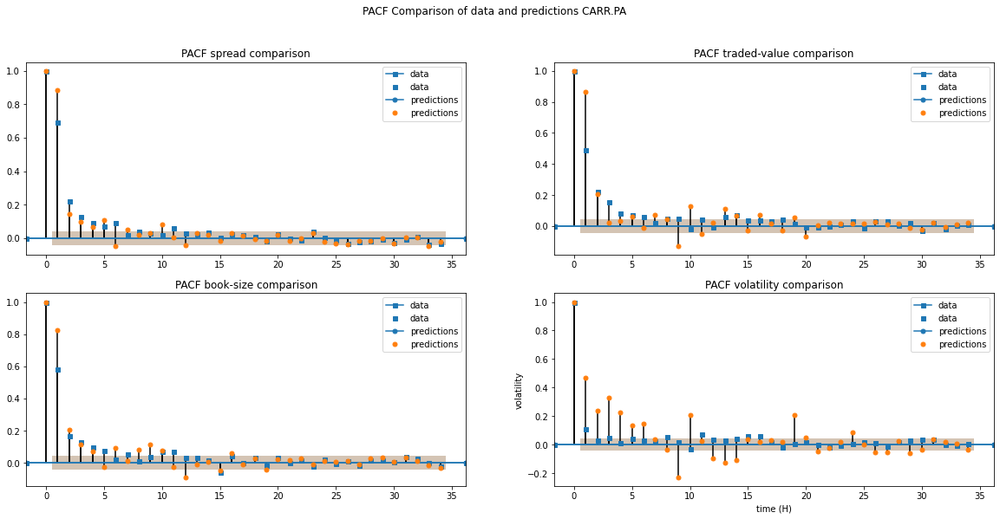

deseasonal_CARR.PA.csv.gz Done


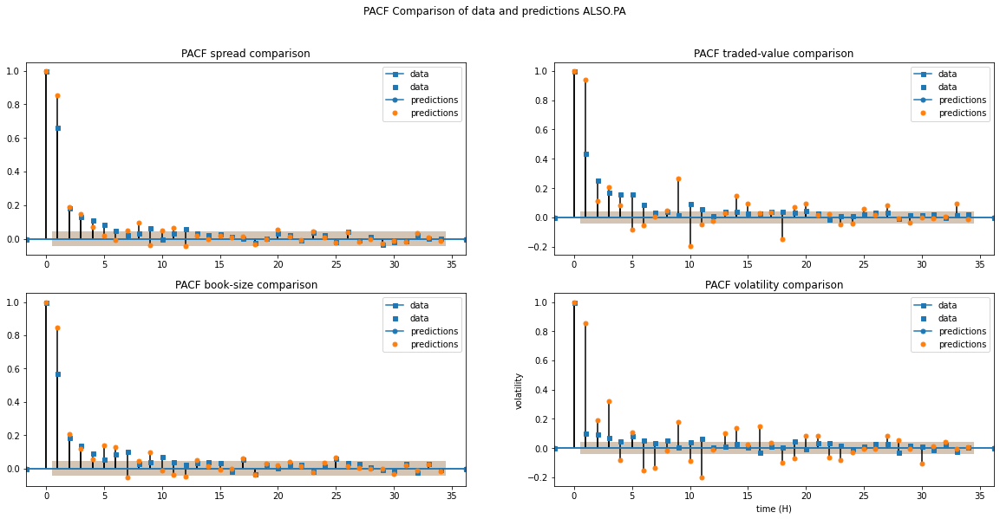

deseasonal_ALSO.PA.csv.gz Done


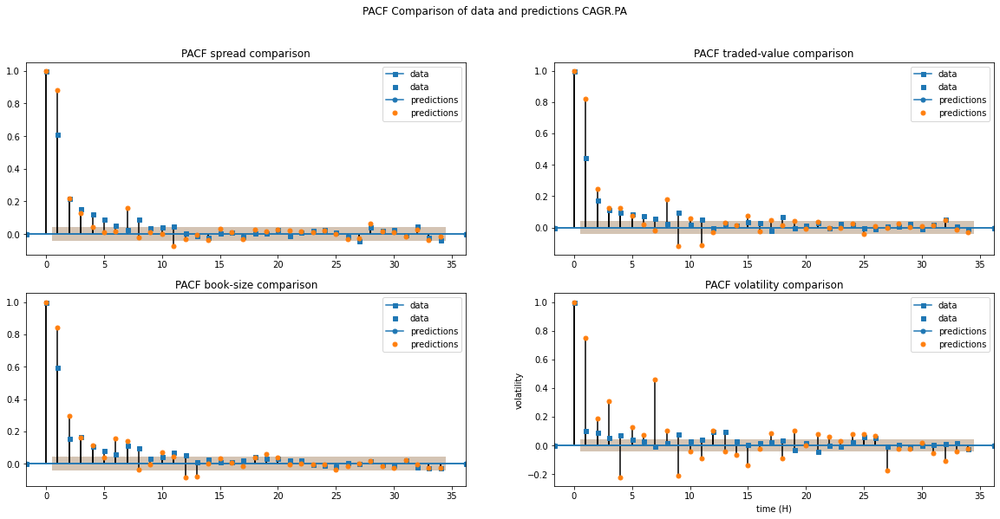

deseasonal_CAGR.PA.csv.gz Done


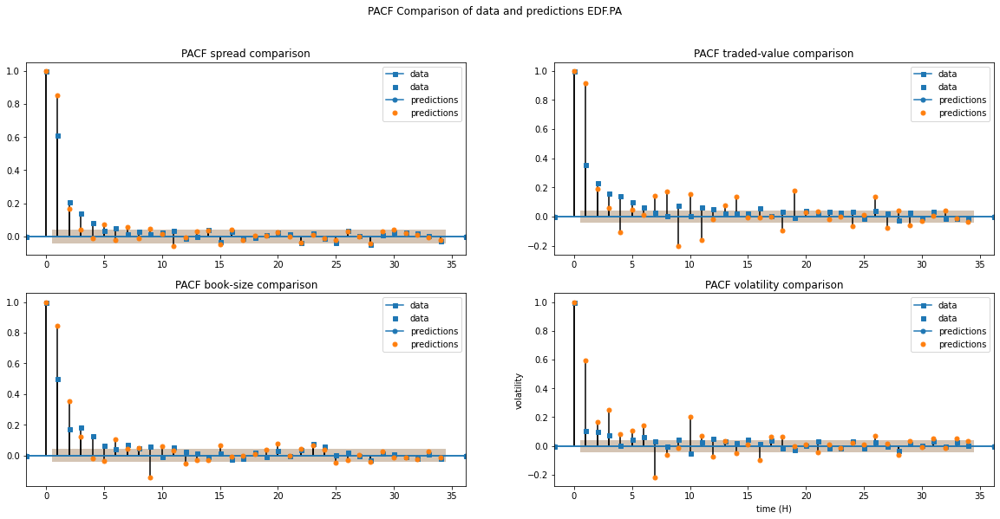

deseasonal_EDF.PA.csv.gz Done


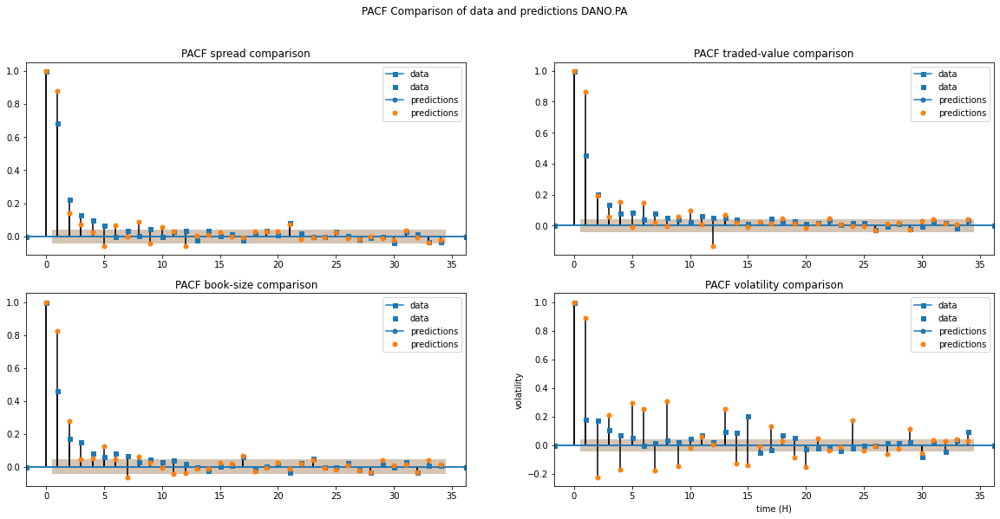

deseasonal_DANO.PA.csv.gz Done


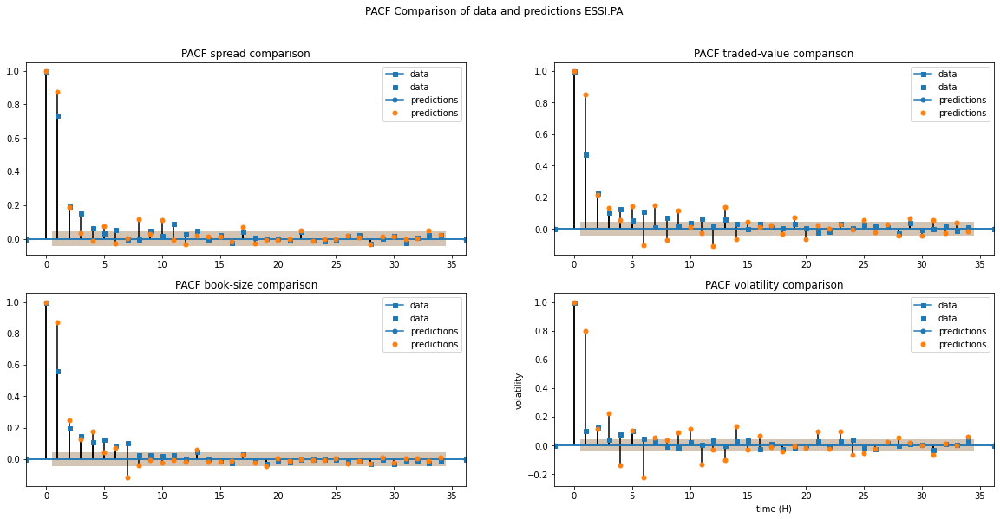

deseasonal_ESSI.PA.csv.gz Done


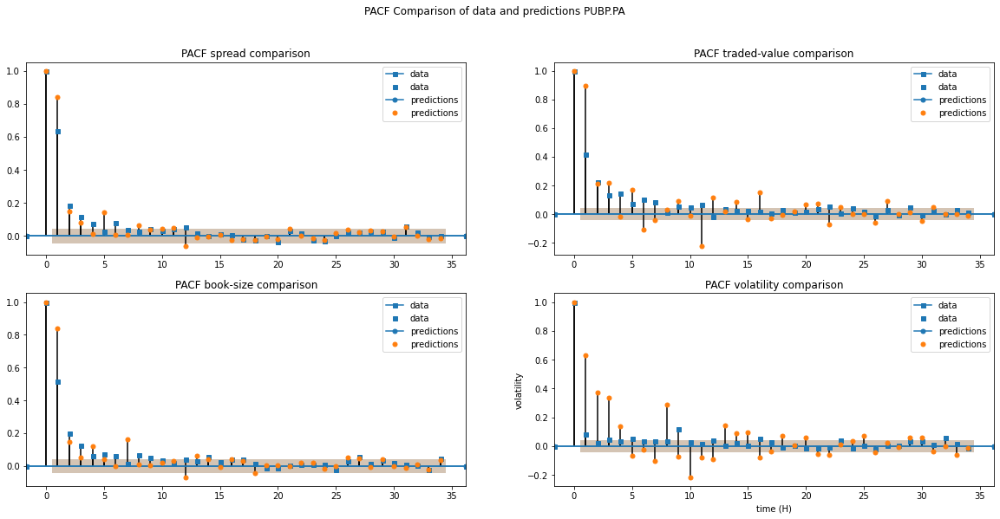

deseasonal_PUBP.PA.csv.gz Done


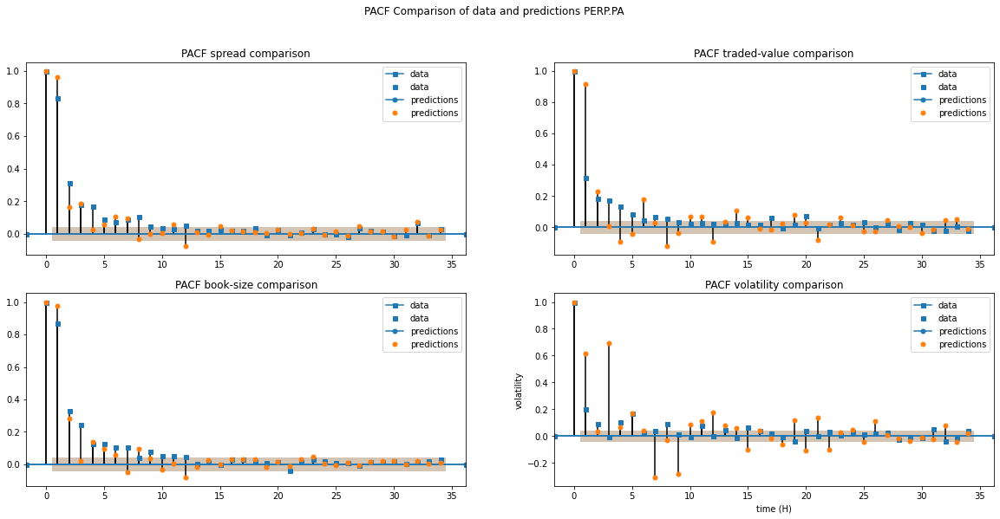

deseasonal_PERP.PA.csv.gz Done


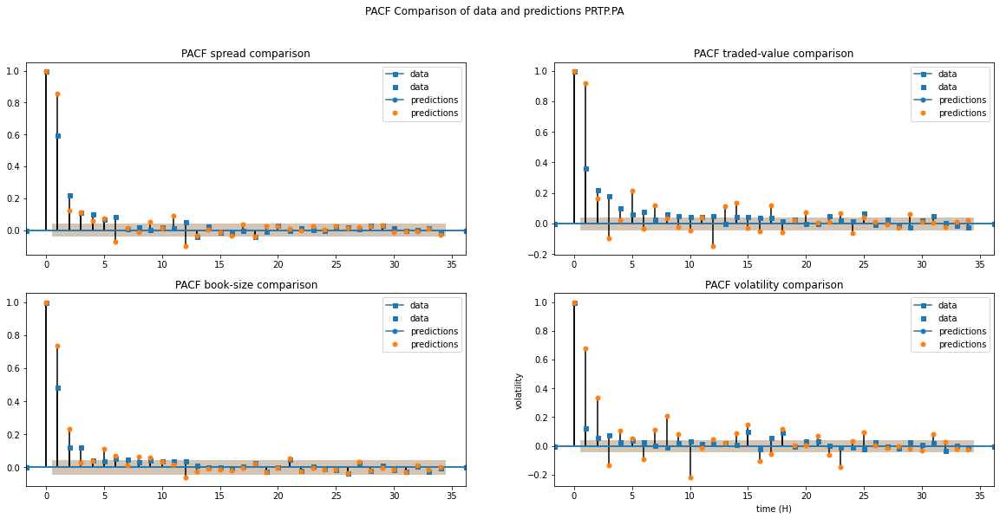

deseasonal_PRTP.PA.csv.gz Done


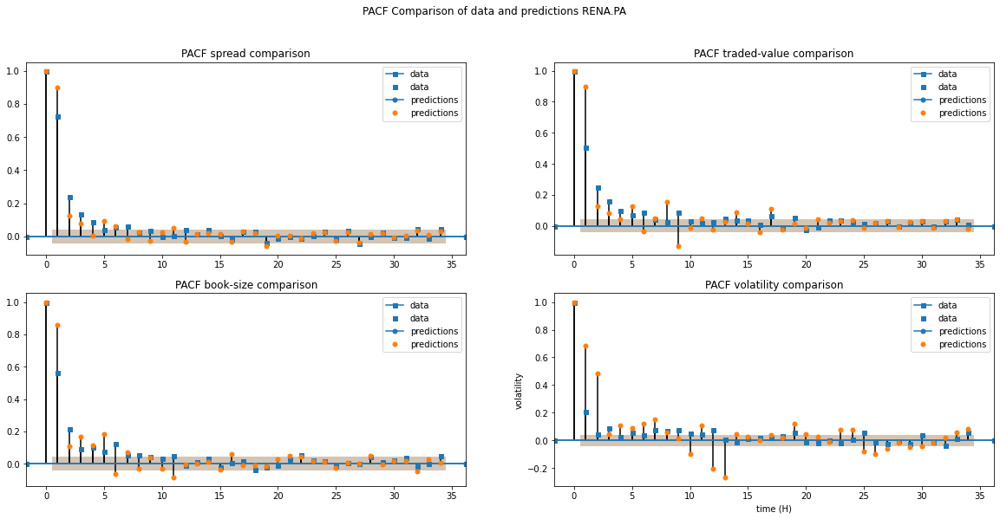

deseasonal_RENA.PA.csv.gz Done


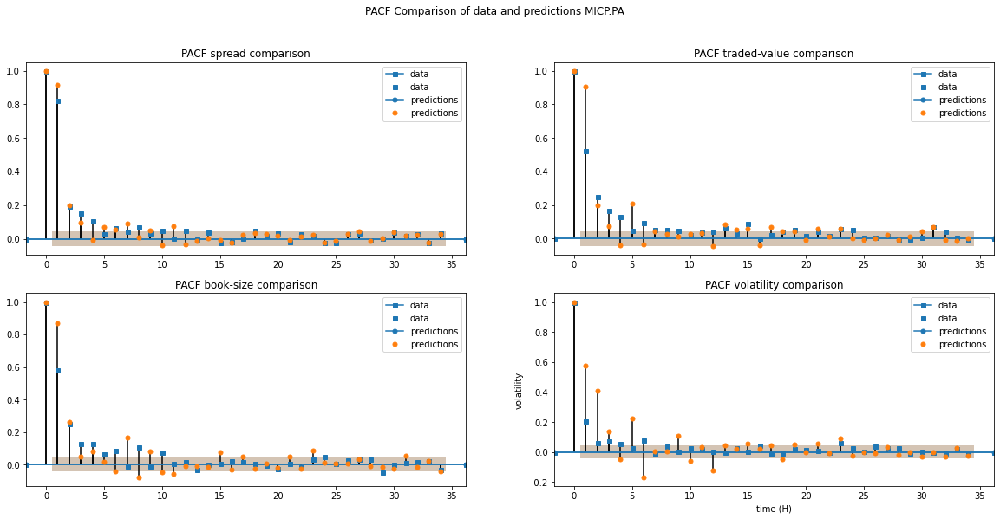

deseasonal_MICP.PA.csv.gz Done


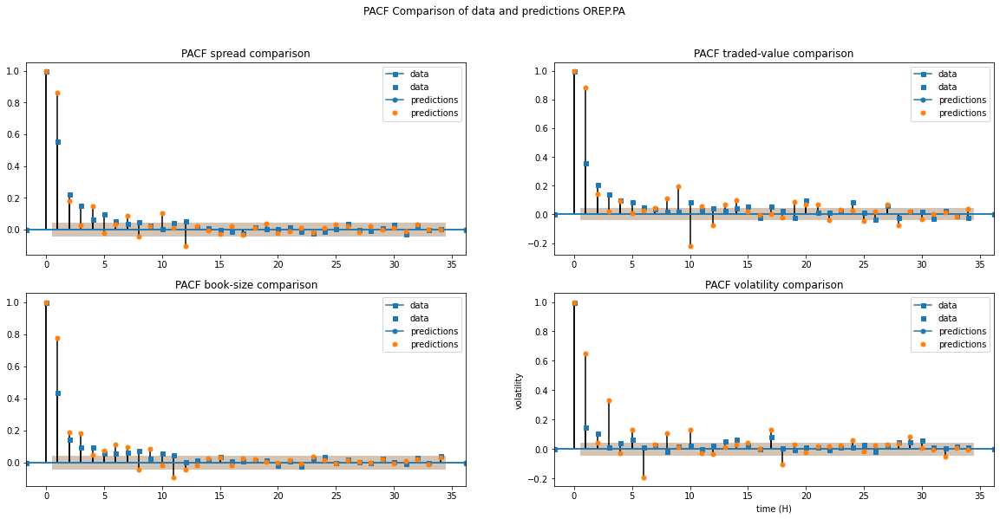

deseasonal_OREP.PA.csv.gz Done


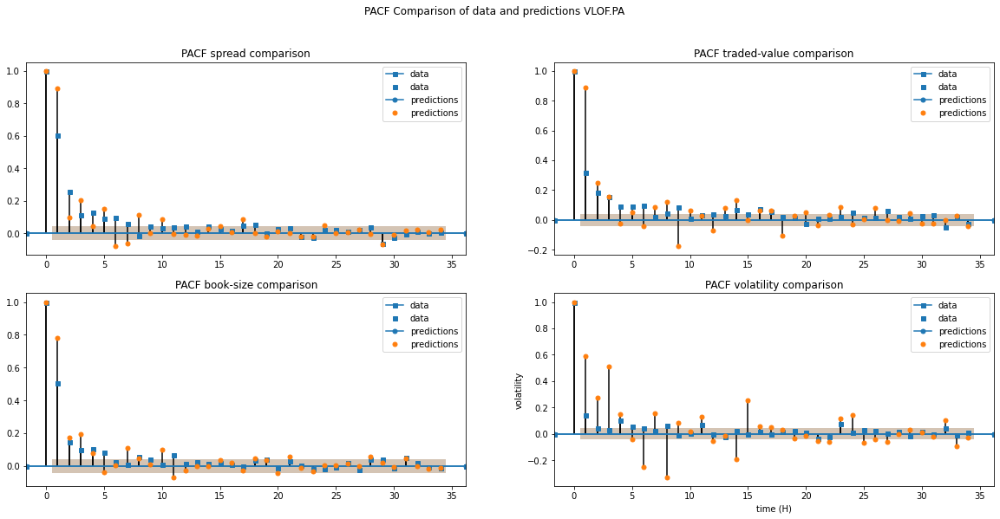

deseasonal_VLOF.PA.csv.gz Done


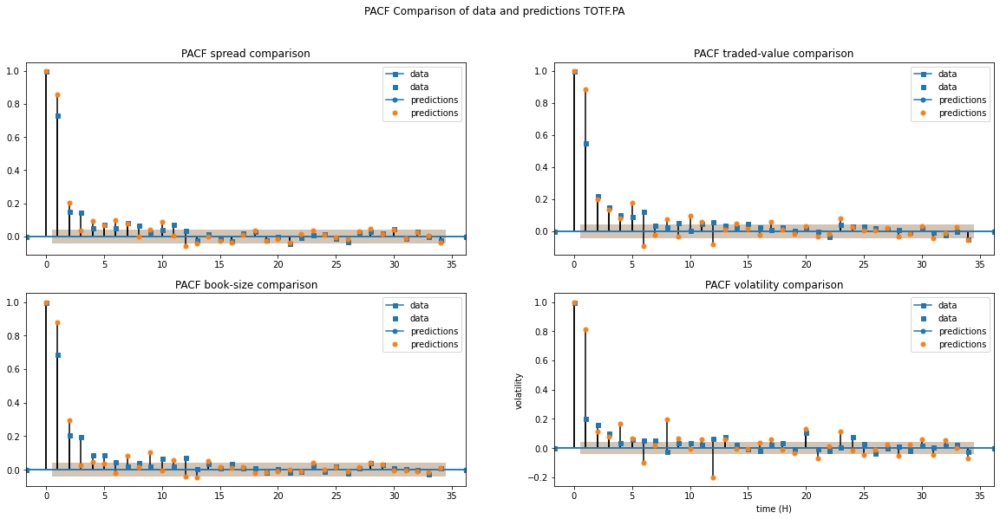

deseasonal_TOTF.PA.csv.gz Done


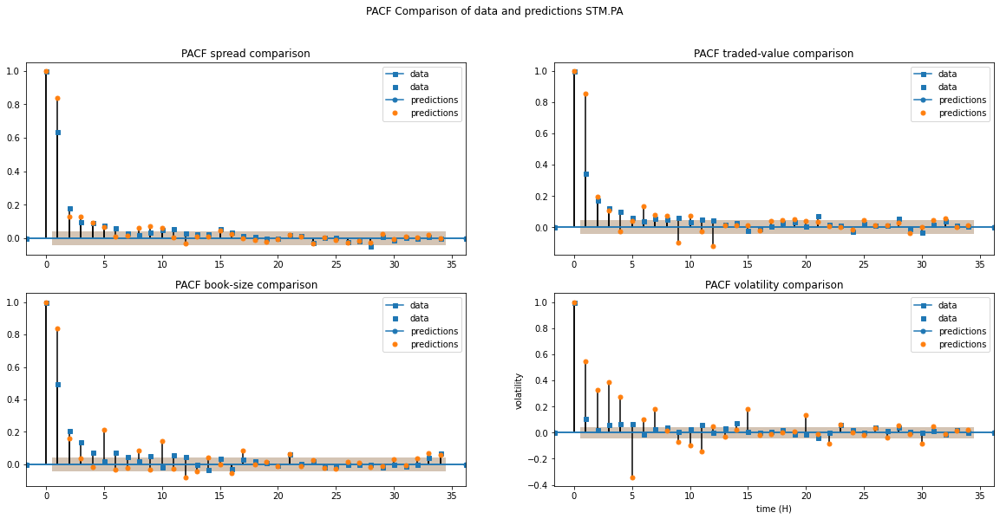

deseasonal_STM.PA.csv.gz Done


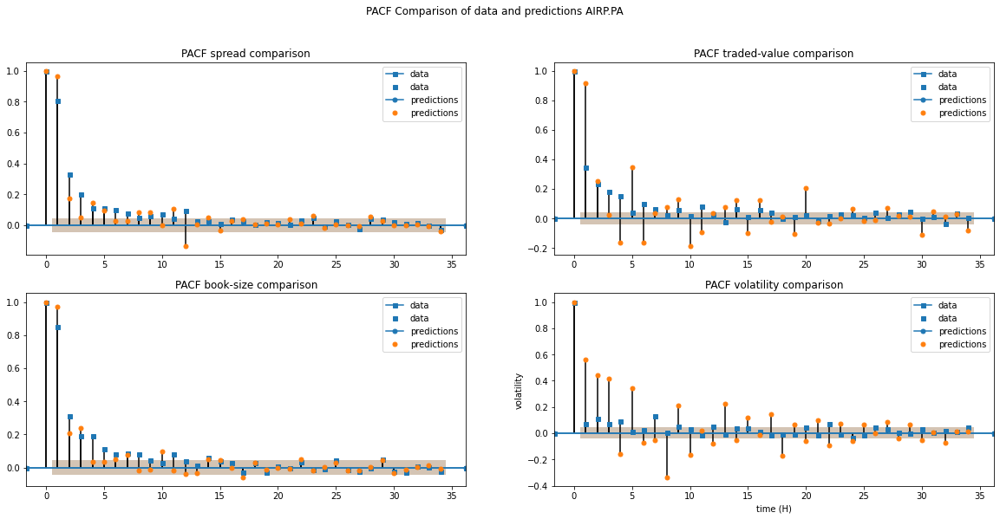

deseasonal_AIRP.PA.csv.gz Done


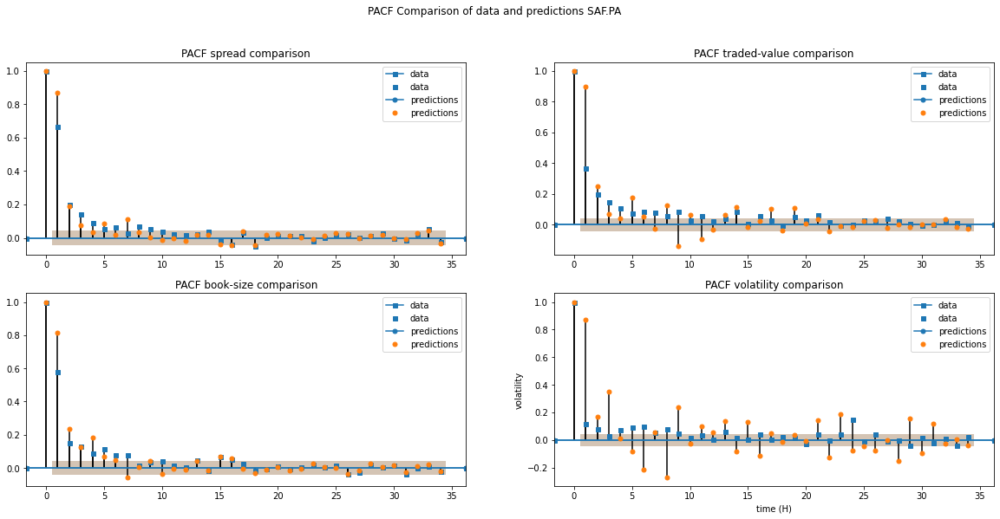

deseasonal_SAF.PA.csv.gz Done


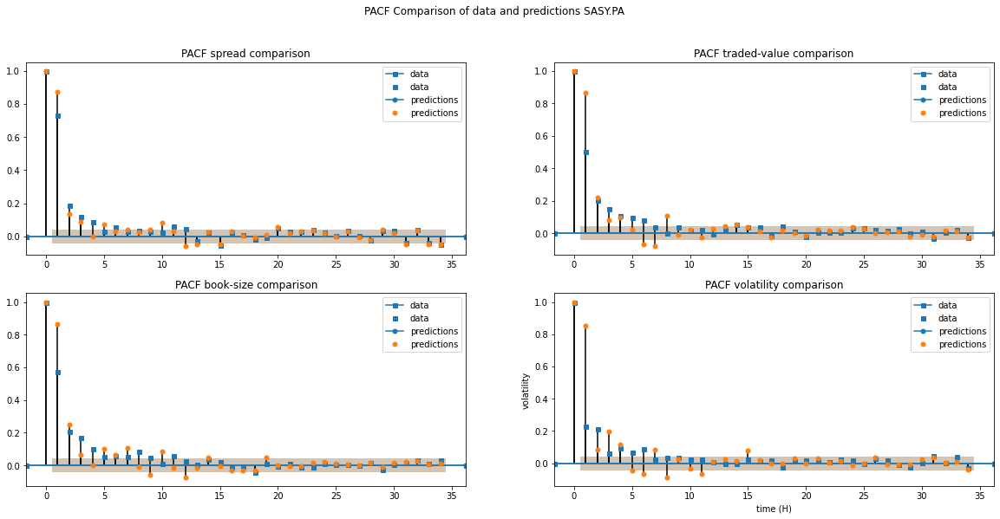

deseasonal_SASY.PA.csv.gz Done


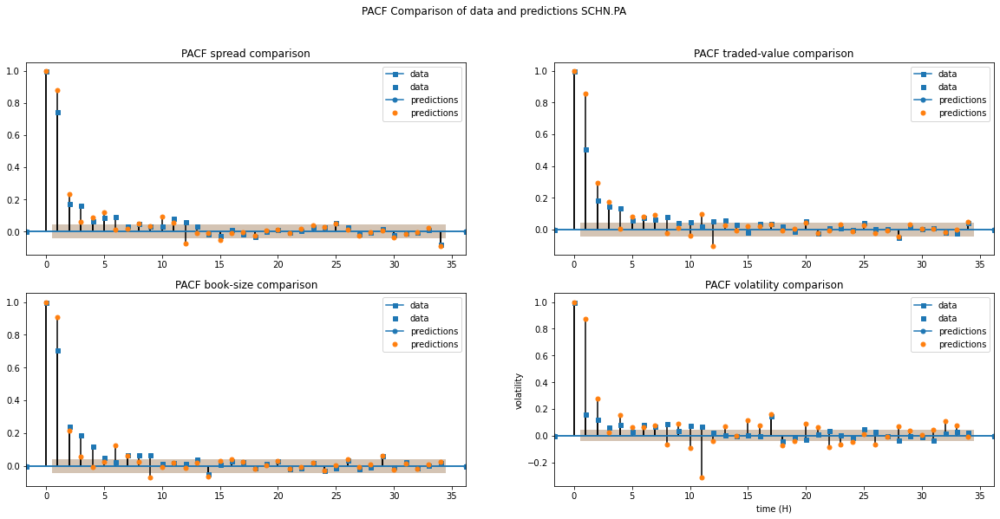

deseasonal_SCHN.PA.csv.gz Done


In [0]:
outputPdf = PdfPages('day4-pacf-comparison.pdf')
for stock in os.listdir(path_data_frame_deseasonal):

  # Chargement des modèles AR et des données sans saisonalités
  data = pd.read_csv(path_data_frame_deseasonal + '/' + stock)
  AR_spread = ARMAResults.load("/content/drive/My Drive/Colab Notebooks/AR_Models/" + "model_" + stock[11:-7] + "_" +  "spread" + ".pkl")
  AR_book_size = ARMAResults.load("/content/drive/My Drive/Colab Notebooks/AR_Models/" + "model_" + stock[11:-7] + "_" +  "book_size" + ".pkl")
  AR_traded_value = ARMAResults.load("/content/drive/My Drive/Colab Notebooks/AR_Models/" + "model_" + stock[11:-7] + "_" +  "traded_value" + ".pkl")
  AR_volatility = ARMAResults.load("/content/drive/My Drive/Colab Notebooks/AR_Models/" + "model_" + stock[11:-7] + "_" +  "volatility" + ".pkl")

  # Predictions à partir des modèles AR
  predict_spread = AR_spread.predict(start=0, end=len(data["spread"].values))
  predict_book_size = AR_book_size.predict(start=0, end=len(data["book_size"].values))
  predict_traded_value = AR_traded_value.predict(start=0, end=len(data["traded_value"].values))
  predict_volatility = AR_volatility.predict(start=0, end=len(data["volatility"].values))


  fig, axs = plt.subplots(2, 2, figsize=(20,9))
  fig.suptitle("PACF Comparison of data and predictions {}".format(stock[11:-7]))

  # SPREAD
  plot_pacf(data["spread"].values, ax = axs[0,0], marker="s", markersize=5, linewidth=1.5, label="data")
  plot_pacf(predict_spread, ax = axs[0,0], marker="o", markersize=5, linewidth=1.5, label="predictions")
  axs[0,0].set_title("PACF spread comparison")
  #axs[0,0].set(xlabel='time (H)', ylabel='price (€)')
  axs[0,0].legend(fancybox=True)

  #TRADED
  plot_pacf(data["traded_value"].values, ax = axs[0,1], marker="s", markersize=5, linewidth=1.5, label="data")
  plot_pacf(predict_traded_value, ax = axs[0,1], marker="o", markersize=5, linewidth=1.5, label="predictions")
  axs[0,1].set_title("PACF traded-value comparison")
  axs[0,1].legend(fancybox=True)

  #BOOK
  plot_pacf(data["book_size"].values, ax = axs[1,0], marker="s", markersize=5, linewidth=1.5, label="data")
  plot_pacf(predict_book_size, ax = axs[1,0], marker="o", markersize=5, linewidth=1.5, label="predictions")
  axs[1,0].set_title("PACF book-size comparison")
  #axs[1,0].set(xlabel='time (H)', ylabel='volume')
  axs[1,0].legend(fancybox=True)

  #VOLATILITY
  plot_pacf(data["volatility"].values, ax = axs[1,1], marker="s", markersize=5, linewidth=1.5, label="data")
  plot_pacf(predict_volatility, ax = axs[1,1], marker="o", markersize=5, linewidth=1.5, label="predictions")
  axs[1,1].set_title("PACF volatility comparison")
  axs[1,1].set(xlabel='time (H)', ylabel='volatility')
  axs[1,1].legend(fancybox=True)
  outputPdf.savefig()
  plt.show()
  print("{} Done".format(stock))
outputPdf.close()


In [0]:
with open('/content/drive/My Drive/Colab Notebooks/R_coefficients.json') as json_data:
  R_coefficients = json.load(json_data) # coefficients R^2 de nos meilleurs modéles pour chaque stock
spread = np.array(R_coefficients["spread"])
book_size = np.array(R_coefficients["book_size"])
traded_value = np.array(R_coefficients["traded_value"])
volatility = np.array(R_coefficients["volatility"])

print("mean R^2 coefficient spread : %.4f"%np.mean(spread))
print("sd R^2 coefficient spread : %.4f"%np.std(spread))
print("mean R^2 coefficient traded-value : %.4f"%np.mean(traded_value))
print("sd R^2 coefficient traded-value : %.4f"%np.std(traded_value))
print("mean R^2 coefficient book-size : %.4f"%np.mean(book_size))
print("sd R^2 coefficient book-size : %.4f"%np.std(book_size))
print("mean R^2 coefficient volatiity : %.4f"%np.mean(volatility))
print("sd R^2 coefficient volatility : %.4f"%np.std(volatility))


mean R^2 coefficient spread : 0.5249
sd R^2 coefficient spread : 0.0971
mean R^2 coefficient traded-value : 0.2724
sd R^2 coefficient traded-value : 0.0629
mean R^2 coefficient book-size : 0.4005
sd R^2 coefficient book-size : 0.1411
mean R^2 coefficient volatiity : 0.0657
sd R^2 coefficient volatility : 0.0350


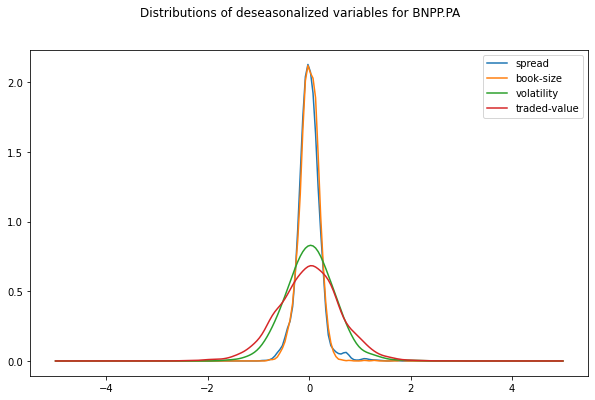

In [0]:
import scipy.stats as stats
#/content/drive/My Drive/Colab Notebooks/Dataframe_EI_deseasonal/deseasonal_ACCP.PA.csv.gz
data = pd.read_csv(path_data_frame_deseasonal + '/' +"deseasonal_BNPP.PA.csv.gz")


density_spread = stats.kde.gaussian_kde(data["spread"].values)
density_book = stats.kde.gaussian_kde(data["book_size"].values)
density_volatility = stats.kde.gaussian_kde(data["volatility"].values)
density_traded = stats.kde.gaussian_kde(data["traded_value"].values)
x = np.linspace(-5, 5, 200)
density_spread = density_spread(x)
density_book = density_book(x)
density_volatility = density_volatility(x)
density_traded = density_traded(x)

fig, ax = plt.subplots(figsize=(10, 6))
ax.plot(x, density_spread, label='spread')
ax.plot(x, density_book, label='book-size')
ax.plot(x, density_volatility, label='volatility')
ax.plot(x, density_traded, label='traded-value')
#ax.set_ylim([0, 2.5])
ax.legend(loc='best')
fig.suptitle("Distributions of deseasonalized variables for BNPP.PA")
plt.savefig("distribustions_BNPP-PA.pdf")
plt.savefig("distribustions_BNPP-PA.png")

deseasonal_ACCP.PA.csv.gz Done
deseasonal_ALUA.PA.csv.gz Done
deseasonal_CAPP.PA.csv.gz Done
deseasonal_BOUY.PA.csv.gz Done
deseasonal_BNPP.PA.csv.gz Done
deseasonal_CARR.PA.csv.gz Done
deseasonal_CAGR.PA.csv.gz Done
deseasonal_EDF.PA.csv.gz Done
deseasonal_ALSO.PA.csv.gz Done
deseasonal_DANO.PA.csv.gz Done
deseasonal_AXAF.PA.csv.gz Done
deseasonal_ESSI.PA.csv.gz Done
deseasonal_PERP.PA.csv.gz Done
deseasonal_RENA.PA.csv.gz Done
deseasonal_PUBP.PA.csv.gz Done
deseasonal_PRTP.PA.csv.gz Done
deseasonal_OREP.PA.csv.gz Done
deseasonal_TOTF.PA.csv.gz Done
deseasonal_STM.PA.csv.gz Done
deseasonal_VLOF.PA.csv.gz Done


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:11: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  # This is added back by InteractiveShellApp.init_path()


deseasonal_AIRP.PA.csv.gz Done
deseasonal_SASY.PA.csv.gz Done
deseasonal_MICP.PA.csv.gz Done
deseasonal_SCHN.PA.csv.gz Done
deseasonal_SAF.PA.csv.gz Done


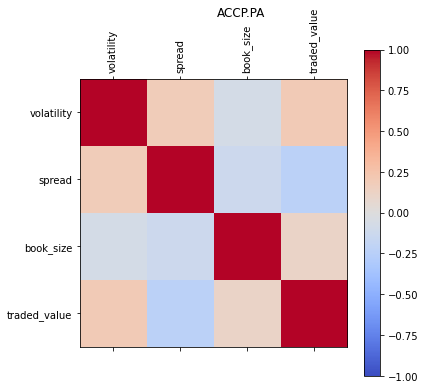

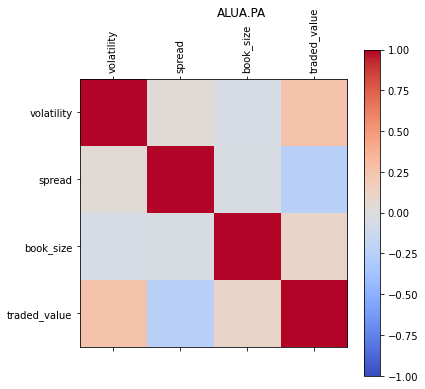

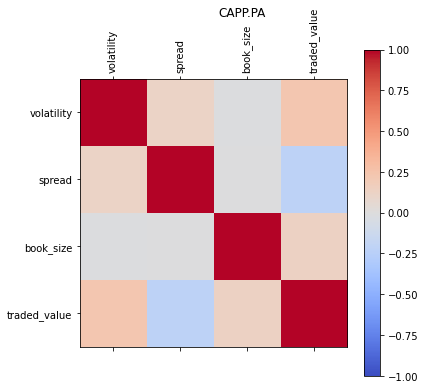

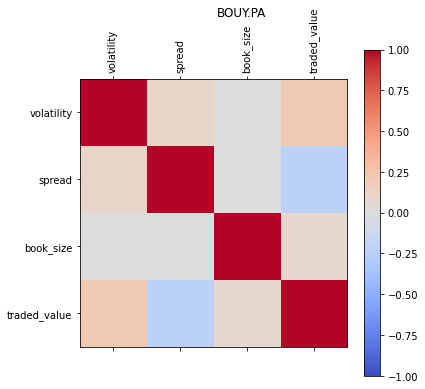

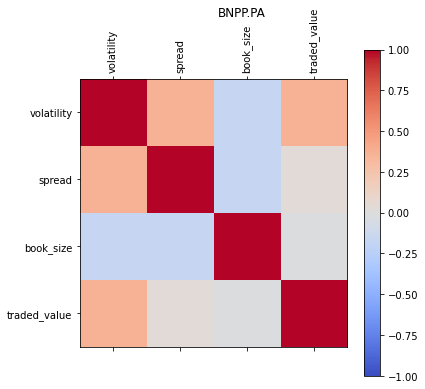

...

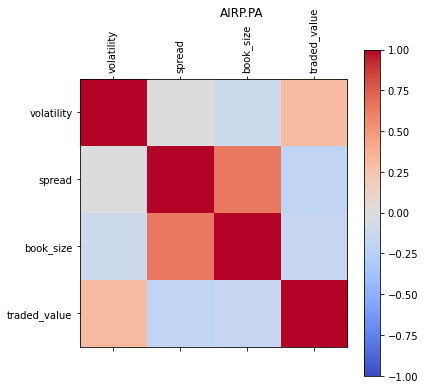

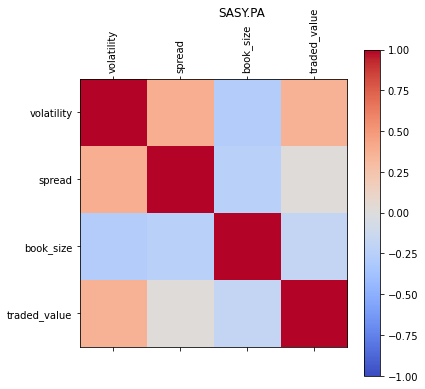

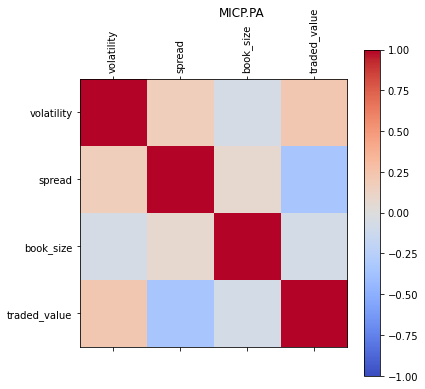

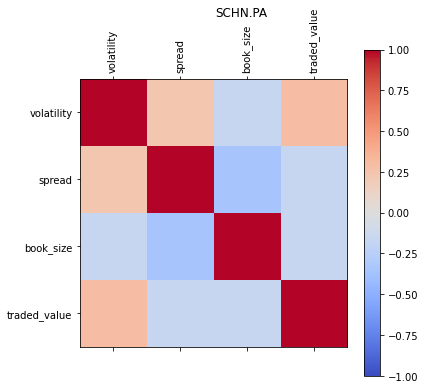

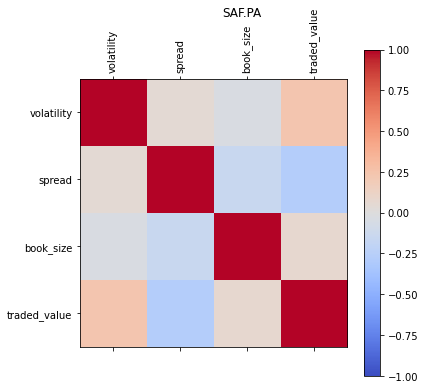

In [0]:
outputPdf = PdfPages('day4-intercorrelation-matrix.pdf')
for stock in os.listdir(path_data_frame_deseasonal):
  data = pd.read_csv(path_data_frame_deseasonal + '/' +stock)
  del data["Unnamed: 0"]
  del data["date"]
  del data["time"]

  new_order = [3,1,0,2]
  data = data[data.columns[new_order]]
  corr = data.corr()
  fig = plt.figure(figsize=(6,6))
  ax = fig.add_subplot(111)
  cax = ax.matshow(corr,cmap='coolwarm', vmin=-1, vmax=1)
  fig.colorbar(cax)
  fig.suptitle("{}".format(stock[11:-7]))
  ticks = np.arange(0,len(data.columns),1)
  ax.set_xticks(ticks)
  plt.xticks(rotation=90)
  ax.set_yticks(ticks)
  ax.set_xticklabels(data.columns)
  ax.set_yticklabels(data.columns)
  outputPdf.savefig()
  print("{} Done".format(stock))
outputPdf.close()